### Importacion de Librerias

In [ ]:
# ── Biblioteca estándar ─────────────────────────────────────────────────────────
import math
import os
import warnings

# ── 3.ºs: núcleo científico y manipulación de datos ─────────────────────────────
import numpy as np
import pandas as pd

# ── 3.ºs: visualización ─────────────────────────────────────────────────────────
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
import streamlit as st 

# ── 3.ºs: ML clásico y gradient boosting ────────────────────────────────────────
from catboost import CatBoostRegressor
from xgboost import XGBRegressor, plot_importance
from sklearn.ensemble import (
    AdaBoostRegressor,
    ExtraTreesRegressor,
    GradientBoostingRegressor,
    RandomForestRegressor
)
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor, NearestNeighbors
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

# ── 3.ºs: series temporales ──────────────────────────────────────────────────────
from prophet import Prophet
import pmdarima as pm
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ── 3.ºs: clustering y reducción de dimensionalidad ─────────────────────────────
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering, DBSCAN, KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# ── 3.ºs: selección de modelos y validación cruzada ─────────────────────────────
from sklearn.model_selection import (
    RandomizedSearchCV,
    TimeSeriesSplit,
    cross_validate,
    train_test_split
)

# ── 3.ºs: métricas de evaluación ────────────────────────────────────────────────
from sklearn.metrics import (
    make_scorer,
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

# ── 3.ºs: utilidades / persistencia ─────────────────────────────────────────────
import joblib

c:\Users\lalo_\TFM\tfm_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



## 2. Comprension de los Datos

### 2.1 Carga y fusion de los datasets

1. Carga de ficheros CSV

In [3]:
# 1) Carga los CSV parseando Date como fecha con dayfirst
df_sales = pd.read_csv(
    "../data/sales.csv",
    parse_dates=["Date"],
    dayfirst=True,
    infer_datetime_format=True
)
df_features = pd.read_csv(
    "../data/Features.csv",
    parse_dates=["Date"],
    dayfirst=True,
    infer_datetime_format=True
)
df_stores = pd.read_csv("../data/stores.csv")

# 2) Fusionar
df_co = (
    df_sales
    .merge(df_features, on=["Store","Date"], how="left")
    .merge(df_stores, on="Store", how="left")
)

# 3) Extraer week, month, year
df_co["week"]  = df_co["Date"].dt.isocalendar().week
df_co["month"] = df_co["Date"].dt.month
df_co["year"]  = df_co["Date"].dt.year

# 4) Verificar
display(df_co.head(5))

,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y,Type,Size,week,month,year
0,1,1,2010-02-05,24924.50,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,5,2,2010
1,1,1,2010-02-12,46039.49,True,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,A,151315,6,2,2010
2,1,1,2010-02-19,41595.55,False,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,A,151315,7,2,2010
3,1,1,2010-02-26,19403.54,False,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,A,151315,8,2,2010
4,1,1,2010-03-05,21827.90,False,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,A,151315,9,3,2010


In [ ]:
joblib.dump(df_co, "models/df_co.pkl")

['models/df_co.pkl']

2.2 Verificacion de duplicados

In [86]:
# Comprobar si IsHoliday_x y IsHoliday_y son idénticas
if df_co['IsHoliday_x'].equals(df_co['IsHoliday_y']):
    # Si son iguales, quedarnos con una sola columna y renombrarla
    df_co['IsHoliday'] = df_co['IsHoliday_x']
    df_co.drop(['IsHoliday_x', 'IsHoliday_y'], axis=1, inplace=True)
    print("IsHoliday_x y IsHoliday_y eran idénticas. Se ha quedao con 'IsHoliday'.")
else:
    # Si hay diferencias, informamos cuántas filas difieren
    diffs = (df_co['IsHoliday_x'] != df_co['IsHoliday_y']).sum()
    print(f"¡Atención! Hay {diffs} filas donde IsHoliday_x y IsHoliday_y difieren.")

IsHoliday_x y IsHoliday_y eran idénticas. Se ha quedao con 'IsHoliday'.


Se cargaron los tres archivos utilizando pandas, se convirtio la columa Date a tipo Datetime.<br>
Se fusionaron las tablas de ventas y caracteristicas externas y despues los metadatos de tienda.<br>
Al final para evitar inconsistencias se comprobo que la variable IsHoliday coincidiera en ambos origenes antes de eliminar el duplicado.

### 2.2 Estructura y resumen inicial

Objetivo. Entender la dimension, cobertura temporal y la granualidad del dataset

2.2.1 Dimension general del dataset

In [87]:
# 1. Dimensión general del dataset
n_registros, n_columnas = df_co.shape
print(f"Total de registros: {n_registros}")
print(f"Total de columnas:  {n_columnas}")

Total de registros: 421570
Total de columnas:  19


2.2.2 Numero de tiendas y departamentos unicos

In [88]:
# 2. Número de tiendas y departamentos únicos
n_tiendas     = df_co['Store'].nunique()
n_departments = df_co['Dept'].nunique()
print(f"Número de tiendas (Store)       : {n_tiendas}")
print(f"Número de departamentos (Dept)  : {n_departments}")

Número de tiendas (Store)       : 45
Número de departamentos (Dept)  : 81


2.2.3 Rango temporal del dataset

In [89]:
# 3. Rango temporal
fecha_min = df_co['Date'].min()
fecha_max = df_co['Date'].max()
print(f"Rango temporal: {fecha_min.date()} a {fecha_max.date()}")

Rango temporal: 2010-02-05 a 2012-10-26


2.2.4 Confirmacion de continuidad de los datos en la linea temporal los Viernes

In [90]:
# 1) Extraer y ordenar las fechas únicas del DataFrame
fechas_unicas = df_co['Date'].drop_duplicates().sort_values()

# 2) Generar el rango esperado de todos los viernes semanales
rango_viernes = pd.date_range(
    start=fechas_unicas.min(),
    end=fechas_unicas.max(),
    freq='W-FRI'
)

# 3) Calcular qué fechas de ese rango NO aparecen en tu dataset
faltantes = rango_viernes.difference(fechas_unicas)

# 4) Contar semanas y convertir a días
n_semanas_faltantes = len(faltantes)
n_dias_faltantes   = n_semanas_faltantes * 7

print(f"Semanas faltantes detectadas : {n_semanas_faltantes}")
print(f"Equivalente en días         : {n_dias_faltantes}")

if n_semanas_faltantes > 0:
    print("\nPrimeras 5 fechas semanales faltantes:")
    print(faltantes[:5].date)
else:
    print("No faltan fechas: el dataset es perfectamente semanal (viernes).")

Semanas faltantes detectadas : 0
Equivalente en días         : 0
No faltan fechas: el dataset es perfectamente semanal (viernes).


Confirmamos que la frecuencia es semanal, siendo este un salto temporal a solo los viernes donde se toma en cuenta las ventas semanales totales

### 2.3 Calidad de los Datos

Objetivo. Identificar valores faltantes, tipos de variables y posibles problemas de memoria o rendimiento

2.3.1 Conteo y porcentaje de valores nulos por columna

In [92]:
# 1) Cantidad y porcentaje de valores nulos por columna
null_counts = df_co.isnull().sum()
null_pct    = (null_counts / len(df_co)) * 100
null_summary = pd.DataFrame({
    'missing_count': null_counts,
    'missing_pct':   null_pct.round(2)
})
print("🔍 Resumen de valores nulos por columna:")
display(null_summary)

🔍 Resumen de valores nulos por columna:


,missing_count,missing_pct
Store,0,0.00
Dept,0,0.00
Date,0,0.00
Weekly_Sales,0,0.00
Temperature,0,0.00
Fuel_Price,0,0.00
MarkDown1,270889,64.26
MarkDown2,310322,73.61
MarkDown3,284479,67.48
MarkDown4,286603,67.98


-La falta de valores en MarkDown son muy grandes, lo cual es entendible considerando que las promociones solo se activan en periodos puntuales. Imputaremos esos valores a 0 para indicar "Sin Promocion" aunque esta estrategia genera una distribucion muy sesgada. Por el momento se usaran pero mas adelante se agregaran variables que puedan suplir estas. <br>
-Las variables externas (Fuel_price, Temperature, CPI y Unemployment) no presentan valores faltantes lo cual facilita su incorporacion en los modelos

2.3.2 Deteccion de tipos de Datos

In [93]:
# 2) Tipos de datos actuales
print("\n📊 Tipos de datos en df_co:")
print(df_co.dtypes)

# 3) Detectar columnas según tipo para sugerir transformaciones
categorical_cols = df_co.select_dtypes(include=['object']).columns.tolist()
datetime_cols    = df_co.select_dtypes(include=['datetime64']).columns.tolist()
numeric_cols     = df_co.select_dtypes(include=['number']).columns.tolist()
bool_cols        = df_co.select_dtypes(include=['bool']).columns.tolist()

print("\n✅ Columnas categóricas (object):", categorical_cols)
print("✅ Columnas datetime           :", datetime_cols)
print("✅ Columnas numéricas          :", numeric_cols)
print("✅ Columnas booleanas          :", bool_cols)


📊 Tipos de datos en df_co:
Store                    int64
Dept                     int64
Date            datetime64[ns]
Weekly_Sales           float64
Temperature            float64
Fuel_Price             float64
MarkDown1              float64
MarkDown2              float64
MarkDown3              float64
MarkDown4              float64
MarkDown5              float64
CPI                    float64
Unemployment           float64
Type                    object
Size                     int64
week                    UInt32
month                    int32
year                     int32
IsHoliday                 bool
dtype: object

✅ Columnas categóricas (object): ['Type']
✅ Columnas datetime           : ['Date']
✅ Columnas numéricas          : ['Store', 'Dept', 'Weekly_Sales', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment', 'Size', 'week', 'month', 'year']
✅ Columnas booleanas          : ['IsHoliday']


2.3.3 Conversion de objects a Category

In [94]:
# - Convertir las object a (category) para reducir memoria y acelerar análisis.
for col in categorical_cols:
    df_co[col] = df_co[col].astype('category')  

Convertimos las columnas de tipo object a category para ahorrar memoria y acelerar los procesos de agrupación y codificacion

### 2.4 Exploracion Univariada

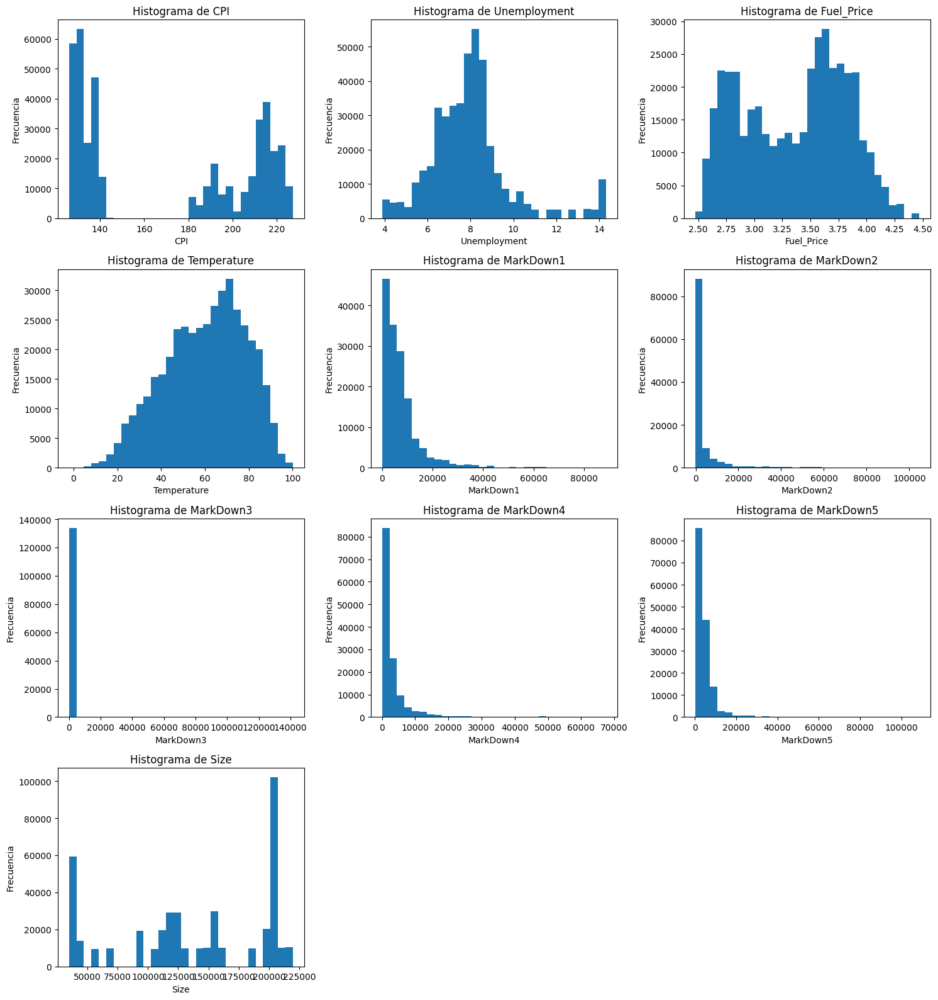

In [ ]:
# 1) Lista de variables numéricas a explorar
numeric_cols = [
    'CPI','Unemployment','Fuel_Price','Temperature',
    'MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5',
    'Size'
]

# 2) Crear un solo plot con todos los histogramas
n = len(numeric_cols)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes = axes.flatten()

for ax, col in zip(axes, numeric_cols):
    data = df_co[col].dropna()
    ax.hist(data, bins=30)
    ax.set_title(f'Histograma de {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frecuencia')

# Eliminar ejes sobrantes
for i in range(n, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


### 2.5 Exploracion Bivariada

Scatterplot con Regresion

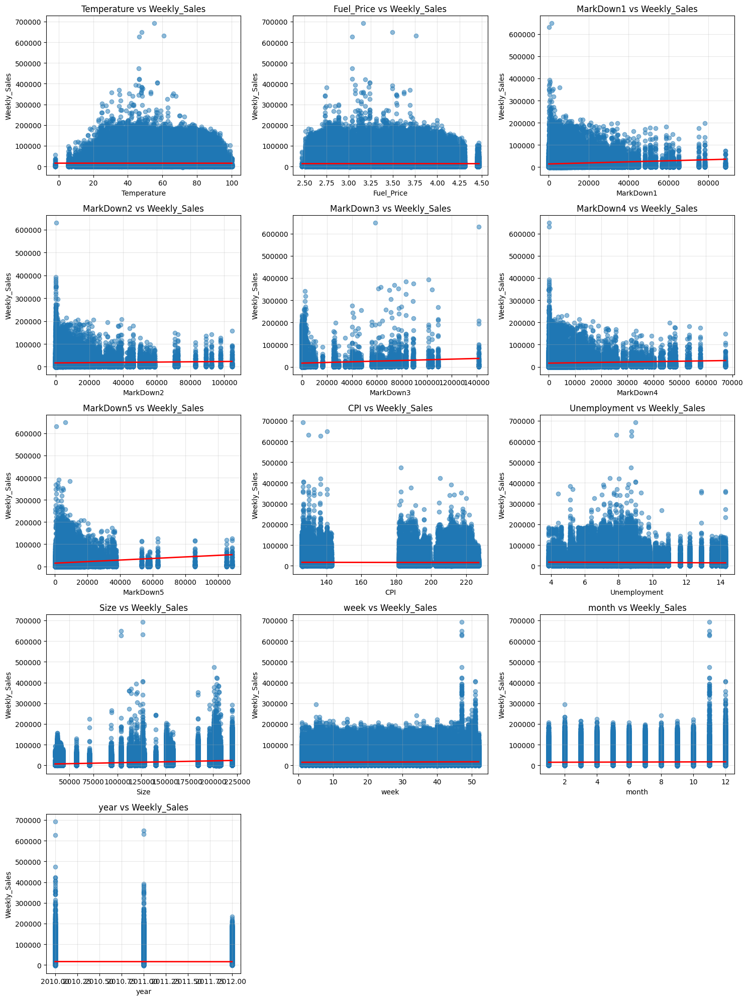

In [96]:
# 1) Seleccionar todas las variables numéricas excepto el objetivo y los IDs
numeric_cols = df_co.select_dtypes(include='number').columns.drop(
    ['Weekly_Sales', 'Store', 'Dept']
).tolist()

# 2) Configurar la cuadrícula de plots
n_vars = len(numeric_cols)
cols = 3
rows = math.ceil(n_vars / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes = axes.flatten()

# 3) Dibujar cada scatter + línea de regresión
for ax, var in zip(axes, numeric_cols):
    x = df_co[var]
    y = df_co['Weekly_Sales']
    mask = x.notna() & y.notna()
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Scatter
    ax.scatter(x_clean, y_clean, alpha=0.5)
    
    # Línea de regresión
    coef = np.polyfit(x_clean, y_clean, 1)
    fit_line = np.poly1d(coef)
    xs = np.linspace(x_clean.min(), x_clean.max(), 100)
    ax.plot(xs, fit_line(xs), color='red', linewidth=2)
    
    ax.set_title(f'{var} vs Weekly_Sales')
    ax.set_xlabel(var)
    ax.set_ylabel('Weekly_Sales')
    ax.grid(alpha=0.3)

# 4) Eliminar ejes sobrantes si los hay
for i in range(n_vars, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

Distribucion de ventas por feriado

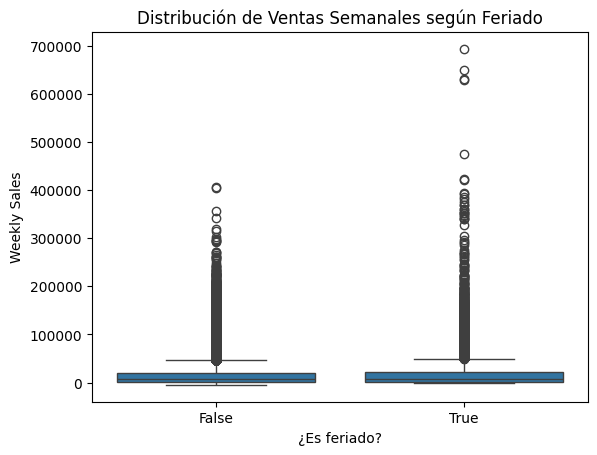

In [97]:
sns.boxplot(x=df_co['IsHoliday'], y=df_co['Weekly_Sales'])
plt.title("Distribución de Ventas Semanales según Feriado")
plt.xlabel("¿Es feriado?")
plt.ylabel("Weekly Sales")
plt.show()

### 2.6 Analisis exploratorio temporal

Objetivo. Confirmar periodicidad, detectar outliers en la serie temporal y visualizar tendencias globales

2.6.1 Grafico de ventas semanales totales

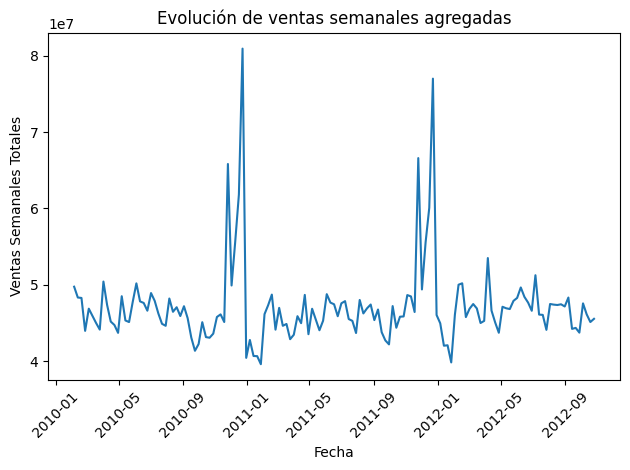

In [98]:
# 1. Evolución de ventas semanales
weekly_sales = df_co.groupby('Date')['Weekly_Sales'].sum().reset_index()
plt.figure()
plt.plot(weekly_sales['Date'], weekly_sales['Weekly_Sales'])
plt.title('Evolución de ventas semanales agregadas')
plt.xlabel('Fecha')
plt.ylabel('Ventas Semanales Totales')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Podemos visualizar picos muy pronunciados en las ultimas semanas del año, fuera de esas fechas la serie se mantiene en un nivel relativamente estable con pequeñas oscilaciones. Esto nos sera util para futuros analisis y posibles usos de series temporales

2.6.2 Boxplots de Weekly_Sales en festivos vs no festivos

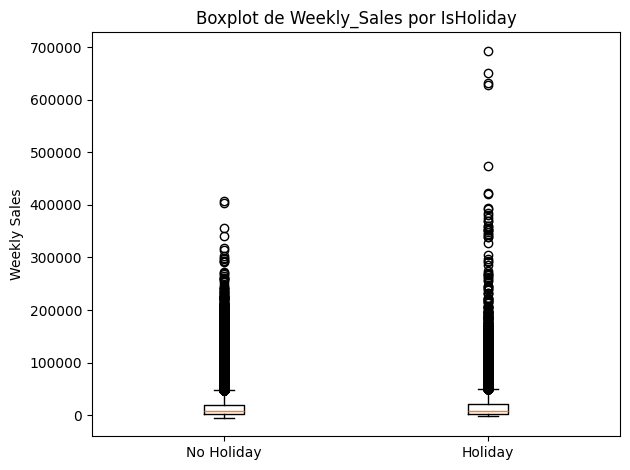

In [99]:
# 2. Boxplot de Weekly_Sales por IsHoliday
plt.figure()
data_holiday = [
    df_co[df_co['IsHoliday'] == False]['Weekly_Sales'],
    df_co[df_co['IsHoliday'] == True]['Weekly_Sales']
]
plt.boxplot(data_holiday, labels=['No Holiday', 'Holiday'])
plt.title('Boxplot de Weekly_Sales por IsHoliday')
plt.ylabel('Weekly Sales')
plt.tight_layout()
plt.show()

Holiday = True, presenta una mediana ligeramente mayor con outliers de hasta 700,000 frente a semanas normales <br>
Los feriados estan aumentando tanto el nivel promedio como volatilidad, paso posterior sera usar intervalos de confianza

2.6.3 Boxplot de Weekly_Sales vs Tipo de Tienda

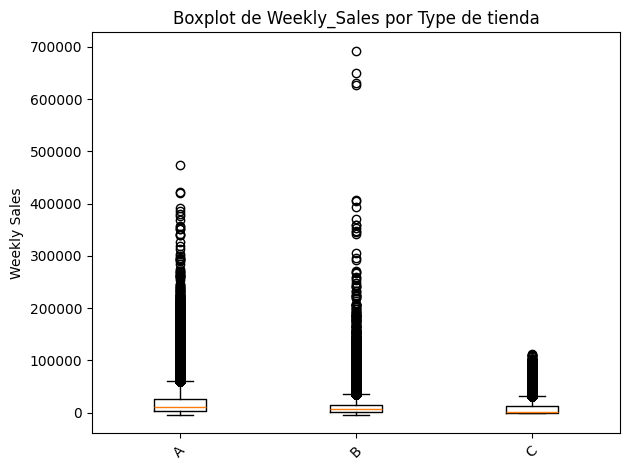

In [100]:
# 3. Boxplot de Weekly_Sales por Type de tienda
types = (df_co['Type'].cat.categories
         if df_co['Type'].dtype.name == 'category'
         else df_co['Type'].unique())
data_type = [df_co[df_co['Type'] == t]['Weekly_Sales'] for t in types]
plt.figure()
plt.boxplot(data_type, labels=types)
plt.title('Boxplot de Weekly_Sales por Type de tienda')
plt.ylabel('Weekly Sales')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Tipo B muestra los valores mas altos de la variable <br>
Codificar con dummies sera importante para esta variable

## 3. Preparacion de los Datos

3.1 Tratamiento de Valores Nulos

In [102]:
# 1) Listado de columnas Markdown
markdown_cols = ['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']

# 2) Rellenar NaN con 0 (ausencia de promoción)
df_co[markdown_cols] = df_co[markdown_cols].fillna(0)

# 3) Crear variable binaria HasPromotion
df_co['HasPromotion'] = (df_co[markdown_cols].sum(axis=1) > 0).astype(int)


# 4) Verificar
print("Valores únicos en HasPromotion:", df_co['HasPromotion'].unique())
print("\nPorcentaje de semanas con promoción:",
      round(df_co['HasPromotion'].mean() * 100, 2), "%")

Valores únicos en HasPromotion: [0 1]

Porcentaje de semanas con promoción: 35.92 %


Este valor explica la cantidad de valores nulos que teniamos en las variables Markdown

3.2 Creacion de nuevas variables

In [103]:
# Variable: HolidaySeason (semanas festivas en noviembre y diciembre)
df_co['HolidaySeason'] = ((df_co['IsHoliday'] == True) & (df_co['month'].isin([11, 12]))).astype(int)

# Variable: IsEndOfYear
df_co['IsEndOfYear'] = df_co['month'].isin([11, 12]).astype(int)

# Variable: WeekSin (estacionalidad cíclica)
df_co['WeekSin'] = np.sin(2 * np.pi * df_co['week'] / 52)

# Variable: Trend (progresión temporal lineal)
df_co['Trend'] = np.arange(len(df_co))

# Variable: PromoStrength (suma de todas las promociones)
df_co['PromoStrength'] = df_co[[f'MarkDown{i}' for i in range(1, 6)]].sum(axis=1)

# Version log-transformada de PromoStrength
df_co['PromoStrength_log'] = np.log1p(df_co['PromoStrength'])


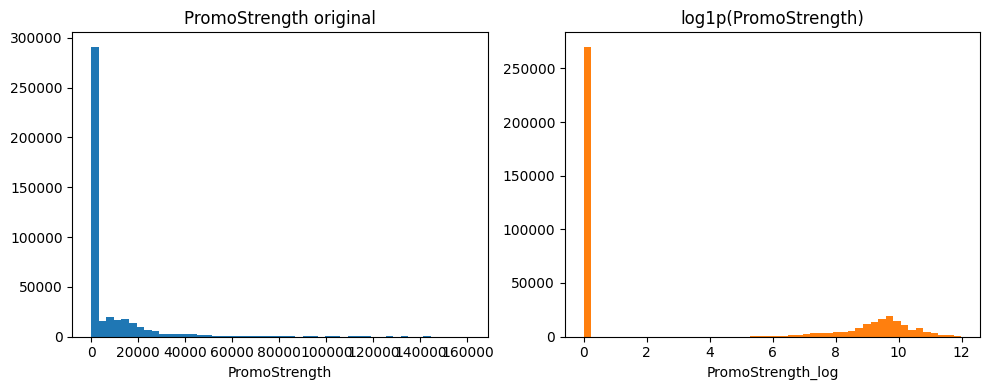

In [104]:

# 1) Crear la versión log-transformada
df_co['PromoStrength_log'] = np.log1p(df_co['PromoStrength'])

# 2) Comparar distribuciones antes y después
fig, axes = plt.subplots(1, 2, figsize=(10,4))

axes[0].hist(df_co['PromoStrength'], bins=50)
axes[0].set_title('PromoStrength original')
axes[0].set_xlabel('PromoStrength')

axes[1].hist(df_co['PromoStrength_log'], bins=50, color='C1')
axes[1].set_title('log1p(PromoStrength)')
axes[1].set_xlabel('PromoStrength_log')

plt.tight_layout()
plt.show()


3.3 Visualizacion de nuevas variables vs Weekly_Sales

In [105]:
# 1) Definir umbrales de outlier en Weekly_Sales
Q1, Q3 = df_co['Weekly_Sales'].quantile([0.25, 0.75])
IQR    = Q3 - Q1
upper = Q3 + 1.5 * IQR

# 2) Separar outliers / inliers
mask_out = df_co['Weekly_Sales'] > upper
df_in  = df_co[~mask_out]
df_out = df_co[ mask_out]

# 3) ¿Qué proporción de outliers ocurrió en HolidaySeason?
p_out_hol = df_out['HolidaySeason'].mean()
p_in_hol  = df_in ['HolidaySeason'].mean()

# 4) ¿Y en EndOfYear?
p_out_eoy = df_out['IsEndOfYear'].mean()
p_in_eoy  = df_in ['IsEndOfYear'].mean()

# 5) PromoStrength medio en outliers vs inliers
promo_out = df_out['PromoStrength'].mean()
promo_in  = df_in ['PromoStrength'].mean()

# 6) Resumir
summary = pd.DataFrame({
    'Metric': ['%HolidaySeason', '%IsEndOfYear', 'PromoStrength_mean'],
    'Outliers': [p_out_hol*100, p_out_eoy*100, promo_out],
    'Inliers':  [p_in_hol*100,  p_in_eoy*100,  promo_in]
})
print(summary.to_string(index=False))

            Metric    Outliers     Inliers
    %HolidaySeason    3.127727    2.796018
      %IsEndOfYear   15.663973   12.395059
PromoStrength_mean 8832.677920 6486.341877


2025-05-01 21:48:48,128 - INFO     - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-05-01 21:48:48,306 - INFO     - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


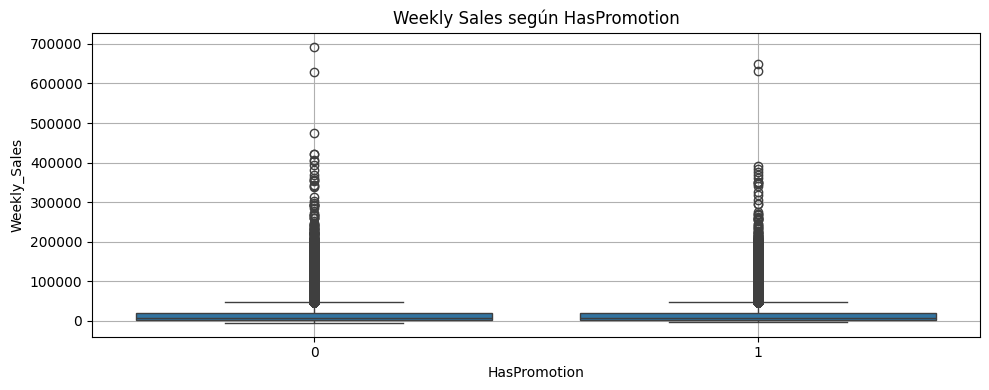

2025-05-01 21:48:48,735 - INFO     - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-05-01 21:48:48,904 - INFO     - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


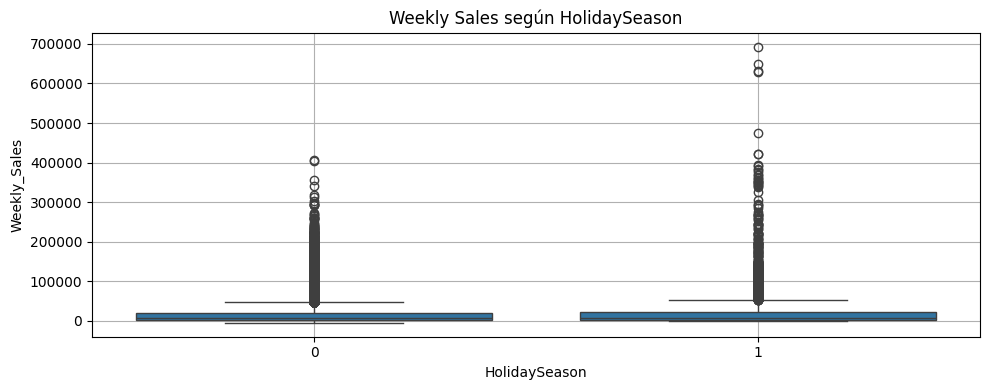

2025-05-01 21:48:49,356 - INFO     - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-05-01 21:48:49,524 - INFO     - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


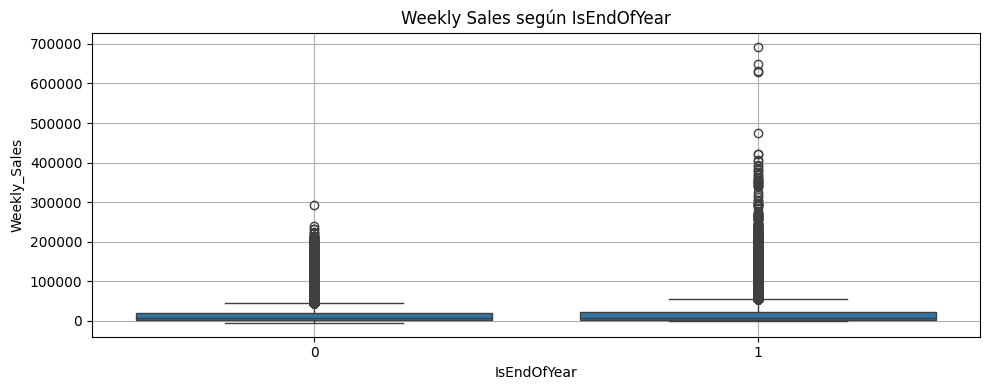

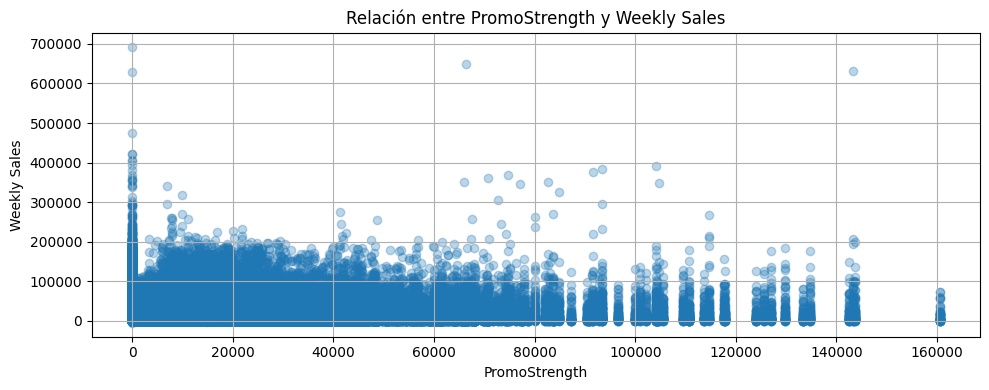

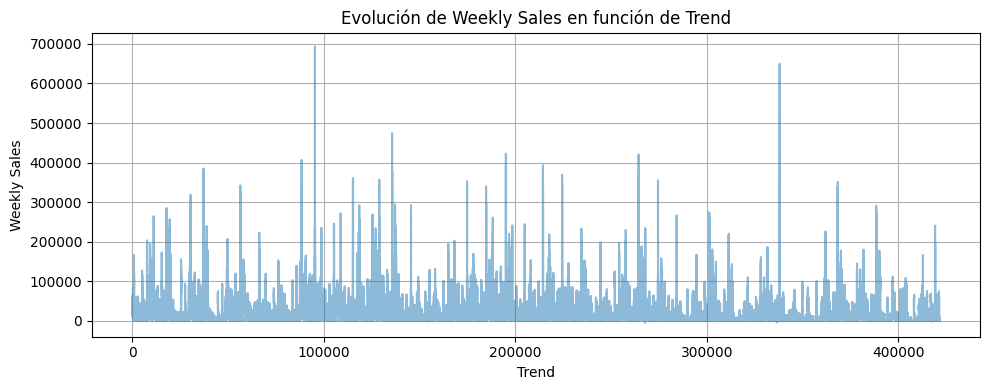

In [106]:
# 3.7 Visualización del impacto de las nuevas variables sobre Weekly Sales
impact_vars = ['HasPromotion', 'HolidaySeason', 'IsEndOfYear']
for var in impact_vars:
    plt.figure(figsize=(10, 4))
    sns.boxplot(x=var, y='Weekly_Sales', data=df_co)
    plt.title(f'Weekly Sales según {var}')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plt.figure(figsize=(10, 4))
plt.scatter(df_co['PromoStrength'], df_co['Weekly_Sales'], alpha=0.3)
plt.title("Relación entre PromoStrength y Weekly Sales")
plt.xlabel("PromoStrength")
plt.ylabel("Weekly Sales")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(df_co['Trend'], df_co['Weekly_Sales'], alpha=0.5)
plt.title("Evolución de Weekly Sales en función de Trend")
plt.xlabel("Trend")
plt.ylabel("Weekly Sales")
plt.grid(True)
plt.tight_layout()
plt.show()


Las dispersiones en los boxplots siguen siendo muy amplias <br>
Scatter de PromoStrenght vs Weekly_Sales no revela una relacion lineal clara <br> 
Tampoco se muestra una tendencia (Trend), solo ruido y picos ocasionales

3.3 Detecciion y tratamiento de Outliers

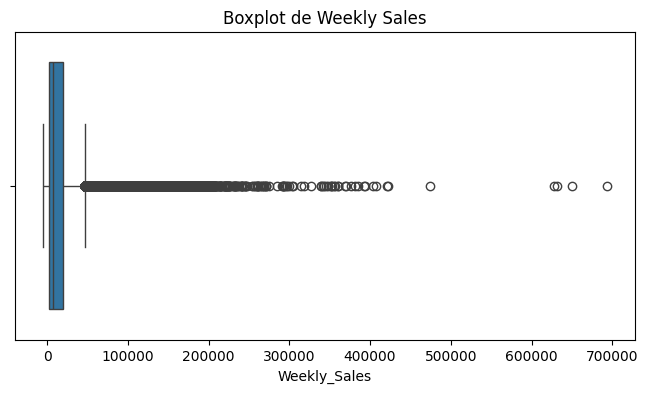

In [107]:
#Boxplot para ver outliers extremos
plt.figure(figsize=(8,4))
sns.boxplot(x=df_co['Weekly_Sales'])
plt.title("Boxplot de Weekly Sales")
plt.show()

Los valores extremos corresponden a semanas de mucha demanda (navidad, black friday, etc.), al quitarlos o tratarlos modificariamos lo que estamos buscando que el modelo prediga. Por lo que se dejara igual

In [108]:
# Calculo de valores extremos
# Cálculo del rango intercuartílico (IQR)
Q1 = df_co['Weekly_Sales'].quantile(0.25)
Q3 = df_co['Weekly_Sales'].quantile(0.75)
IQR = Q3 - Q1

# Límites para definir outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtrar outliers
outliers = df_co[(df_co['Weekly_Sales'] < lower_bound) | (df_co['Weekly_Sales'] > upper_bound)]
print("Total de outliers detectados:", outliers.shape[0])

Total de outliers detectados: 35521


### Boxplots para detectar outliers

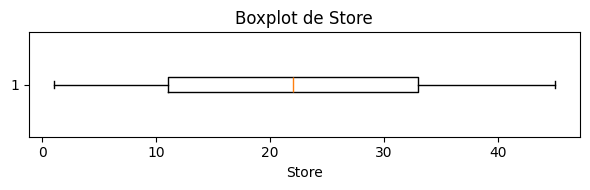

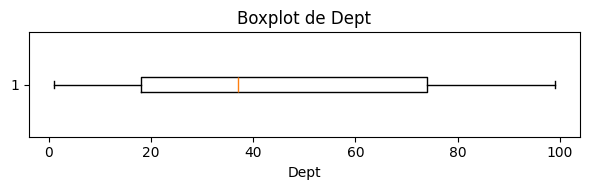

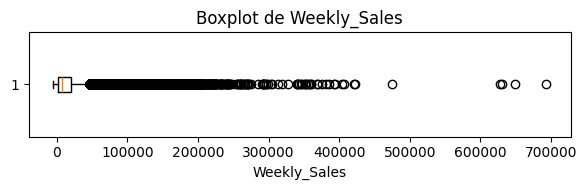

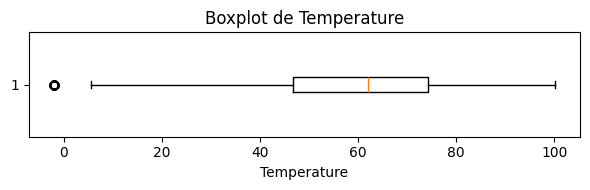

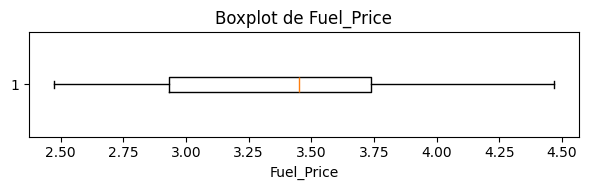

...

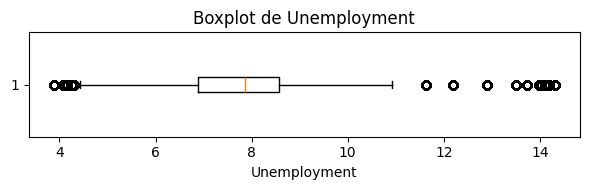

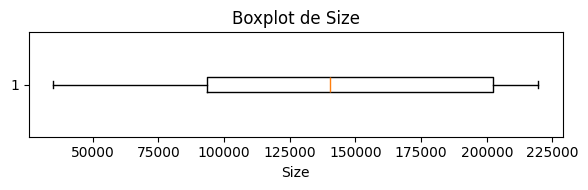

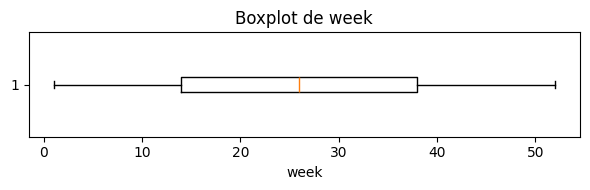

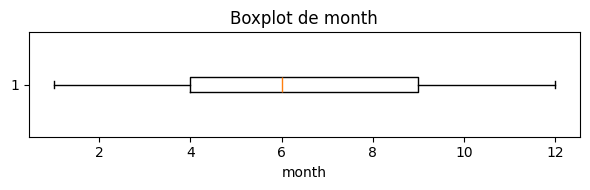

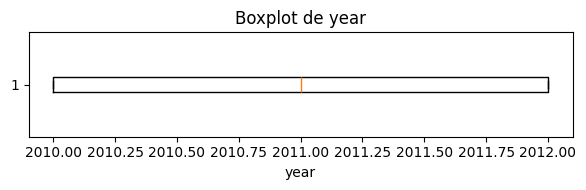

In [109]:
# 3) Boxplots individuales para detectar outliers
for col in numeric_cols:
    data = df_co[col].dropna()
    plt.figure(figsize=(6,2))
    plt.boxplot(data, vert=False)
    plt.title(f'Boxplot de {col}')
    plt.xlabel(col)
    plt.tight_layout()
    plt.show()


Temperature

In [110]:
# 1) Revisar tipo y estadísticos básicos
print("Dtype de Temperature:", df_co['Temperature'].dtype)
print(df_co['Temperature'].describe())

# 2) Filtrar filas donde Temperature es “casi” 0
mask_zero = np.isclose(df_co['Temperature'], 0.0, atol=1e-8)
zero_temp_df = df_co[mask_zero]

print(f"\nRegistros con Temperature ≃ 0: {len(zero_temp_df)}")
if not zero_temp_df.empty:
    # Fechas únicas
    fechas_cero = zero_temp_df['Date'].dt.date.unique()
    print("Fechas con Temperature ≃ 0:")
    for f in fechas_cero:
        print(f)
    # Mostrar ejemplo de registros
    display(zero_temp_df[['Date','Store','Dept','Temperature']].head(10))
else:
    print("No se encontraron valores exactamente a cero.")

Dtype de Temperature: float64
count    421570.000000
mean         60.090059
std          18.447931
min          -2.060000
25%          46.680000
50%          62.090000
75%          74.280000
max         100.140000
Name: Temperature, dtype: float64

Registros con Temperature ≃ 0: 0
No se encontraron valores exactamente a cero.


Podemos deducir que las temperaturas no se deben a errores de captura sino a temporadas de invierno por lo que procederemos a no moverlas.

Unemployment

In [111]:
# Cálculo de los límites
lower = df_co['Unemployment'].quantile(0.01)
upper = df_co['Unemployment'].quantile(0.99)

# Winsorización: todo lo por debajo de lower → lower; por encima de upper → upper
df_co['Unemployment_cap'] = df_co['Unemployment'].clip(lower, upper)

Limitamos los valores extremos para suavizar los outliers con Winsorizacion 

Countplots para variables categoricas

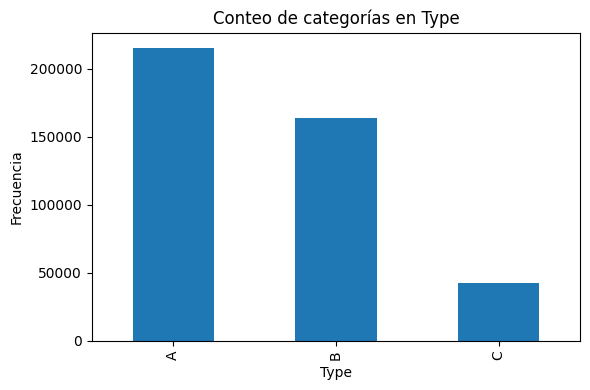

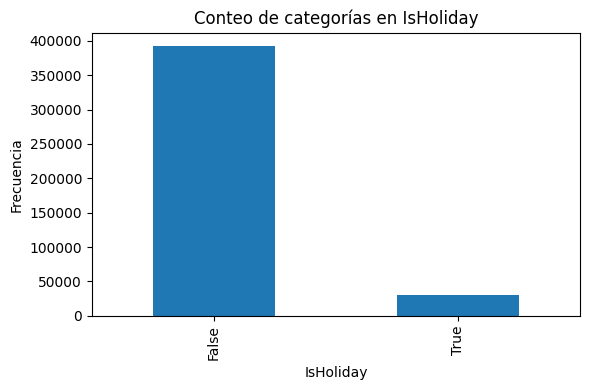

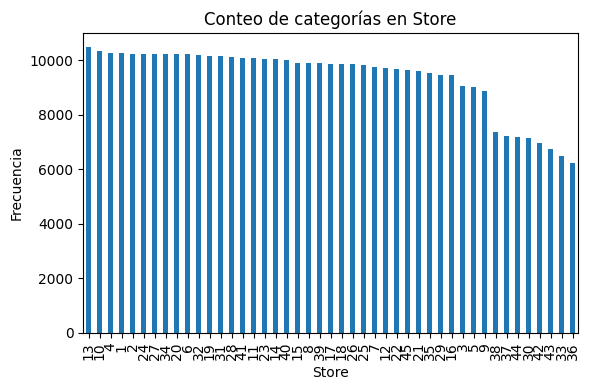

In [112]:
# 4) Countplots para variables categóricas
categorical_cols = ['Type', 'IsHoliday', 'Store']

for col in categorical_cols:
    counts = df_co[col].value_counts(dropna=False)
    plt.figure(figsize=(6,4))
    counts.plot(kind='bar')
    plt.title(f'Conteo de categorías en {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.tight_layout()
    plt.show()

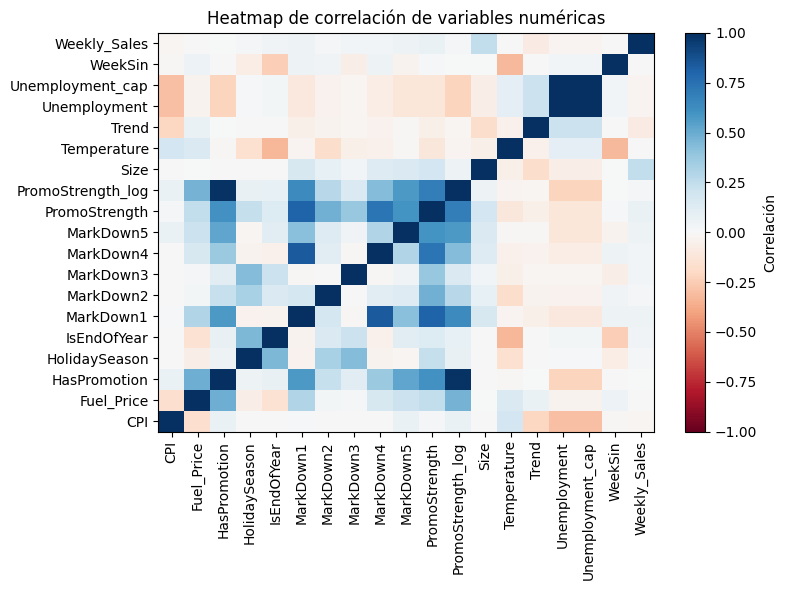

In [113]:
# 3) Heatmap de correlación entre variables numéricas
numeric_cols = df_co.select_dtypes(include='number').columns.difference(
    ['Store', 'Dept', 'week', 'month', 'year']
)
corr = df_co[numeric_cols].corr()

plt.figure(figsize=(8, 6))
plt.pcolor(corr, cmap='RdBu', vmin=-1, vmax=1)
plt.colorbar(label='Correlación')
plt.xticks(np.arange(0.5, len(numeric_cols)), numeric_cols, rotation=90)
plt.yticks(np.arange(0.5, len(numeric_cols)), numeric_cols)
plt.title('Heatmap de correlación de variables numéricas')
plt.tight_layout()
plt.show()

3.5 Codificacion

In [114]:
# Partimos de X con Type (category)
X = df_co[features].copy()

# One-Hot Encoding de Type
X = pd.get_dummies(
    X,
    columns=['Type'],
    prefix='Type',
    drop_first=True
)

print("Columnas tras codificación:")
print(X.columns.tolist())

# Verificar tipos de datos
print(X.dtypes)

Columnas tras codificación:
['CPI', 'Unemployment', 'Fuel_Price', 'Temperature', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'Size', 'IsHoliday', 'year', 'month', 'week', 'Type_B', 'Type_C']
CPI             float64
Unemployment    float64
Fuel_Price      float64
Temperature     float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
Size              int64
IsHoliday          bool
year              int32
month             int32
week             UInt32
Type_B             bool
Type_C             bool
dtype: object


### Seleccion de Variables

1er Modelo

In [115]:
# Definir grupos de variables
vars_externas   = ['CPI', 'Unemployment', 'Fuel_Price', 'Temperature', 'MarkDown1',
                   'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
vars_internas   = ['Size', 'Type', 'IsHoliday']
vars_temporales = ['year', 'month', 'week']

# Variables finales
features = vars_externas + vars_internas + vars_temporales

# Matrices de diseño
X = df_co[features].copy()
y = df_co['Weekly_Sales'].copy()

# (Opcional) Recodificar Type como categoría numérica
X['Type'] = X['Type'].cat.codes

2do Modelo

In [116]:
# Set principal: variables clave resumidas
features_2 = [
    'Size', 'Type',
    'CPI', 'Unemployment', 'Fuel_Price',
    'IsHoliday', 'HasPromotion', 'PromoStrength_log',
    'HolidaySeason', 'IsEndOfYear',
    'week', 'month', 'WeekSin', 'Trend'
]

In [117]:
X_2 = df_co[features_2].copy()

# One-Hot Encoding de Type
X_2 = pd.get_dummies(
    X_2,
    columns=['Type'],
    prefix='Type',
    drop_first=True
)

print("Columnas tras codificación:")
print(X_2.columns.tolist())

# Verificar tipos de datos
print(X_2.dtypes)

Columnas tras codificación:
['Size', 'CPI', 'Unemployment', 'Fuel_Price', 'IsHoliday', 'HasPromotion', 'PromoStrength_log', 'HolidaySeason', 'IsEndOfYear', 'week', 'month', 'WeekSin', 'Trend', 'Type_B', 'Type_C']
Size                   int64
CPI                  float64
Unemployment         float64
Fuel_Price           float64
IsHoliday               bool
HasPromotion           int32
PromoStrength_log    float64
HolidaySeason          int32
IsEndOfYear            int32
week                  UInt32
month                  int32
WeekSin              Float64
Trend                  int32
Type_B                  bool
Type_C                  bool
dtype: object


# 4. Modelado

## 4.1 Analisis y Seleccion de Modelos por nivel de Agregacion

### 4.1.1 Prediccion de Ventas Generales

#### Modelo 1

##### 4.1 Series temporales

4.1.1 Autoarima

In [ ]:
# 1) Definir la serie temporal agregada
weekly_sales = df_co.groupby('Date')['Weekly_Sales'].sum().asfreq('W-FRI')

# 2) Separar en train y test (últimas 36 semanas para test)
n_test = 36
train, test = weekly_sales.iloc[:-n_test], weekly_sales.iloc[-n_test:]

# 3) Ajustar AutoARIMA
model = auto_arima(
    train,
    seasonal=True,        # activar componente estacional
    m=52,                 # periodicidad anual de 52 semanas
    trace=True,           # mostrar progreso
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True         # búsqueda rápida de(p,d,q)
)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[52] intercept   : AIC=3605.191, Time=3.52 sec
 ARIMA(0,0,0)(0,0,0)[52] intercept   : AIC=3653.366, Time=0.00 sec
 ARIMA(1,0,0)(1,0,0)[52] intercept   : AIC=3624.897, Time=1.20 sec
 ARIMA(0,0,1)(0,0,1)[52] intercept   : AIC=3622.551, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[52]             : AIC=4088.900, Time=0.00 sec
 ARIMA(2,0,2)(0,0,1)[52] intercept   : AIC=3614.038, Time=2.12 sec
 ARIMA(2,0,2)(1,0,0)[52] intercept   : AIC=inf, Time=4.01 sec
 ARIMA(2,0,2)(2,0,1)[52] intercept   : AIC=3608.513, Time=38.24 sec
 ARIMA(2,0,2)(1,0,2)[52] intercept   : AIC=3606.941, Time=31.56 sec
 ARIMA(2,0,2)(0,0,0)[52] intercept   : AIC=3643.764, Time=0.33 sec
 ARIMA(2,0,2)(0,0,2)[52] intercept   : AIC=3610.156, Time=13.25 sec
 ARIMA(2,0,2)(2,0,0)[52] intercept   : AIC=3605.459, Time=27.18 sec
 ARIMA(2,0,2)(2,0,2)[52] intercept   : AIC=inf, Time=42.91 sec
 ARIMA(1,0,2)(1,0,1)[52] intercept   : AIC=3611.595, Time=2.24 sec
 ARIMA(2,0,1)(1,0,1)[52]

In [ ]:
# 4) Pronóstico sobre el set de test
n_periods = len(test)
fc, confint = model.predict(n_periods=n_periods, return_conf_int=True)

# 5) Empaquetar resultados en serie
index_fc = test.index
fc_series = pd.Series(fc, index=index_fc)
lower_series = pd.Series(confint[:, 0], index=index_fc)
upper_series = pd.Series(confint[:, 1], index=index_fc)


MAE:  1055971.52
RMSE: 1666420.22


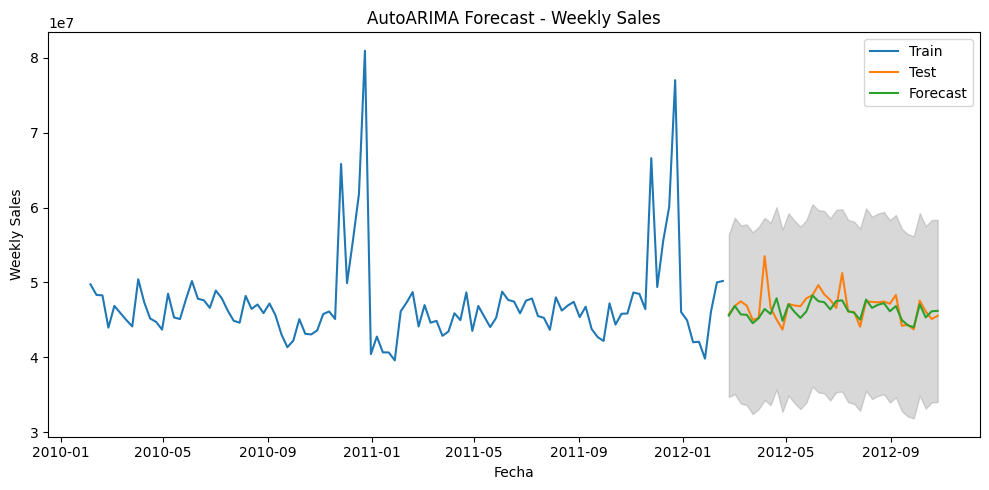

In [ ]:
# 6) Métricas de error
mae = mean_absolute_error(test, fc)
mse = mean_squared_error(test,fc)
rmse = np.sqrt(mse)
print(f"\nMAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

# 7) Visualizar resultados
plt.figure(figsize=(10,5))
plt.plot(train.index, train, label='Train')
plt.plot(test.index,  test,  label='Test')
plt.plot(fc_series.index, fc_series, label='Forecast')
plt.fill_between(lower_series.index,
                 lower_series,
                 upper_series,
                 color='gray', alpha=0.3)
plt.title("AutoARIMA Forecast - Weekly Sales")
plt.xlabel("Fecha")
plt.ylabel("Weekly Sales")
plt.legend()
plt.tight_layout()
plt.show()

4.1.2 Prophet

2025-04-18 23:41:28,797 - DEBUG    - cmd: where.exe tbb.dll
cwd: None


2025-04-18 23:41:28,878 - DEBUG    - TBB already found in load path
2025-04-18 23:41:28,892 - DEBUG    - input tempfile: C:\Users\lalo_\AppData\Local\Temp\tmpmx9kymqw\y9t1yy29.json
2025-04-18 23:41:28,907 - DEBUG    - input tempfile: C:\Users\lalo_\AppData\Local\Temp\tmpmx9kymqw\11eufv_3.json
2025-04-18 23:41:28,907 - DEBUG    - idx 0
2025-04-18 23:41:28,907 - DEBUG    - running CmdStan, num_threads: None
2025-04-18 23:41:28,907 - DEBUG    - CmdStan args: ['C:\\Users\\lalo_\\TFM\\tfm_env\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=54417', 'data', 'file=C:\\Users\\lalo_\\AppData\\Local\\Temp\\tmpmx9kymqw\\y9t1yy29.json', 'init=C:\\Users\\lalo_\\AppData\\Local\\Temp\\tmpmx9kymqw\\11eufv_3.json', 'output', 'file=C:\\Users\\lalo_\\AppData\\Local\\Temp\\tmpmx9kymqw\\prophet_model1paa1o4i\\prophet_model-20250418234128.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
23:41:28 - cmdstanpy - INFO - Chain [1] start processing
2025-04-18 23:41:28,907 - 

MAE:  2557507.89
RMSE: 3572836.51


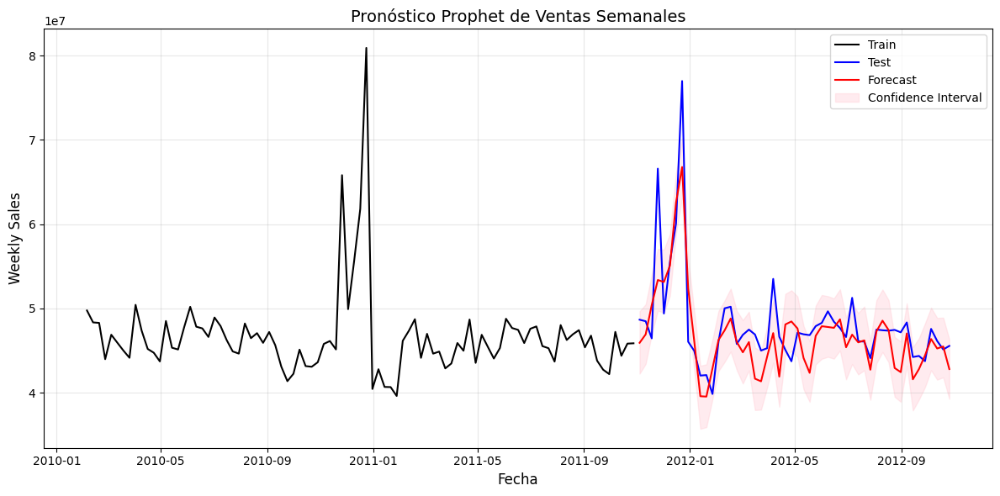

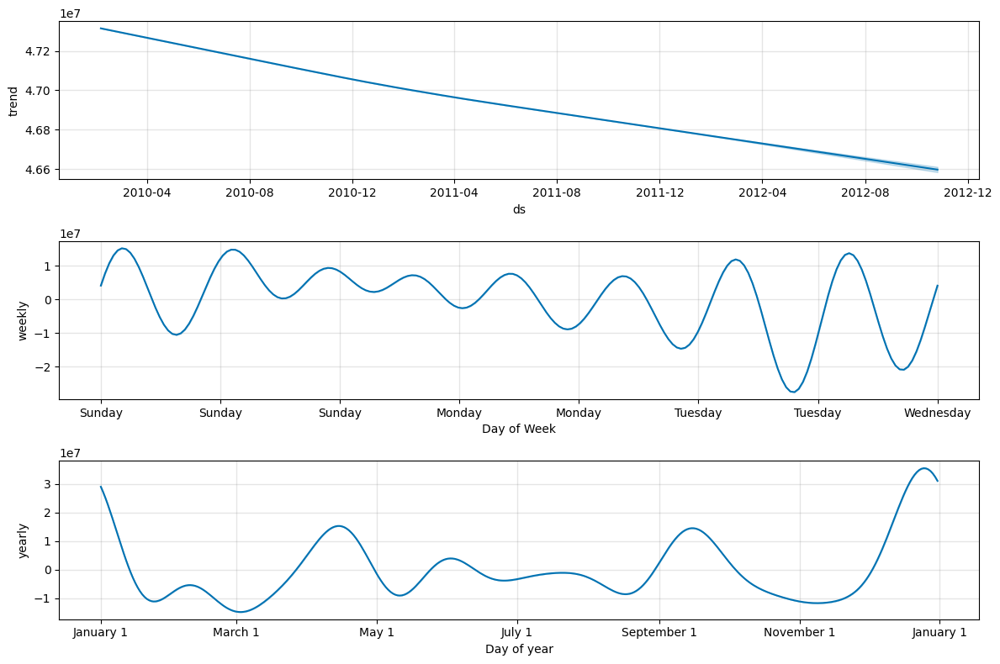

In [ ]:
# 1) Preparar la serie agregada y el index semanal
weekly_sales = df_co.groupby('Date')['Weekly_Sales'] \
                   .sum() \
                   .asfreq('W-FRI') \
                   .reset_index() \
                   .rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'})

# 2) Separar en train y test (últimas 52 semanas para test)
n_test = 52
train_df = weekly_sales.iloc[:-n_test]
test_df  = weekly_sales.iloc[-n_test:]

# 3) Definir y ajustar el modelo Prophet
model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    seasonality_mode='additive'
)
model.add_seasonality(name='weekly', period=52, fourier_order=10)
model.fit(train_df)

# 4) Crear DataFrame de fechas futuras y predecir
future = model.make_future_dataframe(periods=n_test, freq='W-FRI')
forecast = model.predict(future)

# 5) Extraer el pronóstico para el periodo de test
fc_df = forecast.set_index('ds').loc[test_df['ds'], ['yhat', 'yhat_lower', 'yhat_upper']]

# 6) Métricas de error
mae  = mean_absolute_error(test_df['y'], fc_df['yhat'])
mse = mean_squared_error(test_df['y'], fc_df['yhat'])
rmse = np.sqrt(mse)
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

# 7) Visualización profesional
plt.figure(figsize=(12, 6))
plt.plot(train_df['ds'], train_df['y'], color='black', label='Train')
plt.plot(test_df['ds'], test_df['y'],  color='blue',  label='Test')
plt.plot(fc_df.index,        fc_df['yhat'],        color='red',   label='Forecast')
plt.fill_between(
    fc_df.index,
    fc_df['yhat_lower'],
    fc_df['yhat_upper'],
    color='pink',
    alpha=0.3,
    label='Confidence Interval'
)
plt.title('Pronóstico Prophet de Ventas Semanales', fontsize=14)
plt.xlabel('Fecha', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.legend(frameon=True)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 8) Componentes de la descomposición
fig2 = model.plot_components(forecast)
fig2.set_size_inches(12, 8)
plt.tight_layout()
plt.show()

##### 4.2 Modelos con ML

Debido a los bajos resultados predictivos que nos dieron las series temporales optamos por probar los modelos de Machine Learning

In [ ]:
def test_regressors_fast(X, y):
    """
    Entrena varios regresores sin CV
    y devuelve un DataFrame con sus RMSE y MAE en test.
    """
    # Split 70/30 sin shuffle para respetar secuencia temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    regressors = {
        "Linear Regression":        LinearRegression(),
        "Random Forest":            RandomForestRegressor(n_estimators=100, random_state=42),
        "Gradient Boosting":        GradientBoostingRegressor(random_state=42),
        "Support Vector Regressor": SVR(),
        "K-Nearest Neighbors":      KNeighborsRegressor(),
        "Decision Tree":            DecisionTreeRegressor(random_state=42),
        "AdaBoost":                 AdaBoostRegressor(random_state=42),
        "Extra Trees":              ExtraTreesRegressor(random_state=42),
        "XGBoost":                  XGBRegressor(n_estimators=100, random_state=42),
        "CatBoost":                 CatBoostRegressor(
                                        iterations=500,
                                        learning_rate=0.1,
                                        depth=6,
                                        verbose=False,
                                        random_state=42
                                    )
    }

    results = []
    for name, model in regressors.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae  = mean_absolute_error(y_test, y_pred)

        results.append({
            "Modelo":   name,
            "RMSE":     rmse,
            "MAE":      mae
        })

    return pd.DataFrame(results).sort_values("RMSE").reset_index(drop=True)

In [ ]:
results_fast = test_regressors_fast(X, y)
print(results_fast)

                     Modelo          RMSE           MAE
0         Linear Regression  19209.892626  13778.599639
1               Extra Trees  19349.599813  14078.253942
2         Gradient Boosting  19526.744042  14581.859394
3                   XGBoost  19673.235813  14092.154947
4                  CatBoost  19732.370857  15069.688098
5  Support Vector Regressor  19749.934737  11518.520104
6             Decision Tree  19803.901819  14947.290490
7             Random Forest  19815.757161  15030.818241
8                  AdaBoost  22770.353931  17566.649297
9       K-Nearest Neighbors  22956.080097  18077.195292


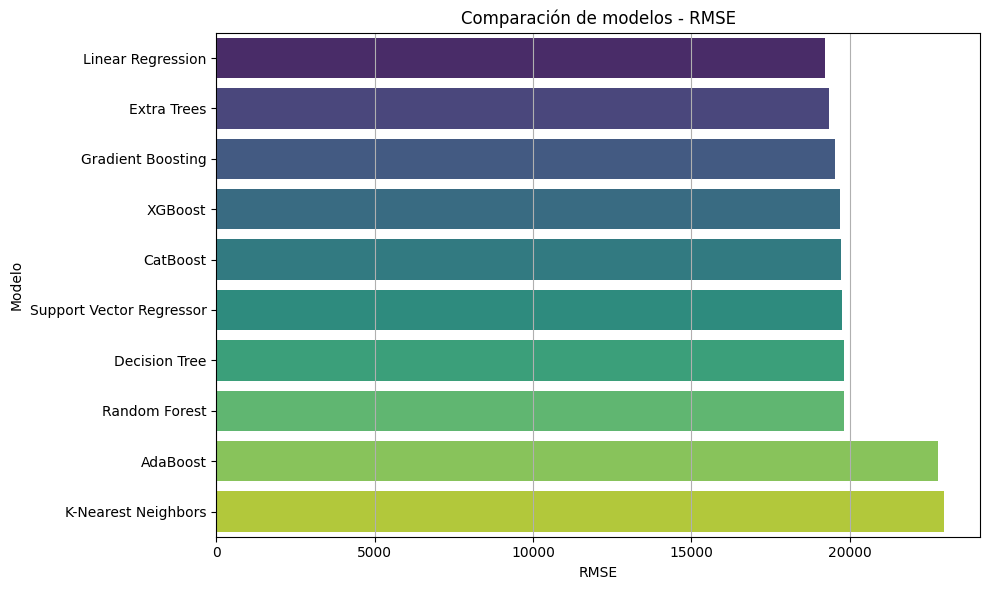

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(data=results_fast, x='RMSE', y='Modelo', palette='viridis')
plt.title('Comparación de modelos - RMSE')
plt.xlabel('RMSE')
plt.ylabel('Modelo')
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

In [ ]:
# 1) Revisar tipo y estadísticos básicos
print("Dtype de Temperature:", df_co['Temperature'].dtype)
print(df_co['Temperature'].describe())

# 2) Filtrar filas donde Temperature es “casi” 0
mask_zero = np.isclose(df_co['Temperature'], 0.0, atol=1e-8)
zero_temp_df = df_co[mask_zero]

print(f"\nRegistros con Temperature ≃ 0: {len(zero_temp_df)}")
if not zero_temp_df.empty:
    # Fechas únicas
    fechas_cero = zero_temp_df['Date'].dt.date.unique()
    print("Fechas con Temperature ≃ 0:")
    for f in fechas_cero:
        print(f)
    # Mostrar ejemplo de registros
    display(zero_temp_df[['Date','Store','Dept','Temperature']].head(10))
else:
    print("No se encontraron valores exactamente a cero.")

Dtype de Temperature: float64
count    421570.000000
mean         60.090059
std          18.447931
min          -2.060000
25%          46.680000
50%          62.090000
75%          74.280000
max         100.140000
Name: Temperature, dtype: float64

Registros con Temperature ≃ 0: 0
No se encontraron valores exactamente a cero.


Buscamos hiperparametros

In [ ]:
# 1) Partir en train/test (sin shuffle para respetar el orden temporal)
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    shuffle=False,
    random_state=42
)

# 2) Definir TimeSeriesSplit para CV
tscv = TimeSeriesSplit(n_splits=5)

Búsqueda aleatoria de hiperparámetros para XGBoost

In [ ]:
xgb = XGBRegressor(random_state=42, objective='reg:squarederror')

xgb_param_dist = {
    'n_estimators':        [100, 300, 500],
    'max_depth':           [3, 5, 7],
    'learning_rate':       [0.01, 0.05, 0.1],
    'subsample':           [0.6, 0.8, 1.0],
    'colsample_bytree':    [0.6, 0.8, 1.0],
    'gamma':               [0, 0.1, 0.3]
}

xgb_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=xgb_param_dist,
    n_iter=20,                       # probar 20 combinaciones aleatorias
    scoring='neg_root_mean_squared_error', # Mantenemos RMSE negativo para la optimización
    cv=tscv,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

print("Buscando hiperparámetros para XGBoost…")
xgb_search.fit(X_train, y_train)

print("Mejores params XGBoost:", xgb_search.best_params_)
print("Best CV RMSE:", -xgb_search.best_score_) # Convertir a positivo para interpretar

# Evaluación en test
best_xgb = xgb_search.best_estimator_
y_pred_xgb = best_xgb.predict(X_test)

# Calcular métricas en el conjunto de prueba
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
test_mae = mean_absolute_error(y_test, y_pred_xgb)
test_r2 = r2_score(y_test, y_pred_xgb) # Calcular el R²

# Imprimir métricas
print("XGBoost — Test RMSE:", test_rmse)
print("XGBoost — Test MAE: ", test_mae)
print("XGBoost — Test R2:   ", test_r2) # Imprimir el R²


Buscando hiperparámetros para XGBoost…
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Mejores params XGBoost: {'subsample': 0.6, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.01, 'gamma': 0.1, 'colsample_bytree': 0.6}
Best CV RMSE: 22485.520338273596
XGBoost — Test RMSE: 19346.756544031046
XGBoost — Test MAE:  14308.173665708508
XGBoost — Test R2:    -0.005532719167453681


Generamos el modelo con los hiperparametros


Evaluando XGBoost en datos agregados semanalmente...


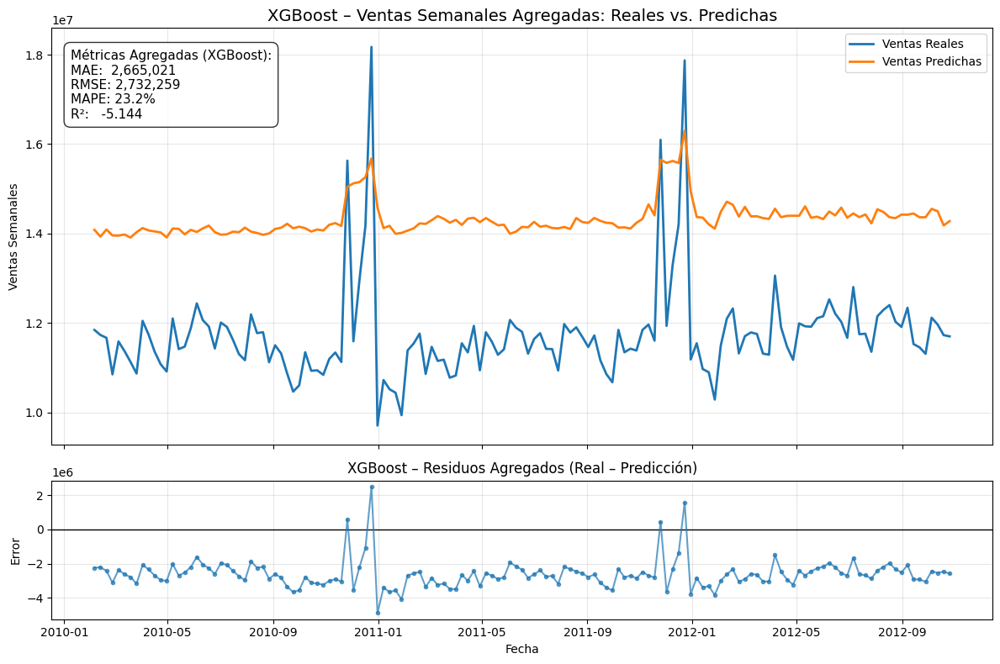

In [ ]:
print("\nEvaluando XGBoost en datos agregados semanalmente...")

# 1) Montar DataFrame de test + predicción y agregar por fecha
# Usamos y_pred_xgb que obtuvimos del modelo XGBoost en el primer bloque
df_pred = pd.DataFrame({
    'Date':      df_co.loc[y_test.index, 'Date'],
    'Actual':    y_test.values,
    'Predicted': y_pred_xgb # <-- AQUÍ USAMOS LAS PREDICCIONES DE XGBOOST
})

# Convertir 'Date' a datetime si no lo está para asegurar correcto agrupamiento y gráfico
df_pred['Date'] = pd.to_datetime(df_pred['Date'])

agg = df_pred.groupby('Date').sum()
y_true_agg = agg['Actual']
y_pred_agg = agg['Predicted']

# 2) Calcular métricas (sobre los datos agregados)
mae_agg  = mean_absolute_error(y_true_agg, y_pred_agg)
rmse_agg = np.sqrt(mean_squared_error(y_true_agg, y_pred_agg))
# Calculamos MAPE, manejando división por cero si hay ventas reales de 0
mape_agg = (np.abs(y_true_agg - y_pred_agg) / y_true_agg.replace(0, np.nan)).mean() * 100
r2_agg   = r2_score(y_true_agg, y_pred_agg) # R² calculado sobre datos agregados

# 3) Graficar serie + residuos 
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True,
                               gridspec_kw={'height_ratios':[3,1]})

# Serie real vs predicha agregada
ax1.plot(agg.index, y_true_agg,  label='Ventas Reales',      linewidth=2)
ax1.plot(agg.index, y_pred_agg,  label='Ventas Predichas', linewidth=2)
ax1.set_title('XGBoost – Ventas Semanales Agregadas: Reales vs. Predichas', fontsize=14)
ax1.set_ylabel('Ventas Semanales')
ax1.grid(alpha=0.3)
ax1.legend()

# Anotar métricas (usando las métricas agregadas)
textstr = '\n'.join([
    "Métricas Agregadas (XGBoost):",
    f"MAE:  {mae_agg:,.0f}",
    f"RMSE: {rmse_agg:,.0f}",
    f"MAPE: {mape_agg:.1f}%",
    f"R²:   {r2_agg:.3f}"
])
ax1.text(0.02, 0.95, textstr, transform=ax1.transAxes,
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8))

# Residuos agregados
residuals_agg = y_true_agg - y_pred_agg
ax2.axhline(0, color='black', linewidth=1)
ax2.plot(agg.index, residuals_agg, marker='o', linestyle='-', markersize=3, alpha=0.7)
ax2.set_title('XGBoost – Residuos Agregados (Real – Predicción)', fontsize=12) 
ax2.set_ylabel('Error')
ax2.set_xlabel('Fecha')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Búsqueda aleatoria de hiperparámetros para ExtraTrees

In [ ]:
et = ExtraTreesRegressor(random_state=42)

et_param_dist = {
    'n_estimators':      [100, 300, 500],
    'max_depth':         [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf':  [1, 2, 4],
    'max_features':      ['sqrt', 'log2', 0.5] 
}

et_search = RandomizedSearchCV(
    estimator=et,
    param_distributions=et_param_dist,
    n_iter=20,
    scoring='neg_root_mean_squared_error', # Mantenemos RMSE negativo para la optimización
    cv=tscv,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

print("\nBuscando hiperparámetros para Extra Trees…")
et_search.fit(X_train, y_train)

print("Mejores params Extra Trees:", et_search.best_params_)
print("Best CV RMSE:", -et_search.best_score_) # Convertir a positivo para interpretar

# Evaluación en test
best_et = et_search.best_estimator_
y_pred_et = best_et.predict(X_test)

# Calcular métricas en el conjunto de prueba
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_et))
test_mae = mean_absolute_error(y_test, y_pred_et)
test_r2 = r2_score(y_test, y_pred_et) # Calcular el R²

# Imprimir métricas
print("Extra Trees — Test RMSE:", test_rmse)
print("Extra Trees — Test MAE: ", test_mae)
print("Extra Trees — Test R2:   ", test_r2) # Imprimir el R²


Buscando hiperparámetros para Extra Trees…
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Mejores params Extra Trees: {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 10}
Best CV RMSE: 22605.74725648692
Extra Trees — Test RMSE: 19376.53461950806
Extra Trees — Test MAE:  14374.140148762111
Extra Trees — Test R2:    -0.008630486257167336


Generamos el modelo de Extra Trees con los hiperparametros


Evaluando Extra Trees en datos agregados semanalmente...


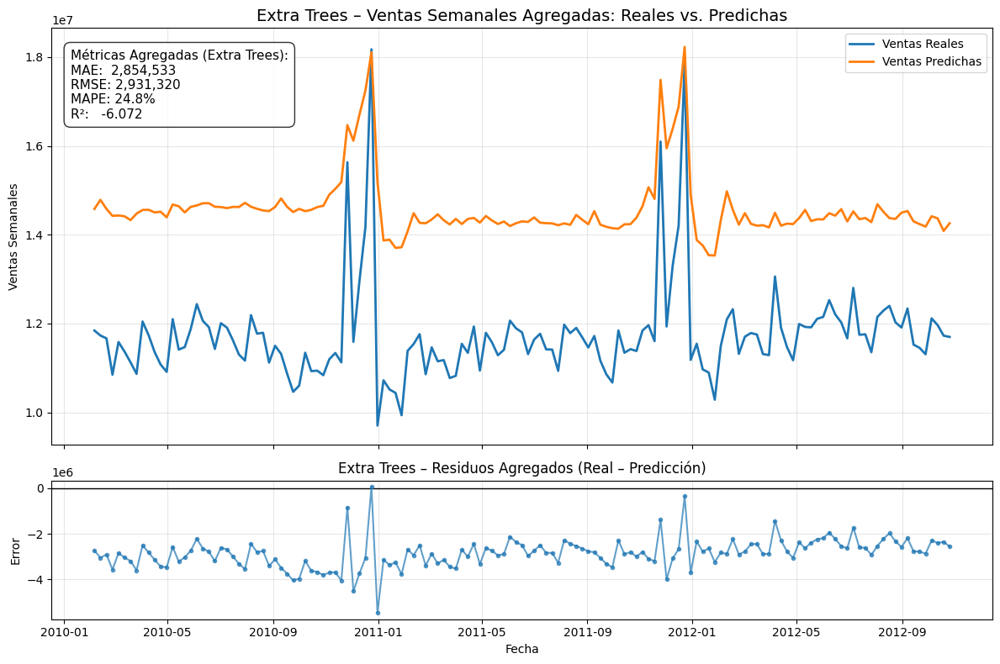

In [ ]:
print("\nEvaluando Extra Trees en datos agregados semanalmente...")

# 1) Montar DataFrame de test + predicción y agregar por fecha
# Usamos y_pred_et que obtuvimos del modelo Extra Trees
df_pred = pd.DataFrame({
    'Date':      df_co.loc[y_test.index, 'Date'],
    'Actual':    y_test.values,
    'Predicted': y_pred_et # <-- AQUÍ USAMOS LAS PREDICCIONES DE EXTRA TREES
})

# Convertir 'Date' a datetime si no lo está para asegurar correcto agrupamiento y gráfico
df_pred['Date'] = pd.to_datetime(df_pred['Date'])

agg = df_pred.groupby('Date').sum()
y_true_agg = agg['Actual'] 
y_pred_agg = agg['Predicted'] 

# 2) Calcular métricas (sobre los datos agregados)
mae_agg  = mean_absolute_error(y_true_agg, y_pred_agg)
rmse_agg = np.sqrt(mean_squared_error(y_true_agg, y_pred_agg)) 
# Calculamos MAPE, manejando división por cero si hay ventas reales de 0
mape_agg = (np.abs(y_true_agg - y_pred_agg) / y_true_agg.replace(0, np.nan)).mean() * 100
r2_agg   = r2_score(y_true_agg, y_pred_agg) # R² calculado sobre datos agregados

# 3) Graficar serie + residuos (usando los datos agregados)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True,
                               gridspec_kw={'height_ratios':[3,1]})

# Serie real vs predicha agregada
ax1.plot(agg.index, y_true_agg,  label='Ventas Reales',      linewidth=2)
ax1.plot(agg.index, y_pred_agg,  label='Ventas Predichas', linewidth=2)
ax1.set_title('Extra Trees – Ventas Semanales Agregadas: Reales vs. Predichas', fontsize=14)
ax1.set_ylabel('Ventas Semanales') 
ax1.grid(alpha=0.3)
ax1.legend()

# Anotar métricas (usando las métricas agregadas)
textstr = '\n'.join([
    "Métricas Agregadas (Extra Trees):", 
    f"MAE:  {mae_agg:,.0f}",
    f"RMSE: {rmse_agg:,.0f}",
    f"MAPE: {mape_agg:.1f}%",
    f"R²:   {r2_agg:.3f}"
])
ax1.text(0.02, 0.95, textstr, transform=ax1.transAxes,
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8))

# Residuos agregados
residuals_agg = y_true_agg - y_pred_agg 
ax2.axhline(0, color='black', linewidth=1)
ax2.plot(agg.index, residuals_agg, marker='o', linestyle='-', markersize=3, alpha=0.7)
ax2.set_title('Extra Trees – Residuos Agregados (Real – Predicción)', fontsize=12) 
ax2.set_ylabel('Error')
ax2.set_xlabel('Fecha')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Los resultados de las predicciones con los datos originales usando los modelos XGBoost y ExtraTrees fueron muy bajos llegando a valores negativos, por lo que proseguimos a sustituir las variables con las creadas y que usaremos en el modelo 2, de esta manera se busco que el modelo estuviera mas adecuado a los picos de ventas ocasionados por promociones o días festivos.

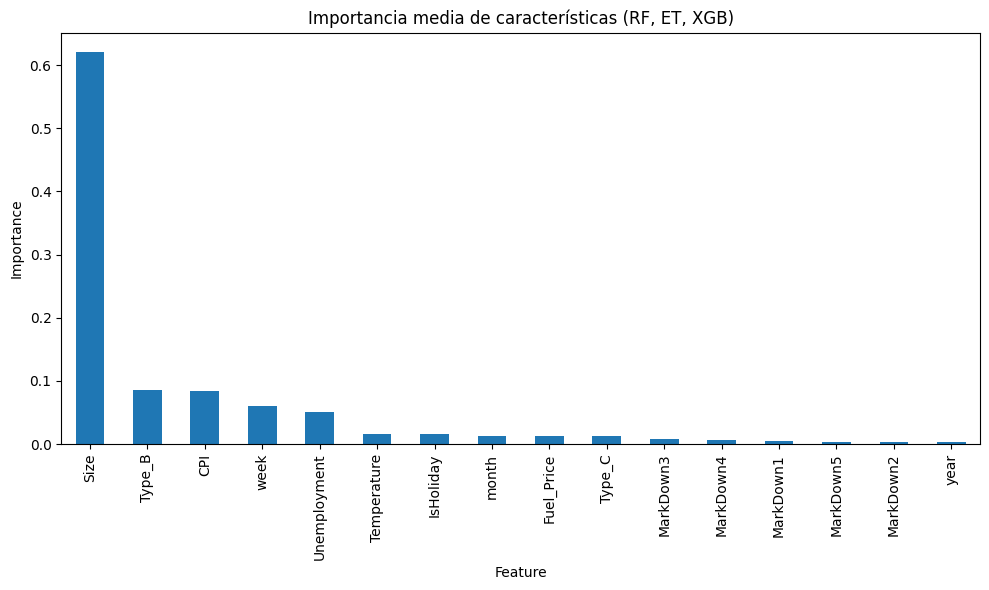

2025-04-25 21:21:16,274 - INFO     - Executing shutdown due to inactivity...
2025-04-25 21:21:16,314 - INFO     - Executing shutdown...
2025-04-25 21:21:16,316 - INFO     - Not running with the Werkzeug Server, exiting by searching gc for BaseWSGIServer


In [ ]:
# ——————————————————————————
# 1) Preparar train/test 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, shuffle=False, random_state=42
)

# ——————————————————————————
# 2) Entrenar los tres modelos (o usar los mejores ya ajustados)
rf  = RandomForestRegressor(n_estimators=100, random_state=42).fit(X_train, y_train)
et  = ExtraTreesRegressor(n_estimators=100, random_state=42).fit(X_train, y_train)
xgb = XGBRegressor(n_estimators=100, random_state=42, objective='reg:squarederror') \
          .fit(X_train, y_train)

# ——————————————————————————
# 3) Recoger importancias en un DataFrame
imp_df = pd.DataFrame({
    'Feature': X.columns,
    'RF_importance':  rf.feature_importances_,
    'ET_importance':  et.feature_importances_,
    'XGB_importance': xgb.feature_importances_
}).set_index('Feature')

# 4) Calcular importancia media y ordenar
imp_df['Mean_importance'] = imp_df.mean(axis=1)
imp_df = imp_df.sort_values('Mean_importance', ascending=False)

# 5) Gráfico de barras de importancia media
plt.figure(figsize=(10,6))
imp_df['Mean_importance'].plot(kind='bar')
plt.title('Importancia media de características (RF, ET, XGB)')
plt.ylabel('Importance')
plt.xlabel('Feature')
plt.tight_layout()
plt.show()


#### Modelo 2

##### Series Temporales

4.2.1 SARIMAX

                                      SARIMAX Results                                       
Dep. Variable:                         Weekly_Sales   No. Observations:                  107
Model:             SARIMAX(2, 0, 2)x(1, 0, [1], 52)   Log Likelihood                -930.743
Date:                              Thu, 01 May 2025   AIC                           1879.485
Time:                                      21:51:30   BIC                           1897.046
Sample:                                  02-05-2010   HQIC                          1886.218
                                       - 02-17-2012                                         
Covariance Type:                                opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
intercept       6.95e+06      0.000   5.48e+10      0.000    6.95e+06    6.95e+06
PromoStren

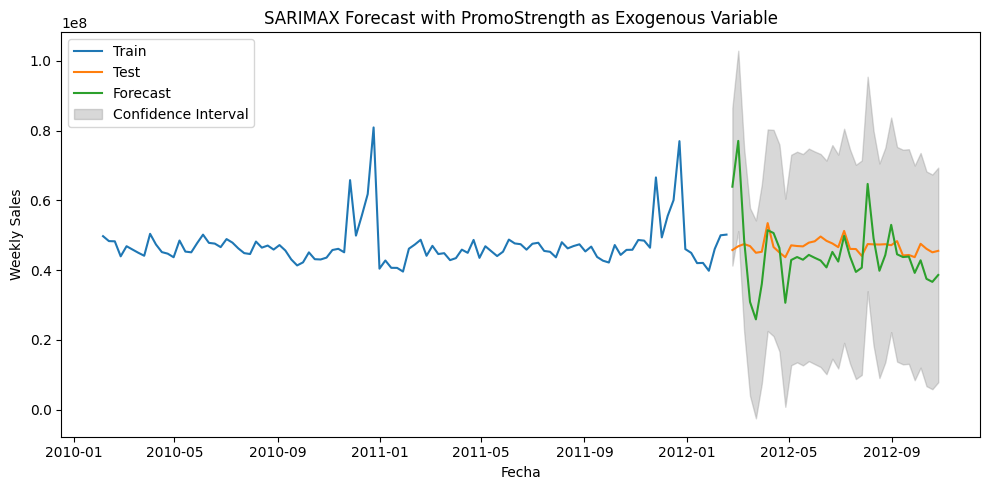

2025-05-01 22:48:27,616 - INFO     - Executing shutdown due to inactivity...


In [ ]:

# 1) Agregar y reindexar la serie semanal (viernes)
weekly = (
    df_co
    .groupby('Date')['Weekly_Sales']
    .sum()
    .asfreq('W-FRI')
)

# 1b) Agregar y reindexar la variable exógena semanal
exog_weekly = (
    df_co
    .groupby('Date')['PromoStrength']
    .mean()  
    .asfreq('W-FRI')
    .fillna(0)  
)

# 2) Train/test split (últimas 36 semanas como test)
n_test = 36
y_train = weekly.iloc[:-n_test]
y_test  = weekly.iloc[-n_test:]

exog_train = exog_weekly.iloc[:-n_test]
exog_test  = exog_weekly.iloc[-n_test:]

# 3) Definir y entrenar SARIMAX con variable exógena
model = SARIMAX(
    y_train,
    exog=exog_train,
    order=(2, 0, 2),
    seasonal_order=(1, 0, 1, 52),
    trend='c',
    enforce_stationarity=False,
    enforce_invertibility=False
)
res = model.fit(disp=False)
print(res.summary())

# 4) Pronóstico
pred = res.get_forecast(steps=n_test, exog=exog_test)
y_pred   = pred.predicted_mean
conf_int = pred.conf_int()

# 5) Métricas de error
mae  = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"\nMAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

# 6) Visualización
plt.figure(figsize=(10,5))
plt.plot(y_train.index, y_train, label='Train')
plt.plot(y_test.index,  y_test,  label='Test')
plt.plot(y_pred.index,  y_pred,  label='Forecast')
plt.fill_between(
    conf_int.index,
    conf_int.iloc[:, 0],
    conf_int.iloc[:, 1],
    color='gray', alpha=0.3,
    label='Confidence Interval'
)
plt.title('SARIMAX Forecast with PromoStrength as Exogenous Variable')
plt.xlabel('Fecha')
plt.ylabel('Weekly Sales')
plt.legend()
plt.tight_layout()
plt.show()


                                      SARIMAX Results                                       
Dep. Variable:                         Weekly_Sales   No. Observations:                  107
Model:             SARIMAX(2, 0, 2)x(1, 0, [1], 52)   Log Likelihood                -871.960
Date:                              Thu, 24 Apr 2025   AIC                           1759.920
Time:                                      07:00:37   BIC                           1775.530
Sample:                                  02-05-2010   HQIC                          1765.904
                                       - 02-17-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   3.035e+07   3.78e-08   8.04e+14      0.000    3.03e+07    3.03e+07
ar.L1         -1.45

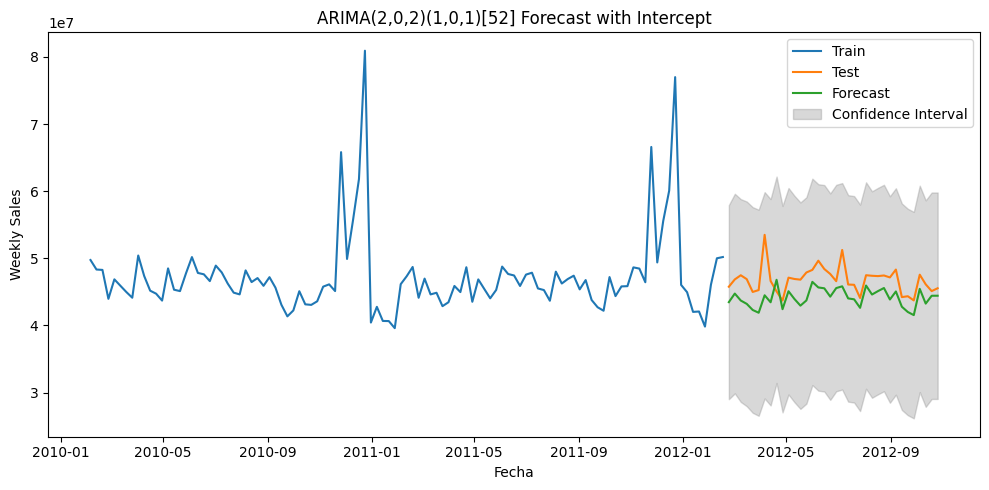

In [ ]:

# 1) Agregar y reindexar la serie semanal (viernes)
weekly = (
    df_co
    .groupby('Date')['Weekly_Sales']
    .sum()
    .asfreq('W-FRI')
)

# 2) Train/test split (últimas 52 semanas como test)
n_test = 36
y_train = weekly.iloc[:-n_test]
y_test  = weekly.iloc[-n_test:]

# 3) Definir y entrenar ARIMA(2,0,2)(1,0,1)[52] con intercepto
model = SARIMAX(
    y_train,
    order=(2, 0, 2),
    seasonal_order=(1, 0, 1, 52),
    trend='c',                    
    enforce_stationarity=False,
    enforce_invertibility=False
)
res = model.fit(disp=False)
print(res.summary())

# 4) Pronóstico
pred = res.get_forecast(steps=n_test)
y_pred   = pred.predicted_mean
conf_int = pred.conf_int()

# 5) Métricas de error
mae  = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"\nMAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

# 6) Visualización
plt.figure(figsize=(10,5))
plt.plot(y_train.index, y_train, label='Train')
plt.plot(y_test.index,  y_test,  label='Test')
plt.plot(y_pred.index,  y_pred,  label='Forecast')
plt.fill_between(
    conf_int.index,
    conf_int.iloc[:, 0],
    conf_int.iloc[:, 1],
    color='gray', alpha=0.3,
    label='Confidence Interval'
)
plt.title('ARIMA(2,0,2)(1,0,1)[52] Forecast with Intercept')
plt.xlabel('Fecha')
plt.ylabel('Weekly Sales')
plt.legend()
plt.tight_layout()
plt.show()

##### 4.2.2 Modelos con ML

In [ ]:
# 2) Extraer X2 e y
X2 = df_co[features_2].copy()
y  = df_co['Weekly_Sales']

# 3) One‑Hot Encoding de Type (drop_first para evitar multicolinealidad)
X2 = pd.get_dummies(X2, columns=['Type'], drop_first=True)

# 4) Convertir bools a int 
bool_cols = X2.select_dtypes(include='bool').columns
X2[bool_cols] = X2[bool_cols].astype(int)

# 5) Revisar que ya no hay columnas object
print("Tipos en X2 tras encoding:")
print(X2.dtypes.value_counts())

Tipos en X2 tras encoding:
int32      8
float64    4
int64      1
UInt32     1
Float64    1
Name: count, dtype: int64


In [75]:
def test_regressors_2(X2, y):

        # 0) One‑Hot Encoding de categóricas al vuelo
    cat_cols = X2.select_dtypes(include=['object','category']).columns.tolist()
    X_num = pd.get_dummies(X2, columns=cat_cols, drop_first=True)
  
    # Split 70/30 sin shuffle para respetar secuencia temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X2, y, test_size=0.3, shuffle=False, random_state=42
    )

    regressors = {
        "Linear Regression":        LinearRegression(),
        "Extra Trees":              ExtraTreesRegressor(random_state=42),
        "XGBoost":                  XGBRegressor(n_estimators=100, random_state=42),

    }

    results = []
    for name, model in regressors.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae  = mean_absolute_error(y_test, y_pred)

        results.append({
            "Modelo":   name,
            "RMSE":     rmse,
            "MAE":      mae
        })

    return pd.DataFrame(results).sort_values("RMSE").reset_index(drop=True)

In [76]:
results_2 = test_regressors_2(X2, y)
print(results_2)

              Modelo          RMSE           MAE
0  Linear Regression  19361.476244  12569.789458
1            XGBoost  19747.144146  14707.988717
2        Extra Trees  21336.307880  12332.717420


Buscamos hiperparametros con CV

In [ ]:
# 1) Configurar TimeSeriesSplit para respetar la dependencia temporal
tscv = TimeSeriesSplit(n_splits=5)

# 2) Definir modelos y espacios de búsqueda

# 2a) XGBoost
xgb = XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_param_dist = {
    'n_estimators':     [100, 300, 500],
    'max_depth':        [3, 5, 7, 9],
    'learning_rate':    [0.01, 0.05, 0.1],
    'subsample':        [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma':            [0, 0.1, 0.3, 0.5]
}
xgb_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=xgb_param_dist,
    n_iter=20,
    scoring='neg_root_mean_squared_error',
    cv=tscv,
    random_state=42,
    n_jobs=-1,
    verbose=2
)

# 2b) Extra Trees
et = ExtraTreesRegressor(random_state=42)
et_param_dist = {
    'n_estimators':      [100, 300, 500],
    'max_depth':         [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf':  [1, 2, 4],
    'max_features':      ['sqrt', 'log2', 0.5]
}
et_search = RandomizedSearchCV(
    estimator=et,
    param_distributions=et_param_dist,
    n_iter=20,
    scoring='neg_root_mean_squared_error',
    cv=tscv,
    random_state=42,
    n_jobs=-1,
    verbose=2
)

# 3) Ejecutar la búsqueda de hiperparámetros sobre X2, y
print("🔍 Afinando XGBoost...")
xgb_search.fit(X2, y)
print("▶️ Mejores parámetros XGBoost:", xgb_search.best_params_)
print("▶️ Mejor CV RMSE (XGBoost):", -xgb_search.best_score_)

print("\n🔍 Afinando Extra Trees...")
et_search.fit(X2, y)
print("▶️ Mejores parámetros Extra Trees:", et_search.best_params_)
print("▶️ Mejor CV RMSE (Extra Trees):", -et_search.best_score_)

# 4) Recuperar los mejores estimadores afinados
best_xgb = xgb_search.best_estimator_
best_et  = et_search.best_estimator_

🔍 Afinando XGBoost...
Fitting 5 folds for each of 20 candidates, totalling 100 fits
▶️ Mejores parámetros XGBoost: {'subsample': 1.0, 'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.05, 'gamma': 0, 'colsample_bytree': 0.6}
▶️ Mejor CV RMSE (XGBoost): 22722.36207995934

🔍 Afinando Extra Trees...
Fitting 5 folds for each of 20 candidates, totalling 100 fits
▶️ Mejores parámetros Extra Trees: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 10}
▶️ Mejor CV RMSE (Extra Trees): 21580.2908375114


Con ayuda de RandomizedSearchCV se obtuvieron los hiperparametros para ambos modelos, siendo XGBoost el modelo con mejor predicción. 

In [78]:
# Definir métricas
scoring = {
    'RMSE': make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred))),
    'MAE':  make_scorer(mean_absolute_error)
}

# Modelos ya afinados
models_tuned = {
    'XGBoost':     best_xgb,
    'Extra Trees': best_et
}

# Ejecutar CV
cv_results = []
for name, model in models_tuned.items():
    res = cross_validate(
        model, X2, y,
        cv=tscv,
        scoring=scoring,
        return_train_score=False,
        n_jobs=-1
    )
    cv_results.append({
        'Modelo':    name,
        'CV RMSE':   res['test_RMSE'].mean(),
        'CV MAE':    res['test_MAE'].mean()
    })

cv_df = pd.DataFrame(cv_results).sort_values('CV RMSE').reset_index(drop=True)
print(cv_df)

        Modelo       CV RMSE        CV MAE
0  Extra Trees  21580.290838  15362.392278
1      XGBoost  22722.362080  15603.692383


XG Boost Modelo General

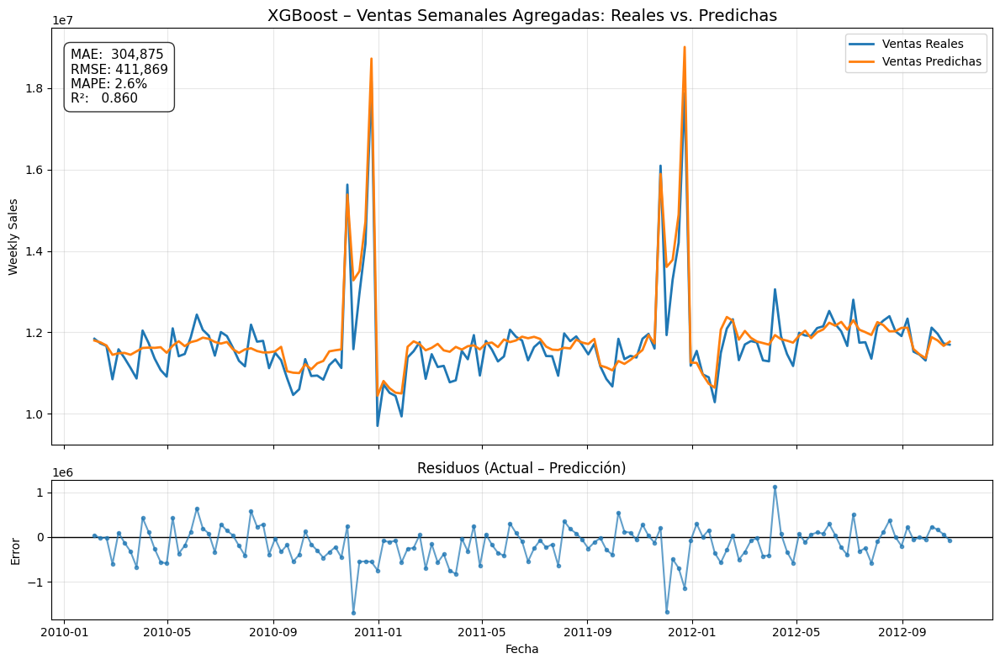

In [ ]:
# 1) Seleccionar features y preparar X, y (incluyendo Date)
features_2 = [
    'Size', 'Type', 'CPI', 'Unemployment', 'Fuel_Price',
    'IsHoliday', 'HasPromotion', 'PromoStrength_log',
    'HolidaySeason', 'IsEndOfYear', 'week', 'month',
    'WeekSin', 'Trend'
]

# Crear X incluyendo la columna Date antes del split
X = df_co[['Date'] + features_2].copy()
X = pd.get_dummies(X, columns=['Type'], drop_first=True)
y = df_co['Weekly_Sales']

# 2) Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, shuffle=False, random_state=42
)

# 3) Guardar fechas y eliminar columna para predicción
X_test_dates = X_test['Date']
X_test = X_test.drop(columns='Date')
X_train = X_train.drop(columns='Date')

# 4) Entrenar modelo (usando best_xgb ya entrenado)

# 5) Predicción y evaluación
y_pred = best_xgb.predict(X_test)

df_xgb = pd.DataFrame({
    'Date': X_test_dates.values,
    'Actual': y_test.values,
    'Predicted': y_pred
})
agg_xgb = df_xgb.groupby('Date').sum()
y_true = agg_xgb['Actual']
y_pred = agg_xgb['Predicted']

# 6) Métricas
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mape = (np.abs(y_true - y_pred) / y_true).replace([np.inf, np.nan], 0).mean() * 100
r2 = r2_score(y_true, y_pred)

# 7) Gráfico
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [3, 1]})

# Panel superior
ax1.plot(agg_xgb.index, y_true, label='Ventas Reales', linewidth=2)
ax1.plot(agg_xgb.index, y_pred, label='Ventas Predichas', linewidth=2)
ax1.set_title('XGBoost – Ventas Semanales Agregadas: Reales vs. Predichas', fontsize=14)
ax1.set_ylabel('Weekly Sales')
ax1.grid(alpha=0.3)
ax1.legend()

# Anotar métricas
textstr = '\n'.join([
    f"MAE:  {mae:,.0f}",
    f"RMSE: {rmse:,.0f}",
    f"MAPE: {mape:.1f}%",
    f"R²:   {r2:.3f}"
])
ax1.text(0.02, 0.95, textstr, transform=ax1.transAxes, 
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8))

# Panel inferior
residuals = y_true - y_pred
ax2.axhline(0, color='black', linewidth=1)
ax2.plot(agg_xgb.index, residuals, marker='o', linestyle='-', markersize=3, alpha=0.7)
ax2.set_title('Residuos (Actual – Predicción)', fontsize=12)
ax2.set_ylabel('Error')
ax2.set_xlabel('Fecha')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

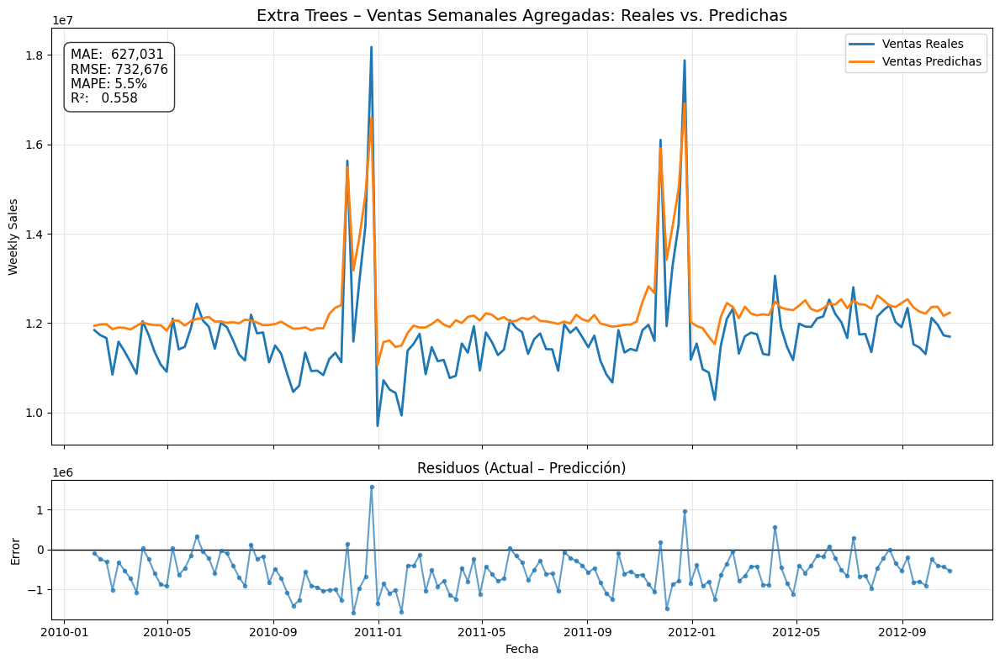

In [ ]:

# 1) Montar DataFrame de test + predicción y agregar por fecha
df_pred = pd.DataFrame({
    'Date':      df_co.loc[y_test.index, 'Date'],
    'Actual':    y_test.values,
    'Predicted': best_et.predict(X_test)
})
agg = df_pred.groupby('Date').sum()
y_true = agg['Actual']
y_pred = agg['Predicted']

# 2) Calcular métricas
mae  = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mape = (np.abs(y_true - y_pred) / y_true).replace([np.inf, np.nan],0).mean() * 100
r2   = r2_score(y_true, y_pred)

# 3) Graficar serie + residuos
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, 
                               gridspec_kw={'height_ratios':[3,1]})

# Serie real vs predicha
ax1.plot(agg.index, y_true,  label='Ventas Reales',    linewidth=2)
ax1.plot(agg.index, y_pred,  label='Ventas Predichas', linewidth=2)
ax1.set_title('Extra Trees – Ventas Semanales Agregadas: Reales vs. Predichas', fontsize=14)
ax1.set_ylabel('Weekly Sales')
ax1.grid(alpha=0.3)
ax1.legend()

# Anotar métricas
textstr = '\n'.join([
    f"MAE:  {mae:,.0f}",
    f"RMSE: {rmse:,.0f}",
    f"MAPE: {mape:.1f}%",
    f"R²:   {r2:.3f}"
])
ax1.text(0.02, 0.95, textstr, transform=ax1.transAxes, 
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8))

# Residuos
residuals = y_true - y_pred
ax2.axhline(0, color='black', linewidth=1)
ax2.plot(agg.index, residuals, marker='o', linestyle='-', markersize=3, alpha=0.7)
ax2.set_title('Residuos (Actual – Predicción)', fontsize=12)
ax2.set_ylabel('Error')
ax2.set_xlabel('Fecha')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()



Elegimos el modelo de XGBoost al tener un R2 de 0.86

In [ ]:
# 1) Asegurarnos de que existe la carpeta donde guardamos
os.makedirs("models", exist_ok=True)
os.makedirs("data",   exist_ok=True)

# 2) Definir y entrenar el modelo final con todos los datos
final_model = XGBRegressor(
    subsample=1.0,
    n_estimators=500,
    max_depth=3,
    learning_rate=0.05,
    gamma=0,
    colsample_bytree=0.6,
    objective='reg:squarederror',
    random_state=42
)
# X_2 ya está preparado y mantiene filas en el mismo orden de df_co
y = df_co["Weekly_Sales"]
final_model.fit(X_2, y)

# 3) Guardar el modelo para Streamlit
joblib.dump(final_model, "models/xgb_general.pkl")

# 4) Crear un CSV de ejemplo con la última fila de X_2
x_sample = X_2.tail(1).reset_index(drop=True)
x_sample.to_csv("data/sample_general.csv", index=False)

print("✅ Modelo general entrenado y guardado en models/xgb_general.pkl")
print("✅ Ejemplo de input guardado en data/sample_general.csv")

✅ Modelo general entrenado y guardado en models/xgb_general.pkl
✅ Ejemplo de input guardado en data/sample_general.csv


In [ ]:
# 1) Calcular MAPE sobre tu test/horizonte de validación
mape = (np.abs(y_true - y_pred) / y_true) \
          .replace([np.inf, np.nan], 0) \
          .mean()

# 2) Definir confiabilidad como 1 − MAPE
reliability_general = 1 - mape

print(f"Confiabilidad (1 − MAPE): {reliability_general:.2%}")

# 3) Guardar la confiabilidad para Streamlit
os.makedirs("models", exist_ok=True)
joblib.dump(reliability_general, "models/general_reliability.pkl")
print("✅ Confiabilidad guardada en models/general_reliability.pkl")

Confiabilidad (1 − MAPE): 94.60%
✅ Confiabilidad guardada en models/general_reliability.pkl


### 4.1.2 Prediccion de Ventas por Tienda

4.2.2.1 Analisis individual por tienda

Registros por tienda (Store):
Store
1     10244
2     10238
3      9036
4     10272
5      8999
6     10211
7      9762
8      9895
9      8867
10    10315
11    10062
12     9705
13    10474
14    10040
15     9901
16     9443
17     9864
18     9859
19    10148
20    10214
21     9582
22     9688
23    10050
24    10228
25     9804
26     9854
27    10225
28    10113
29     9455
30     7156
31    10142
32    10202
33     6487
34    10224
35     9528
36     6222
37     7206
38     7362
39     9878
40    10017
41    10088
42     6953
43     6751
44     7169
45     9637
Name: count, dtype: int64

Registros por departamento (Dept):
Dept
1     6435
2     6435
3     6435
4     6435
5     6347
      ... 
95    6435
96    4854
97    6278
98    5836
99     862
Name: count, Length: 81, dtype: int64


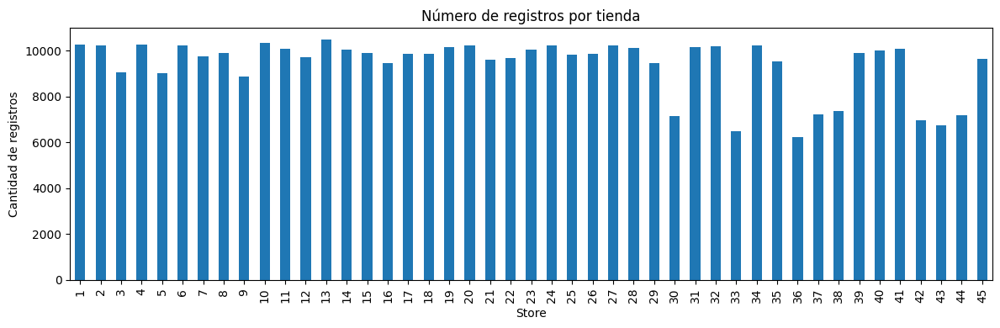

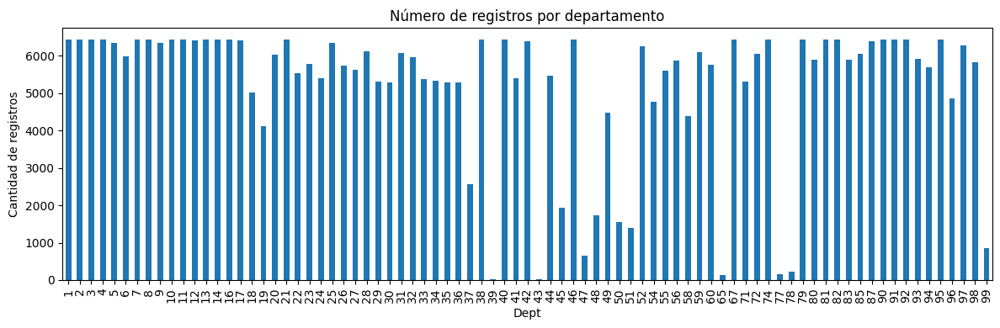

In [ ]:
# 1) Cálculo de conteos
store_counts = df_co['Store'].value_counts().sort_index()
dept_counts  = df_co['Dept'].value_counts().sort_index()

# 2) Mostrar en consola
print("Registros por tienda (Store):")
print(store_counts)
print("\nRegistros por departamento (Dept):")
print(dept_counts)

# 3) Visualización gráfica

# 3a) Conteo por tienda
plt.figure(figsize=(12,4))
store_counts.plot(kind='bar')
plt.title('Número de registros por tienda')
plt.xlabel('Store')
plt.ylabel('Cantidad de registros')
plt.tight_layout()
plt.show()

# 3b) Conteo por departamento
plt.figure(figsize=(12,4))
dept_counts.plot(kind='bar')
plt.title('Número de registros por departamento')
plt.xlabel('Dept')
plt.ylabel('Cantidad de registros')
plt.tight_layout()
plt.show()

Podemos observar que la tienda con menor datos cuenta con al menos mas de la mitad de los datos totales, lo cual al momento puede no influir al momento de hacer el analisis por tiendas

4.2.2.2 Uso de modelo predictivo General para tienda 1

Métricas para Store 1:
XGBoost -> MAE: 88828.38, RMSE: 108665.49, R²: 0.778
ExtraTrees -> MAE: 167982.70, RMSE: 197538.65, R²: 0.266


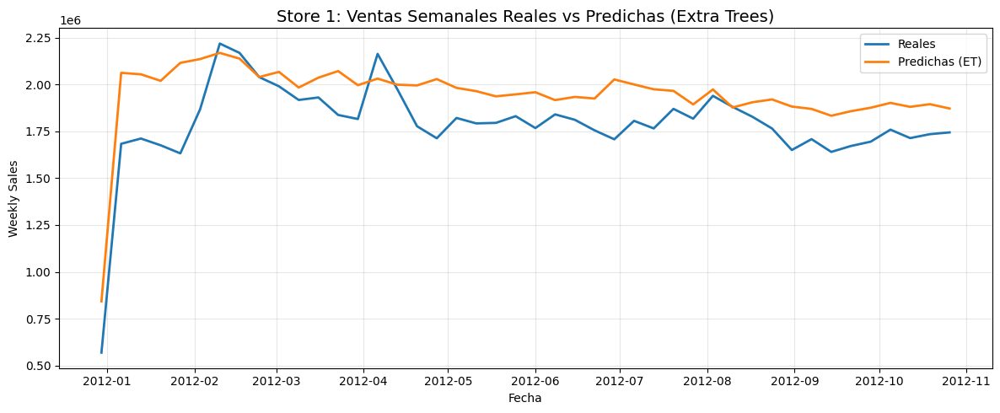

In [ ]:

# 1) Filtrar datos de la tienda 1 y ordenar por fecha
df1 = df_co[df_co['Store'] == 10].sort_values('Date')

# 2) Definir las mismas features usadas globalmente
features_2 = [
    'Size', 'CPI', 'Unemployment', 'Fuel_Price',
    'IsHoliday', 'HasPromotion', 'PromoStrength_log',
    'HolidaySeason', 'IsEndOfYear', 'week', 'month',
    'WeekSin', 'Trend'
]
# Incluimos Type en dummies
X1 = df1[features_2 + ['Type']].copy()
y1 = df1['Weekly_Sales']

# 3) Codificar Type y bools
X1 = pd.get_dummies(X1, columns=['Type'], drop_first=True)
bool_cols = X1.select_dtypes(include='bool').columns
X1[bool_cols] = X1[bool_cols].astype(int)

# 4) Train/test split (70/30, sin shuffle)
X1_train, X1_test, y1_train, y1_test = train_test_split(
    X1, y1, test_size=0.3, shuffle=False, random_state=42
)

# 5) Instanciar modelos usando los mejores parámetros encontrados
model_xgb = XGBRegressor(**best_xgb.get_params())
model_et  = ExtraTreesRegressor(**best_et.get_params())

# 6) Ajustar en train
model_xgb.fit(X1_train, y1_train)
model_et.fit(X1_train, y1_train)

# 7) Predecir en test
xgb_pred = model_xgb.predict(X1_test)
et_pred  = model_et.predict(X1_test)

# 8) Crear DataFrame con fechas, reales y predichas
df_pred1 = pd.DataFrame({
    'Date':      df1.loc[y1_test.index, 'Date'],
    'Actual':    y1_test.values,
    'XGB':       xgb_pred,
    'ET':        et_pred
}).groupby('Date').sum()

# 9) Calcular métricas agregadas
metrics = {}
for name, preds in [('XGBoost', df_pred1['XGB']), ('ExtraTrees', df_pred1['ET'])]:
    mae  = mean_absolute_error(df_pred1['Actual'], preds)
    rmse = np.sqrt(mean_squared_error(df_pred1['Actual'], preds))
    r2   = r2_score(df_pred1['Actual'], preds)
    metrics[name] = (mae, rmse, r2)

# 10) Mostrar métricas
print("Métricas para Store 1:")
for name, (mae, rmse, r2) in metrics.items():
    print(f"{name} -> MAE: {mae:.2f}, RMSE: {rmse:.2f}, R²: {r2:.3f}")

# 11) Gráfico de ventas reales vs predichas (Extra Trees)
plt.figure(figsize=(12,5))
plt.plot(df_pred1.index, df_pred1['Actual'], label='Reales', linewidth=2)
plt.plot(df_pred1.index, df_pred1['ET'],       label='Predichas (ET)', linewidth=2)
plt.title('Store 1: Ventas Semanales Reales vs Predichas (Extra Trees)', fontsize=14)
plt.xlabel('Fecha')
plt.ylabel('Weekly Sales')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Con los valores de MAE: 88828.38, RMSE: 108665.49, R²: 0.778.
No fue una mala predicción, sin embargo, el resultado podría indicar que cada tienda opera de distinta forma. 


Métricas para Store 1:
XGBoost -> MAE: 88828.38, RMSE: 108665.49, R²: 0.778
ExtraTrees -> MAE: 167982.70, RMSE: 197538.65, R²: 0.266


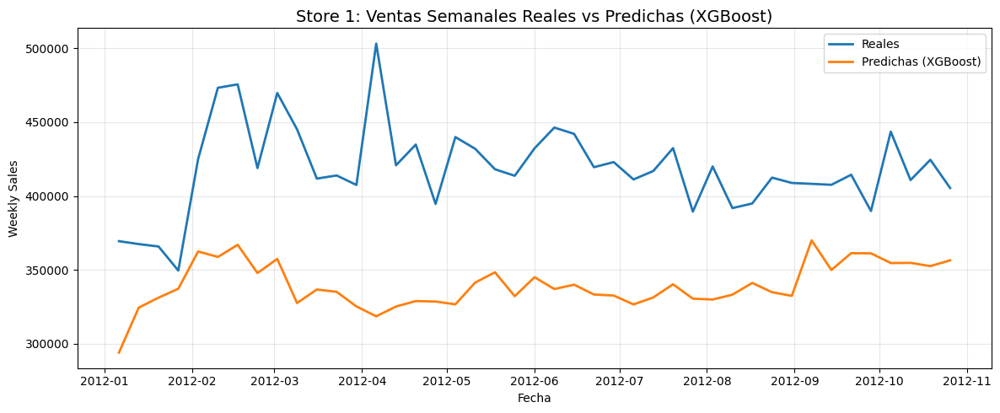

In [ ]:
# 1) Filtrar datos de la tienda 1 y ordenar por fecha
df1 = df_co[df_co['Store'] == 3].sort_values('Date')

# 2) Definir las mismas features usadas globalmente
features_2 = [
    'Size', 'CPI', 'Unemployment', 'Fuel_Price',
    'IsHoliday', 'HasPromotion', 'PromoStrength_log',
    'HolidaySeason', 'IsEndOfYear', 'week', 'month',
    'WeekSin', 'Trend'
]
X1 = df1[features_2 + ['Type']].copy()
y1 = df1['Weekly_Sales']

# 3) Codificar Type y bools
X1 = pd.get_dummies(X1, columns=['Type'], drop_first=True)
bool_cols = X1.select_dtypes(include='bool').columns
X1[bool_cols] = X1[bool_cols].astype(int)

# 4) Train/test split (70/30, sin shuffle)
X1_train, X1_test, y1_train, y1_test = train_test_split(
    X1, y1, test_size=0.3, shuffle=False, random_state=42
)

# 5) Instanciar XGBoost usando los mejores parámetros encontrados
model_xgb = XGBRegressor(**best_xgb.get_params())

# 6) Ajustar en train
model_xgb.fit(X1_train, y1_train)

# 7) Predecir en test
xgb_pred = model_xgb.predict(X1_test)

# 8) Crear DataFrame con fechas, reales y predichas y agregar por fecha
df_pred_xgb = pd.DataFrame({
    'Date':      df1.loc[y1_test.index, 'Date'],
    'Actual':    y1_test.values,
    'XGB':       xgb_pred
}).groupby('Date').sum().reset_index()

# 10) Mostrar métricas
print("Métricas para Store 1:")
for name, (mae, rmse, r2) in metrics.items():
    print(f"{name} -> MAE: {mae:.2f}, RMSE: {rmse:.2f}, R²: {r2:.3f}")
    
# 9) Graficar ventas reales vs predichas (XGBoost)
plt.figure(figsize=(12, 5))
plt.plot(df_pred_xgb['Date'], df_pred_xgb['Actual'], label='Reales', linewidth=2)
plt.plot(df_pred_xgb['Date'], df_pred_xgb['XGB'],    label='Predichas (XGBoost)', linewidth=2)
plt.title('Store 1: Ventas Semanales Reales vs Predichas (XGBoost)', fontsize=14)
plt.xlabel('Fecha')
plt.ylabel('Weekly Sales')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Con las metricas para la tienda 1 podemos darnos cuenta que hay una diferencia muy grande en cuanto a como cada modelo hace la prediccion. Aunque la prediccion sea relativamente buena con el modelo de XGBoost (R2 = 0.778), buscaremos optimizar el modelo con la obtencion de hiperparametros y CV usando RandomizedSearchCV

In [ ]:

# 1) Filtrar datos de la tienda 1 y ordenar por fecha
df1 = df_co[df_co['Store'] == 1].sort_values('Date')

# 2) Definir features y vector objetivo
features_2 = [
    'Size', 'CPI', 'Unemployment', 'Fuel_Price',
    'IsHoliday', 'HasPromotion', 'PromoStrength_log',
    'HolidaySeason', 'IsEndOfYear', 'week', 'month',
    'WeekSin', 'Trend'
]
X1 = df1[features_2 + ['Type']].copy()
y1 = df1['Weekly_Sales']

# 3) One‑Hot Encoding de Type y conversión de bools a int
X1 = pd.get_dummies(X1, columns=['Type'], drop_first=True)
bool_cols = X1.select_dtypes(include='bool').columns
X1[bool_cols] = X1[bool_cols].astype(int)

# 4) Split temporal (70% train, 30% test) para posicionar índices
split_idx = int(len(X1) * 0.7)
X1_train, X1_test = X1.iloc[:split_idx], X1.iloc[split_idx:]
y1_train, y1_test = y1.iloc[:split_idx], y1.iloc[split_idx:]

# 5) Configurar TimeSeriesSplit para CV
tscv = TimeSeriesSplit(n_splits=5)

# 6) Definir XGBoost y espacio de hiperparámetros
xgb = XGBRegressor(objective='reg:squarederror', random_state=42)
param_dist = {
    'n_estimators':     [100, 300, 500],
    'max_depth':        [3, 5, 7, 9],
    'learning_rate':    [0.01, 0.05, 0.1],
    'subsample':        [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma':            [0, 0.1, 0.3, 0.5]
}

xgb_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_dist,
    n_iter=20,
    scoring='neg_root_mean_squared_error',
    cv=tscv,
    random_state=42,
    n_jobs=-1,
    verbose=2
)

# 7) Ejecutar búsqueda de hiperparámetros solo sobre train de Store 1
print("🔍 Afinando XGBoost para Store 1…")
xgb_search.fit(X1_train, y1_train)

print("▶️ Mejores parámetros XGBoost:", xgb_search.best_params_)
print("▶️ Mejor CV RMSE (XGBoost):", -xgb_search.best_score_)

# 8) Guardar el modelo afinado
best_xgb_store1 = xgb_search.best_estimator_


🔍 Afinando XGBoost para Store 1…
Fitting 5 folds for each of 20 candidates, totalling 100 fits
▶️ Mejores parámetros XGBoost: {'subsample': 0.8, 'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0.3, 'colsample_bytree': 0.8}
▶️ Mejor CV RMSE (XGBoost): 10022.254182746154


Obtenidos los hiperparametros haremos CV con TimeSeriesSplit donde el numero de splits=5

In [ ]:
# 1) Configurar CV temporal
tscv = TimeSeriesSplit(n_splits=5)

# 2) Definir métricas de scoring
scoring = {
    'RMSE': make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred))),
    'MAE':  make_scorer(mean_absolute_error)
}

# 3) Ejecutar cross-validation en X1_train, y1_train
cv_results = cross_validate(
    best_xgb_store1,
    X1_train, y1_train,
    cv=tscv,
    scoring=scoring,
    return_train_score=False,
    n_jobs=-1
)

# 4) Mostrar medias y desviaciones
rmse_scores = cv_results['test_RMSE']
mae_scores  = cv_results['test_MAE']

print("Resultados CV (5 folds) para XGBoost en Store 1:")
print(f"RMSE: {rmse_scores.mean():.2f} ± {rmse_scores.std():.2f}")
print(f"MAE:  {mae_scores.mean():.2f} ± {mae_scores.std():.2f}")


Resultados CV (5 folds) para XGBoost en Store 1:
RMSE: 10022.25 ± 2863.00
MAE:  5384.75 ± 1173.25


Store 1 – XGBoost  →  MAE: 113711.42,  RMSE: 139350.72, R²: 0.266


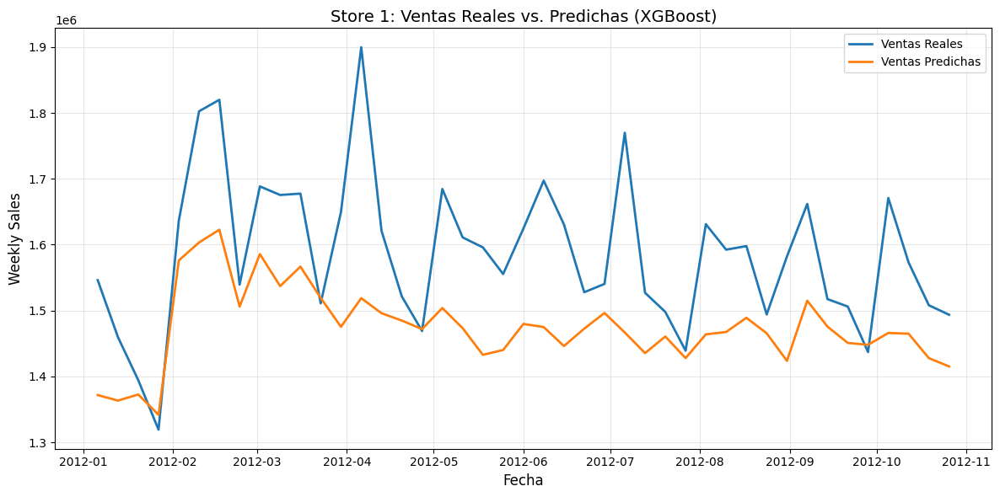

In [ ]:
# 1) Predecir sobre el conjunto de test de Store 1
y1_pred = best_xgb_store1.predict(X1_test)

# 2) Recuperar las fechas de cada muestra de test
dates_test = df1.loc[y1_test.index, 'Date']

# 3) Montar DataFrame con Date, Actual y Predicted
df_pred1 = pd.DataFrame({
    'Date':      dates_test,
    'Actual':    y1_test.values,
    'Predicted': y1_pred
})

# 4) Agregar por fecha si hay múltiples filas por fecha
df_pred1 = df_pred1.groupby('Date').sum().reset_index()

# 5) Calcular métricas de rendimiento
mae  = mean_absolute_error(df_pred1['Actual'], df_pred1['Predicted'])
rmse = np.sqrt(mean_squared_error(df_pred1['Actual'], df_pred1['Predicted']))
print(f"Store 1 – XGBoost  →  MAE: {mae:.2f},  RMSE: {rmse:.2f}, R²: {r2:.3f}")

# 6) Graficar ventas reales vs. predichas
plt.figure(figsize=(12,6))
plt.plot(df_pred1['Date'], df_pred1['Actual'],    label='Ventas Reales',    linewidth=2)
plt.plot(df_pred1['Date'], df_pred1['Predicted'], label='Ventas Predichas', linewidth=2)
plt.title('Store 1: Ventas Reales vs. Predichas (XGBoost)', fontsize=14)
plt.xlabel('Fecha', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Los resultados no nos dieron un mejor R2 para el modelo

4.2.2.3 Analisis de MAE y RMSE por cada tienda

    Store  MAE_ExtraTrees   MAE_XGBoost  RMSE_ExtraTrees  RMSE_XGBoost  \
0       1    13551.221495   7648.742823     22755.946806  11496.010654   
1       2    17281.966828   9905.806059     26119.491531  15620.346956   
2       3     4752.284935   3973.282159     11622.239621   9303.032542   
3       4    19539.245003  13389.869776     27193.598618  20422.194749   
4       5     3640.645958   2530.227212      7057.822672   4533.398260   
5       6    12141.230803   9234.880875     18167.040195  14803.669705   
6       7     6527.989970   4527.142742      8885.889449   7123.137032   
7       8    16888.737396  10822.376282     20359.372889  12788.936714   
8       9     5635.875790   5501.202795      9679.545215  10863.578344   
9      10    16503.964308  13587.374589     21600.720959  22531.567984   
10     11     9790.068343   8297.371888     14076.541886  13286.494112   
11     12     9976.656602   8186.519088     15315.949258  12452.071612   
12     13    16045.096510  11048.95535

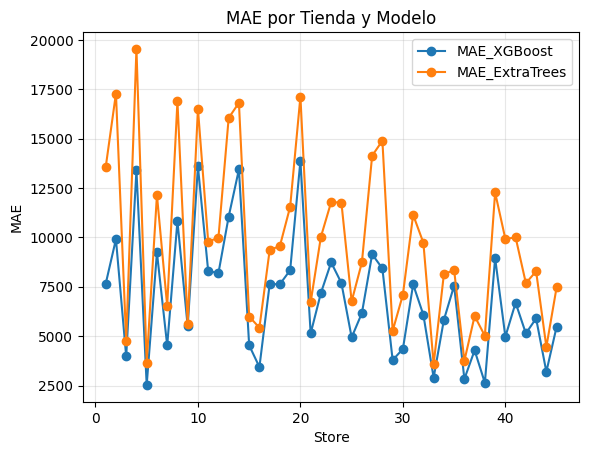

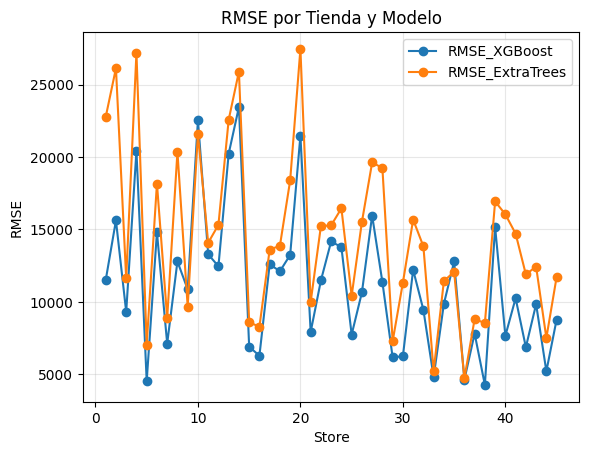

In [ ]:
# 1) Lista de features
features_2 = [
    'Size', 'CPI', 'Unemployment', 'Fuel_Price',
    'IsHoliday', 'HasPromotion', 'PromoStrength_log',
    'HolidaySeason', 'IsEndOfYear', 'week', 'month',
    'WeekSin', 'Trend'
]

# 2) Parámetros de los modelos globalmente afinados
xgb_params = best_xgb.get_params()
et_params  = best_et.get_params()

# 3) Iterar por cada tienda
results = []
stores = sorted(df_co['Store'].unique())

for store in stores:
    # Filtrar y ordenar
    df_s = df_co[df_co['Store'] == store].sort_values('Date')
    X = df_s[features_2 + ['Type']].copy()
    y = df_s['Weekly_Sales']
    
    # Codificar Type y booleanos
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    for col in X.select_dtypes(include='bool').columns:
        X[col] = X[col].astype(int)

    # Split temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )
    
    # Instanciar modelos con parámetros globales
    model_xgb = XGBRegressor(**xgb_params)
    model_et  = ExtraTreesRegressor(**et_params)
    
    # Ajustar y predecir XGBoost
    model_xgb.fit(X_train, y_train)
    y_pred_xgb = model_xgb.predict(X_test)
    results.append({
        'Store': store,
        'Model': 'XGBoost',
        'MAE':  mean_absolute_error(y_test, y_pred_xgb),
        'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_xgb)),
        'R2':   r2_score(y_test, y_pred_xgb)
    })
    
    # Ajustar y predecir Extra Trees
    model_et.fit(X_train, y_train)
    y_pred_et = model_et.predict(X_test)
    results.append({
        'Store': store,
        'Model': 'ExtraTrees',
        'MAE':  mean_absolute_error(y_test, y_pred_et),
        'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_et)),
        'R2':   r2_score(y_test, y_pred_et)
    })

# 4) Crear DataFrame de resultados
results_df = pd.DataFrame(results)

# 5) Pivot para visualización
pivot_df = results_df.pivot(index='Store', columns='Model', values=['MAE', 'RMSE', 'R2'])
pivot_df.columns = ['_'.join(col) for col in pivot_df.columns]
pivot_df.reset_index(inplace=True)

# 6) Mostrar resultados
import pprint
pprint.pprint(pivot_df)

# Visualizar en gráfico
pivot_df.plot(x='Store', y=['MAE_XGBoost', 'MAE_ExtraTrees'], marker='o', title='MAE por Tienda y Modelo')
plt.ylabel('MAE')
plt.grid(alpha=0.3)
plt.show()

pivot_df.plot(x='Store', y=['RMSE_XGBoost', 'RMSE_ExtraTrees'], marker='o', title='RMSE por Tienda y Modelo')
plt.ylabel('RMSE')
plt.grid(alpha=0.3)
plt.show()



Podemos ver que en ambos modelos el RMSE es parecido en muchos casos con algunos valores mas bajos por parte del modelo de XGBoost <br>
En cuanto al MAE el modelo de XGBoost tiene valores mas bajos en general. <br>
Haremos un analisis de 3 tiendas para visualizar que puede ser lo que haga la diferencia en los analisis

4.2.2.4 Evaluacion de 3 tiendas (Prediccion Buena - Mediana - Mala)

Tiendas seleccionadas (mejor, intermedia, peor): [38, 24, 35]


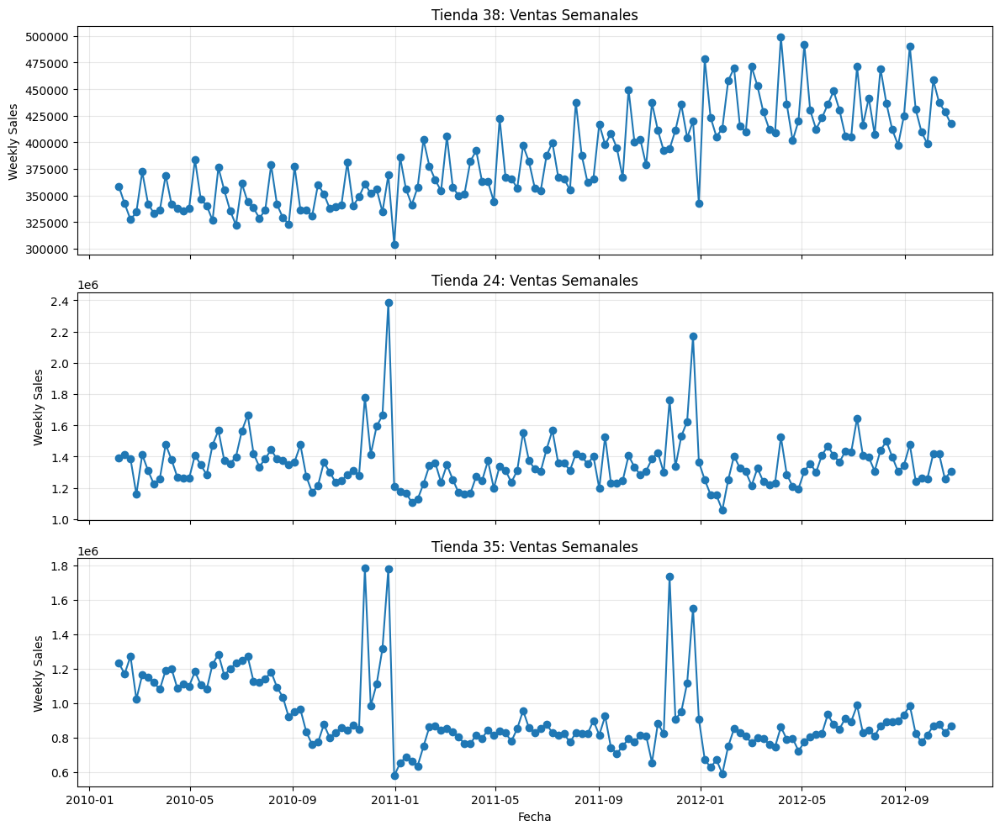

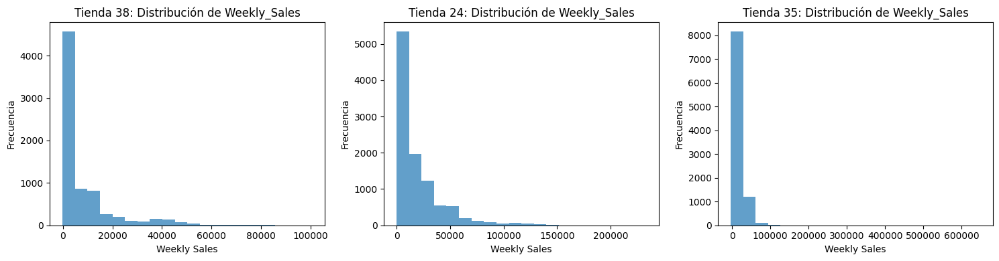

In [ ]:
# 1) Parte 1: identificar tiendas con mejor, peor e intermedia R²
stores_r2 = pivot_df[['Store','R2_XGBoost']]

best_store        = stores_r2.loc[stores_r2['R2_XGBoost'].idxmax(), 'Store']
worst_store       = stores_r2.loc[stores_r2['R2_XGBoost'].idxmin(), 'Store']
intermediate_store = stores_r2.sort_values('R2_XGBoost')['Store'].iloc[len(stores_r2)//2]

selected_stores = [best_store, intermediate_store, worst_store]
print("Tiendas seleccionadas (mejor, intermedia, peor):", selected_stores)

# 2) Filtrar df_co para estas tiendas
df_sel = df_co[df_co['Store'].isin(selected_stores)].copy()

# 3) Agregar ventas semanales por tienda
weekly = (
    df_sel
    .groupby(['Store','Date'])['Weekly_Sales']
    .sum()
    .reset_index()
)

# 4) Graficar serie de ventas semanales para cada tienda
fig, axes = plt.subplots(3, 1, figsize=(12, 10), sharex=True)
for ax, store in zip(axes, selected_stores):
    data = weekly[weekly['Store'] == store]
    ax.plot(data['Date'], data['Weekly_Sales'], marker='o', linestyle='-')
    ax.set_title(f"Tienda {store}: Ventas Semanales")
    ax.set_ylabel("Weekly Sales")
    ax.grid(alpha=0.3)

axes[-1].set_xlabel("Fecha")
plt.tight_layout()
plt.show()

# 5) Histograma de distribución de ventas para cada tienda
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, store in zip(axes, selected_stores):
    data = df_co[df_co['Store'] == store]['Weekly_Sales']
    ax.hist(data, bins=20, alpha=0.7)
    ax.set_title(f"Tienda {store}: Distribución de Weekly_Sales")
    ax.set_xlabel("Weekly Sales")
    ax.set_ylabel("Frecuencia")
plt.tight_layout()
plt.show()


El departamento con mejor desempeño mostró una tendencia estable y estacionalidad regular, sin picos atípicos, lo que facilito al modelo capturar la dinámica. Por el contrario, el departamento con peor desempeño presentó varios picos abruptos y comportamientos erráticos, esto pudiendose deber a eventos promocionales o alguna otra causa

La distribucion de las ventas reforzo el analisis donde podemos observar que las ventas con peores predicciones donde la mayor parte de las ventas semanales se concentraban en un valor bajo con solo algunos valores alejados, lo que genera una larga cola hacia la derecha.

Ahora analizaremos cada variable del modelo

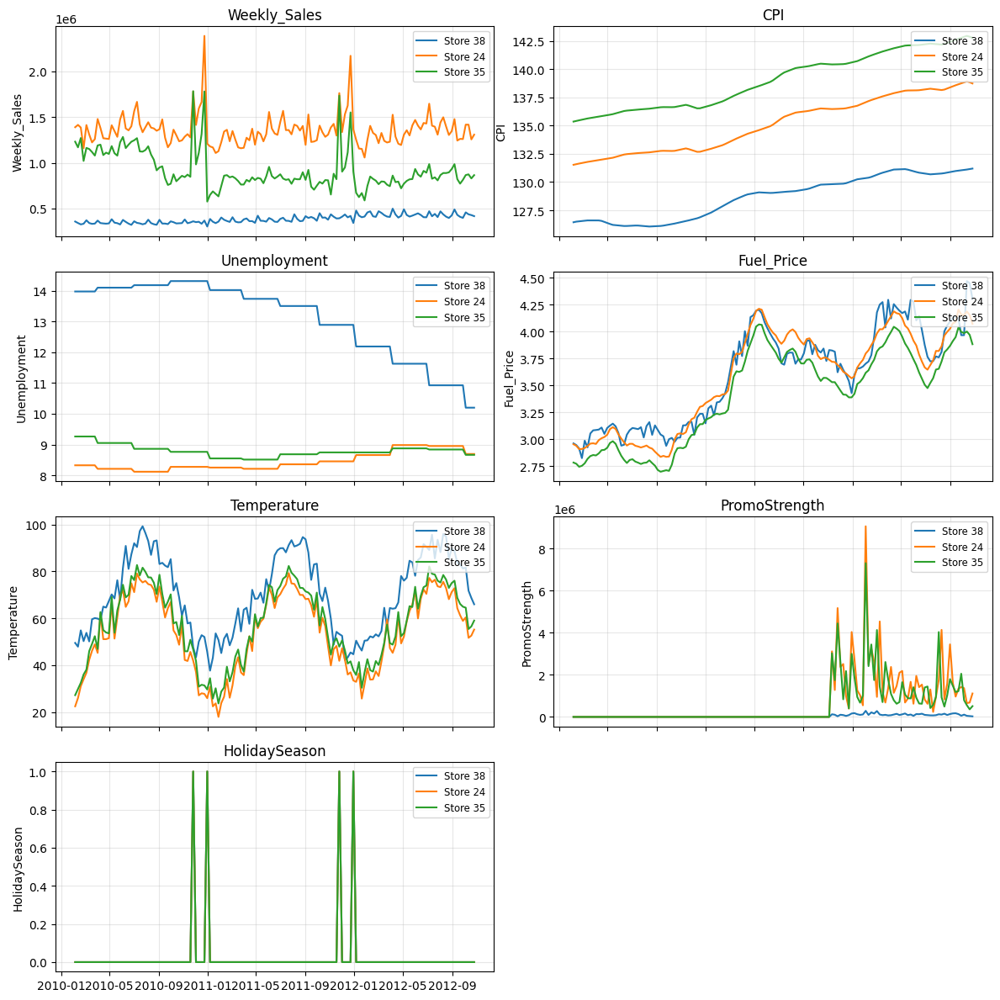

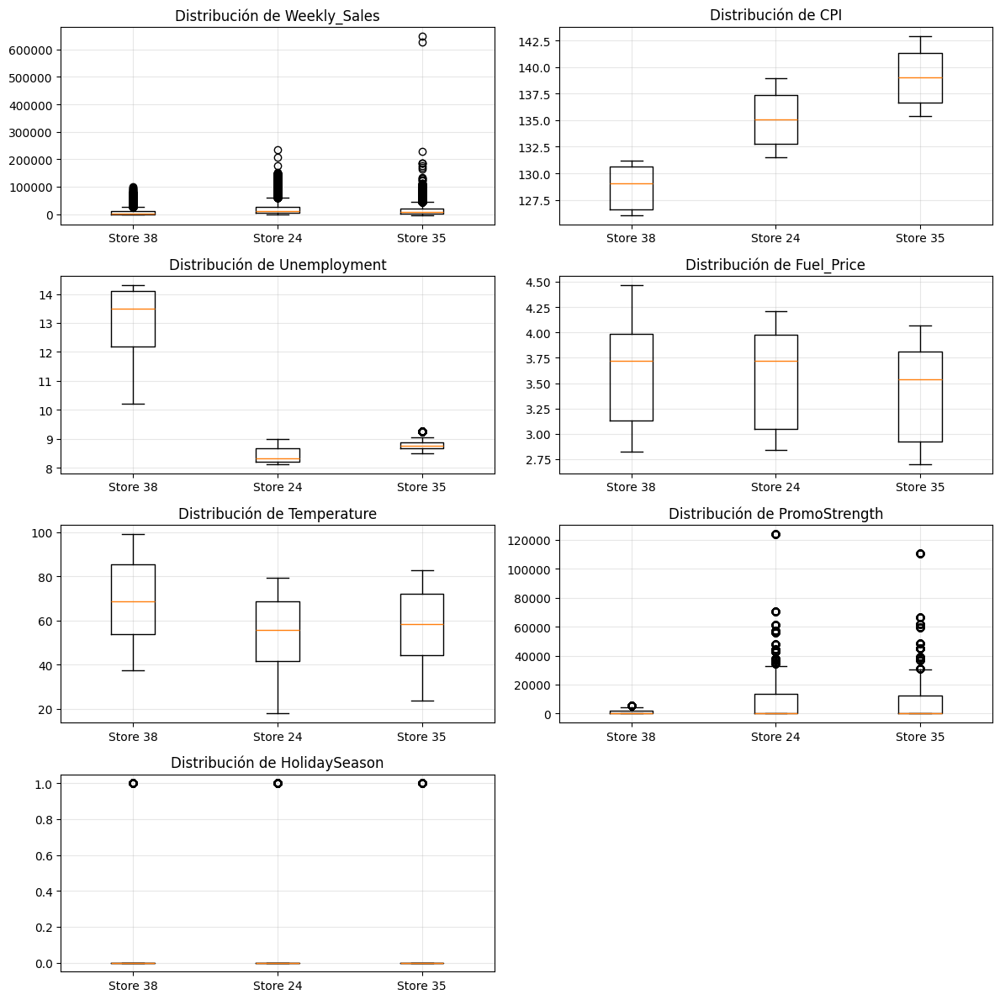

In [ ]:
# 1) Suponiendo que ya has obtenido estas tres tiendas:
selected_stores = [best_store, intermediate_store, worst_store]

# 2) Filtrar df_co para esas tiendas
df_sel = df_co[df_co['Store'].isin(selected_stores)].copy()

# 3) Variables a comparar
vars_to_compare = [
    'Weekly_Sales', 'CPI', 'Unemployment', 
    'Fuel_Price', 'Temperature', 'PromoStrength_log', 'HolidaySeason'
]

# 4) Agregar (sumar) o promediar por fecha y tienda
#    Weekly_Sales y PromoStrength se suman, el resto se promedian
agg_funcs = {
    'Weekly_Sales': 'sum',
    'PromoStrength_log': 'sum',
    'CPI': 'mean',
    'Unemployment': 'mean',
    'Fuel_Price': 'mean',
    'Temperature': 'mean',
    'HolidaySeason': 'mean'
}
df_weekly = (
    df_sel
    .groupby(['Store','Date'])
    .agg(agg_funcs)
    .reset_index()
)

# 5) Graficar cada variable como serie temporal con líneas por tienda
n_vars = len(vars_to_compare)
cols = 2
rows = (n_vars + 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, rows * 3), sharex=True)
axes = axes.flatten()

for ax, var in zip(axes, vars_to_compare):
    for store in selected_stores:
        d = df_weekly[df_weekly['Store']==store]
        ax.plot(d['Date'], d[var], label=f'Store {store}')
    ax.set_title(var)
    ax.grid(alpha=0.3)
    ax.legend(loc='upper right', fontsize='small')
    ax.set_ylabel(var)

# Quitar ejes sobrantes
for i in range(n_vars, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

# 6) Comparación de distribuciones (boxplots) para cada variable y tienda
fig, axes = plt.subplots(rows, cols, figsize=(12, rows * 3))
axes = axes.flatten()

for ax, var in zip(axes, vars_to_compare):
    data = [ df_sel[df_sel['Store']==s][var] for s in selected_stores ]
    ax.boxplot(data, labels=[f'Store {s}' for s in selected_stores])
    ax.set_title(f'Distribución de {var}')
    ax.grid(alpha=0.3)

# Quitar ejes sobrantes
for i in range(n_vars, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

Con los resultados podemos observar que las 3 tiendas se comportan diferentes en variables como "Weekly_Sales", "Unemployment", "PromoStrenght", "CPI", por lo que optaremos por trabajar con Clustering en las tiendas con el fin de crear distintos grupos y evaluar un modelo para cada uno.

4.2.2.5 Clustering

Comenzaremos por preprarar el dataframe y seleccionar las variables para el clustering. Eligiendo como primer modelo Kmeans

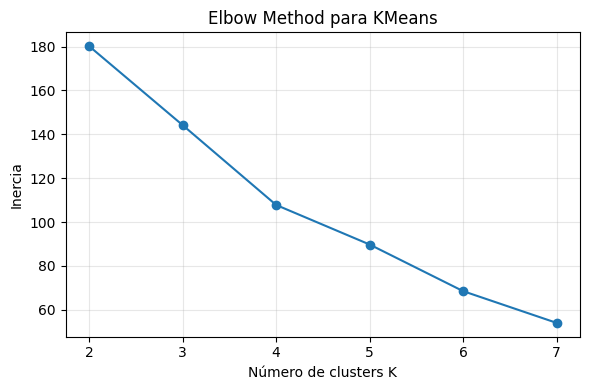

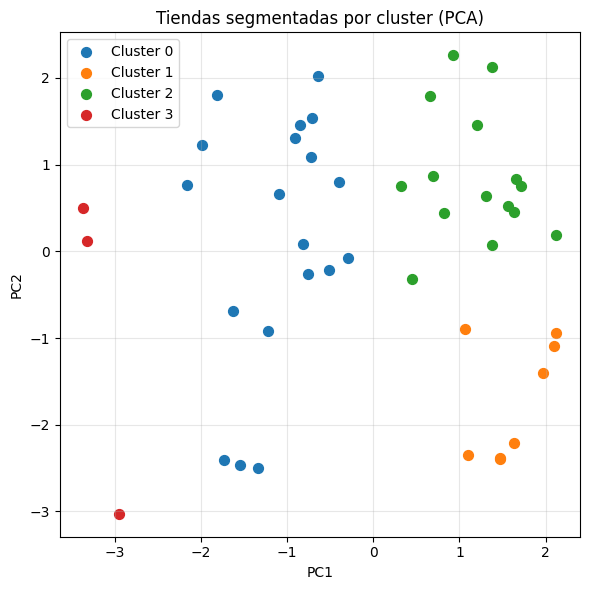

Resumen de features promedio por cluster:


,CPI_mean,CPI_std,Unemployment_mean,Unemployment_std,PromoStrength_mean,PromoStrength_std
Cluster,,,,,,
0,133.02,2.16,7.72,0.55,6585.50,12969.69
1,212.81,4.17,7.41,0.52,1903.33,3645.92
2,207.05,3.99,7.63,0.43,8286.40,15799.64
3,128.70,1.85,13.10,1.21,6438.36,11996.41


In [ ]:
# 1) Preparar DataFrame de características por tienda
agg_funcs = {
    'CPI':          ['mean', 'std'],
    'Unemployment': ['mean', 'std'],
    'PromoStrength':['mean', 'std']
}
store_feats = (
    df_co
    .groupby('Store')
    .agg(agg_funcs)
)
# Aplanar multiíndice de columnas
store_feats.columns = ['_'.join(col) for col in store_feats.columns]
store_feats.reset_index(inplace=True)

# 2) Seleccionar variables para clustering
features = [
    'CPI_mean', 'CPI_std',
    'Unemployment_mean', 'Unemployment_std',
    'PromoStrength_mean', 'PromoStrength_std'
]
X = store_feats[features].fillna(0)

# 3) Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4) Método del codo para decidir número de clusters
inertias = []
K_range = range(2, 8)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(X_scaled)
    inertias.append(km.inertia_)

plt.figure(figsize=(6,4))
plt.plot(K_range, inertias, marker='o')
plt.title('Elbow Method para KMeans')
plt.xlabel('Número de clusters K')
plt.ylabel('Inercia')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 5) Ajustar KMeans con K elegido (por ejemplo K=3)
k_opt = 4
kmeans = KMeans(n_clusters=k_opt, random_state=42)
store_feats['Cluster'] = kmeans.fit_predict(X_scaled)

# 6) Reducir a 2D con PCA para visualización
pca = PCA(n_components=2, random_state=42)
coords = pca.fit_transform(X_scaled)
store_feats['PC1'] = coords[:,0]
store_feats['PC2'] = coords[:,1]

plt.figure(figsize=(6,6))
for cluster in range(k_opt):
    subset = store_feats[store_feats['Cluster'] == cluster]
    plt.scatter(subset['PC1'], subset['PC2'], label=f'Cluster {cluster}', s=50)
plt.title('Tiendas segmentadas por cluster (PCA)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 7) Mostrar características por cluster
cluster_summary = store_feats.groupby('Cluster')[features].mean().round(2)
print("Resumen de features promedio por cluster:")
display(cluster_summary)

# 8) Asignar cluster de vuelta a df_co
df_co = df_co.merge(
    store_feats[['Store','Cluster']],
    on='Store',
    how='left'
)



Analisis descriptivo por cluster

Resumen estadístico por cluster:


,Weekly_Sales_count,Weekly_Sales_mean,Weekly_Sales_std,Weekly_Sales_min,Weekly_Sales_max,PromoStrength_mean,PromoStrength_std,CPI_mean,CPI_std,Unemployment_mean,Unemployment_std
Cluster,,,,,,,,,,,
0,180711,16702.141817,23089.909120,-3924.00,693099.36,6922.981136,15225.572725,133.193653,4.467821,7.705023,1.554245
1,63680,8417.106535,14030.641923,-1699.00,155897.94,2073.260746,4877.672058,212.618071,9.517494,7.282194,1.236056
2,149999,18628.433229,24998.748675,-1750.00,474330.10,8303.323706,16362.517333,207.111587,12.693145,7.623283,0.865949
3,27180,14301.344266,19142.676763,-4988.94,360140.66,6961.626444,15349.622957,128.697457,1.850627,13.106014,1.206303


<Figure size 800x400 with 0 Axes>

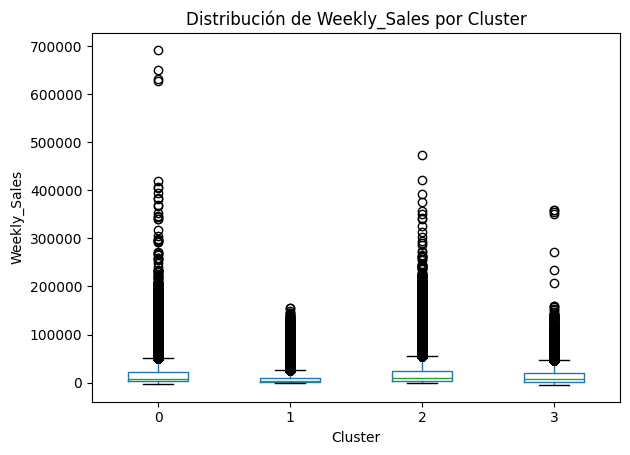

<Figure size 800x400 with 0 Axes>

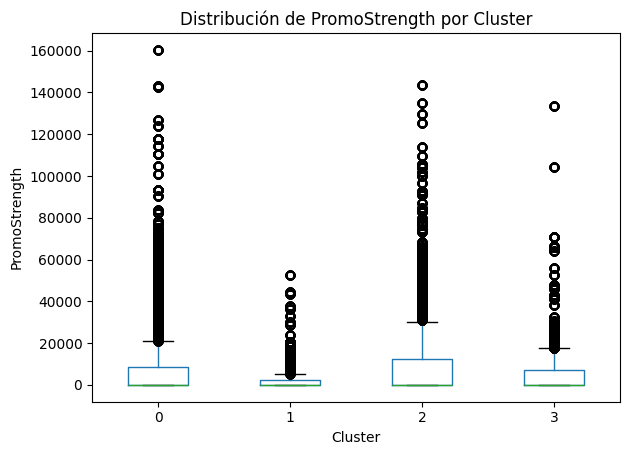

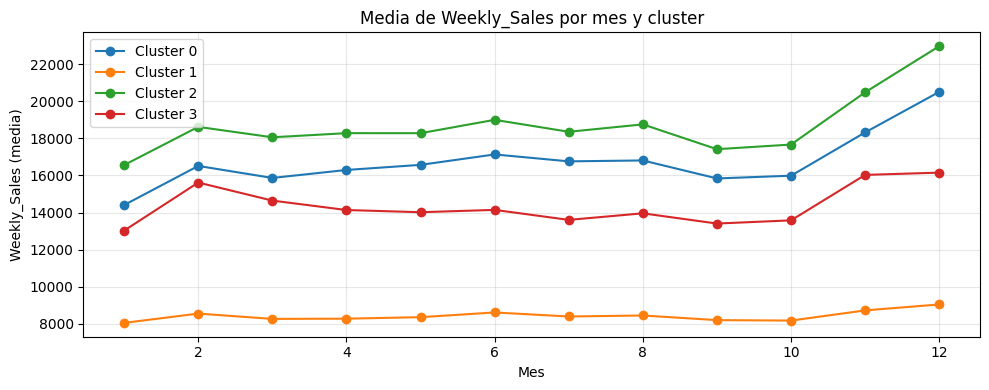

In [ ]:
# 1) Resumen estadístico por cluster
cluster_stats = (
    df_co
    .groupby('Cluster')
    .agg({
        'Weekly_Sales':   ['count', 'mean', 'std', 'min', 'max'],
        'PromoStrength':  ['mean', 'std'],
        'CPI':            ['mean', 'std'],
        'Unemployment':   ['mean', 'std']
    })
)
# Aplanar índices de columna
cluster_stats.columns = ['_'.join(col) for col in cluster_stats.columns]
print("Resumen estadístico por cluster:")
display(cluster_stats)

# 2) Boxplot de Weekly_Sales por cluster
plt.figure(figsize=(8,4))
df_co.boxplot(column='Weekly_Sales', by='Cluster', grid=False)
plt.title('Distribución de Weekly_Sales por Cluster')
plt.suptitle('')
plt.xlabel('Cluster')
plt.ylabel('Weekly_Sales')
plt.tight_layout()
plt.show()

# 3) Boxplot de PromoStrength por cluster
plt.figure(figsize=(8,4))
df_co.boxplot(column='PromoStrength', by='Cluster', grid=False)
plt.title('Distribución de PromoStrength por Cluster')
plt.suptitle('')
plt.xlabel('Cluster')
plt.ylabel('PromoStrength')
plt.tight_layout()
plt.show()

# 4) Estacionalidad: media de ventas mensuales por cluster
df_co['month'] = df_co['Date'].dt.month
monthly_sales = (
    df_co
    .groupby(['Cluster','month'])['Weekly_Sales']
    .mean()
    .unstack(level=0)
)

plt.figure(figsize=(10,4))
for cluster in monthly_sales.columns:
    plt.plot(monthly_sales.index, monthly_sales[cluster], marker='o', label=f'Cluster {cluster}')
plt.title('Media de Weekly_Sales por mes y cluster')
plt.xlabel('Mes')
plt.ylabel('Weekly_Sales (media)')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


DBSCAN

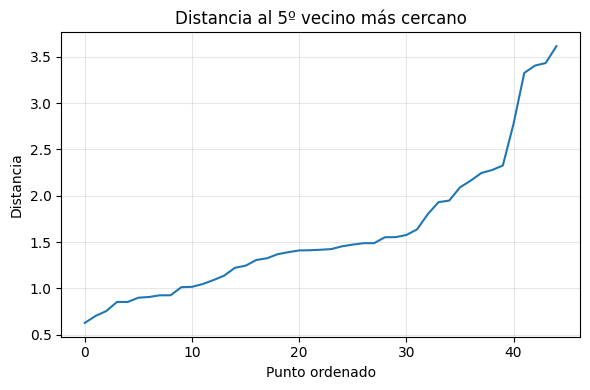

Tiendas por cluster DBSCAN:
DB_Cluster
-1    17
 0    13
 2    10
 1     5
Name: count, dtype: int64


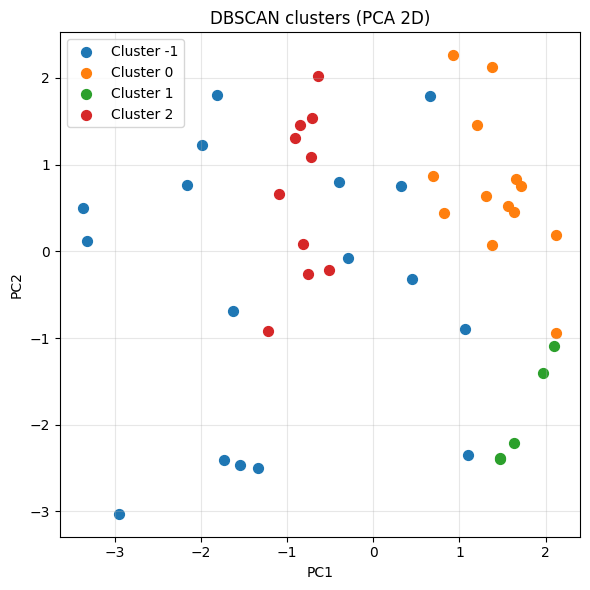

Resumen de features promedio por DBSCAN cluster:


,CPI_mean,CPI_std,Unemployment_mean,Unemployment_std,PromoStrength_mean,PromoStrength_std
DB_Cluster,,,,,,
-1,148.96,2.38,8.59,0.76,5699.62,11188.25
0,211.68,4.18,7.28,0.45,8043.51,15157.58
1,216.26,4.33,7.36,0.57,1525.95,2928.20
2,135.63,2.34,8.24,0.31,7487.33,14668.56


In [ ]:
# Si ya existe una columna DB_Cluster, la eliminamos para recalcularla
if 'DB_Cluster' in df_co.columns:
    df_co.drop('DB_Cluster', axis=1, inplace=True)

# 1) Reusar la tabla de features por tienda
agg_funcs = {
    'CPI':          ['mean', 'std'],
    'Unemployment': ['mean', 'std'],
    'PromoStrength':['mean', 'std']
}
store_feats = (
    df_co
    .groupby('Store')
    .agg(agg_funcs)
)
store_feats.columns = ['_'.join(c) for c in store_feats.columns]
store_feats.reset_index(inplace=True)

# 2) Preparar matriz de clustering
features = [
    'CPI_mean', 'CPI_std',
    'Unemployment_mean', 'Unemployment_std',
    'PromoStrength_mean', 'PromoStrength_std'
]
X = store_feats[features].fillna(0)

# 3) Escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4) Gráfico k‑distances para elegir eps
nbrs = NearestNeighbors(n_neighbors=5).fit(X_scaled)
distances, _ = nbrs.kneighbors(X_scaled)
distances = np.sort(distances[:,4])
plt.figure(figsize=(6,4))
plt.plot(distances)
plt.title('Distancia al 5º vecino más cercano')
plt.xlabel('Punto ordenado')
plt.ylabel('Distancia')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 5) Ajustar DBSCAN con el eps óptimo identificado (p.ej. eps=1.3)
db = DBSCAN(eps=1.3, min_samples=5)
store_feats['DB_Cluster'] = db.fit_predict(X_scaled)

# 6) Ver conteo por cluster
print("Tiendas por cluster DBSCAN:")
print(store_feats['DB_Cluster'].value_counts())

# 7) PCA 2D para visualizar resultados
pca = PCA(n_components=2, random_state=42)
coords = pca.fit_transform(X_scaled)
store_feats['PC1'] = coords[:,0]
store_feats['PC2'] = coords[:,1]

plt.figure(figsize=(6,6))
for lbl in sorted(store_feats['DB_Cluster'].unique()):
    subset = store_feats[store_feats['DB_Cluster']==lbl]
    plt.scatter(subset['PC1'], subset['PC2'],
                label=f'Cluster {lbl}', s=50)
plt.title('DBSCAN clusters (PCA 2D)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 8) Resumen estadístico por cluster
db_summary = (
    store_feats
    .groupby('DB_Cluster')[features]
    .mean()
    .round(2)
)
print("Resumen de features promedio por DBSCAN cluster:")
display(db_summary)

# 9) Añadir (de nuevo) la columna DB_Cluster a df_co
df_co = df_co.merge(
    store_feats[['Store','DB_Cluster']],
    on='Store', how='left'
)



In [ ]:
# 1) Etiquetas de cada clustering
labels_km = kmeans.labels_
labels_db = db.labels_

# 2) Silhouette para KMeans
#    Requiere al menos 2 clusters
if len(np.unique(labels_km)) > 1:
    sil_km = silhouette_score(X_scaled, labels_km)
    print(f"Silhouette Score KMeans (k={kmeans.n_clusters}): {sil_km:.3f}")
else:
    print("KMeans tiene <2 clusters, no se puede calcular silhouette.")

# 3) Silhouette para DBSCAN (se omite ruido, etiqueta -1)
mask = labels_db != -1
unique_db = np.unique(labels_db[mask])
if len(unique_db) > 1:
    sil_db = silhouette_score(X_scaled[mask], labels_db[mask])
    print(f"Silhouette Score DBSCAN (eps={db.eps}): {sil_db:.3f}")
else:
    print("DBSCAN tiene <2 clusters útiles (excluyendo ruido), no se puede calcular silhouette.")


Silhouette Score KMeans (k=4): 0.346
Silhouette Score DBSCAN (eps=1.3): 0.466


Basandonos en el Silhoutte Score elegiremos DBSCAN

In [ ]:
# 1) Definir features
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price',
    'IsHoliday','HasPromotion','PromoStrength_log',
    'HolidaySeason','IsEndOfYear','week','month',
    'WeekSin','Trend'
]

# 2) Listar clusters únicos de DBSCAN 
clusters = sorted(df_co['DB_Cluster'].unique())

results = []

for cluster in clusters:
    # a) Filtrar datos por cluster
    df_cl = df_co[df_co['DB_Cluster'] == cluster].sort_values('Date')
    if df_cl.shape[0] < 20:  # Saltar clusters muy pequeños
        continue

    # b) Preparar X, y
    X = df_cl[features_2 + ['Type']].copy()
    y = df_cl['Weekly_Sales']

    # c) Codificar Type y booleanos
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    bool_cols = X.select_dtypes(include='bool').columns
    X[bool_cols] = X[bool_cols].astype(int)

    # d) Split train/test (70/30), temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # e) Modelos con hiperparametrización por default (sin usar los globales)
    models = {
        'XGBoost': XGBRegressor(objective='reg:squarederror', random_state=42),
        'ExtraTrees': ExtraTreesRegressor(random_state=42)
    }

    # f) Entrenar, predecir y medir
    for name, model in models.items():
        model.fit(X_train, y_train)
        pred = model.predict(X_test)
        mae  = mean_absolute_error(y_test, pred)
        rmse = np.sqrt(mean_squared_error(y_test, pred))
        r2   = r2_score(y_test, pred)

        results.append({
            'Cluster': cluster,
            'Model': name,
            'N_obs': df_cl.shape[0],
            'MAE': mae,
            'RMSE': rmse,
            'R2': r2
        })

# 3) Crear DataFrame de resultados
results_df = pd.DataFrame(results)

# 4) Mostrar resultados ordenados
results_df = results_df.sort_values(['Cluster','Model'])
print("Resultados por cluster y modelo (default hyperparams):")
display(results_df)



Resultados por cluster y modelo (default hyperparams):


,Cluster,Model,N_obs,MAE,RMSE,R2
1,-1,ExtraTrees,155339,6078.257378,10675.387425,0.791617
0,-1,XGBoost,155339,10864.176537,17146.709332,0.462403
3,0,ExtraTrees,128862,8153.492169,13706.278316,0.675363
2,0,XGBoost,128862,10829.264952,16428.841076,0.533585
5,1,ExtraTrees,38619,2513.357071,4849.626455,0.851590
4,1,XGBoost,38619,2591.887638,5067.981343,0.837925
7,2,ExtraTrees,98750,6032.762335,9892.676947,0.738619
6,2,XGBoost,98750,9545.875937,14017.757664,0.475189


In [ ]:
df_co['DB_Cluster'].value_counts()

DB_Cluster
-1    155339
 0    128862
 2     98750
 1     38619
Name: count, dtype: int64

In [ ]:
# 1) Definir las features que usaremos
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price',
    'IsHoliday','HasPromotion','PromoStrength_log',
    'HolidaySeason','IsEndOfYear','week','month',
    'WeekSin','Trend'
]

# 2) Espacio de búsqueda de hiperparámetros para ExtraTrees
et_param_dist = {
    'n_estimators':      [100, 300, 500, 800],
    'max_depth':         [None, 10, 20, 30, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf':  [1, 2, 4],
    'max_features':      ['sqrt', 'log2', 0.5, 0.8]
}

# 3) Configurar CV temporal
tscv = TimeSeriesSplit(n_splits=5)

# 4) Función para tunear ExtraTrees en un cluster dado
def tune_cluster_extratrees(cluster_label, n_iter=30):
    # Filtrar datos por cluster
    df_cl = df_co[df_co['DB_Cluster'] == cluster_label].sort_values('Date')
    if df_cl.shape[0] < 20:
        print(f"Cluster {cluster_label} muy pequeño ({df_cl.shape[0]} obs), omitiendo.")
        return None
    
    # Preparar X, y
    X = df_cl[features_2 + ['Type']].copy()
    y = df_cl['Weekly_Sales']
    
    # One-hot encoding de Type + convertir bools a int
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    for c in X.select_dtypes(include='bool').columns:
        X[c] = X[c].astype(int)
    
    # Split 70/30 (sin shuffle) para tener test final
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )
    
    # Configurar RandomizedSearchCV
    et = ExtraTreesRegressor(random_state=42)
    search = RandomizedSearchCV(
        estimator=et,
        param_distributions=et_param_dist,
        n_iter=n_iter,
        scoring='neg_root_mean_squared_error',
        cv=tscv,
        random_state=42,
        n_jobs=-1,
        verbose=0
    )
    print(f"\nAfinando ExtraTrees para Cluster {cluster_label} (n_train={len(X_train)}) …")
    search.fit(X_train, y_train)
    
    # Métricas de CV
    cv_rmse = -search.best_score_
    best_params = search.best_params_
    
    # Evaluación en test
    best_model = search.best_estimator_
    y_pred = best_model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    test_mae  = mean_absolute_error(y_test, y_pred)
    
    return {
        'Cluster':    cluster_label,
        'N_obs':      df_cl.shape[0],
        'CV_RMSE':    cv_rmse,
        'Test_RMSE':  test_rmse,
        'Test_MAE':   test_mae,
        'BestParams': best_params
    }

# 5) Ejecutar tuning para cada cluster
results = []
for cl in sorted(df_co['DB_Cluster'].unique()):
    res = tune_cluster_extratrees(cl, n_iter=30)
    if res is not None:
        results.append(res)

# 6) Consolidar resultados
tuning_df = pd.DataFrame(results).set_index('Cluster')
print("\nResumen de hiperparámetros y métricas por cluster:")
display(tuning_df)




Afinando ExtraTrees para Cluster -1 (n_train=108737) …

Afinando ExtraTrees para Cluster 0 (n_train=90203) …

Afinando ExtraTrees para Cluster 1 (n_train=27033) …

Afinando ExtraTrees para Cluster 2 (n_train=69125) …

Resumen de hiperparámetros y métricas por cluster:


,N_obs,CV_RMSE,Test_RMSE,Test_MAE,BestParams
Cluster,,,,,
-1,155339,10503.312311,11232.743785,6473.514882,"{'n_estimators': 500, 'min_samples_split': 2, ..."
0,128862,10869.977042,14623.183540,8567.227306,"{'n_estimators': 500, 'min_samples_split': 2, ..."
1,38619,4688.788570,5314.452283,2940.991378,"{'n_estimators': 500, 'min_samples_split': 2, ..."
2,98750,10413.799199,9992.683692,6162.046630,"{'n_estimators': 500, 'min_samples_split': 2, ..."


In [ ]:
# 1) Recuperar los mejores hiperparámetros por cluster
best_params_by_cluster = tuning_df['BestParams'].to_dict()

# 2) Definir features
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price',
    'IsHoliday','HasPromotion','PromoStrength_log',
    'HolidaySeason','IsEndOfYear','week','month',
    'WeekSin','Trend'
]

# 3) Container para los resultados finales
pred_results = []

# 4) Recorremos cada cluster y hacemos la predicción con su modelo afinado
for cluster, params in best_params_by_cluster.items():
    # a) Filtrar y ordenar
    df_cl = df_co[df_co['DB_Cluster']==cluster].sort_values('Date')
    
    # b) Preparar X, y
    X = df_cl[features_2 + ['Type']].copy()
    y = df_cl['Weekly_Sales']
    
    # c) Codificar Type y bools
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    for c in X.select_dtypes(include='bool').columns:
        X[c] = X[c].astype(int)
    
    # d) Train/test split 70/30 sin shuffle
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )
    
    # e) Instanciar con los parámetros óptimos
    model = ExtraTreesRegressor(random_state=42, **params)
    
    # f) Entrenar y predecir
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # g) Calcular métricas
    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)
    
    # h) Guardar resultados
    pred_results.append({
        'Cluster':   cluster,
        'N_obs':     len(df_cl),
        'MAE':       mae,
        'RMSE':      rmse,
        'R2':        r2
    })

# 5) Consolidar en DataFrame
pred_df = pd.DataFrame(pred_results).set_index('Cluster').sort_index()
print("Desempeño de ExtraTrees por cluster (con sus hiperparámetros afinados):")
display(pred_df)


Desempeño de ExtraTrees por cluster (con sus hiperparámetros afinados):


,N_obs,MAE,RMSE,R2
Cluster,,,,
-1,155339,6473.514882,11232.743785,0.769290
0,128862,8567.227306,14623.183540,0.630476
1,38619,2940.991378,5314.452283,0.821777
2,98750,6162.046630,9992.683692,0.733308


Podemos observar que los modelos por cluster fueron buenos

In [ ]:
# Obtener la lista de tiendas asociadas a cada cluster DBSCAN
cluster_groups = (
    df_co[['Store','DB_Cluster']]
    .drop_duplicates()
    .groupby('DB_Cluster')['Store']
    .apply(list)
    .sort_index()
)

print("Tiendas por cluster DBSCAN:")
for cluster, stores in cluster_groups.items():
    print(f"Cluster {cluster}: {stores}")


Tiendas por cluster DBSCAN:
Cluster -1: [4, 7, 10, 12, 13, 14, 16, 23, 28, 32, 33, 34, 38, 40, 42, 43, 44]
Cluster 0: [1, 2, 6, 8, 9, 11, 20, 21, 25, 31, 39, 41, 45]
Cluster 1: [3, 5, 30, 36, 37]
Cluster 2: [15, 17, 18, 19, 22, 24, 26, 27, 29, 35]


2025-04-24 14:37:44,388 - INFO     - Executing shutdown due to inactivity...
2025-04-24 14:37:44,572 - INFO     - Executing shutdown...
2025-04-24 14:37:44,572 - INFO     - Not running with the Werkzeug Server, exiting by searching gc for BaseWSGIServer


Métricas por tienda usando el modelo de su cluster:


,Cluster,MAE,RMSE,R2
Store,,,,
1,0,7020.686190,11202.615224,0.846620
2,0,9176.547311,13879.632825,0.821626
3,1,3572.282778,8118.783963,0.566121
4,-1,11822.999684,17984.205096,0.740363
5,1,2398.500754,4603.282253,0.709742
6,0,6913.104523,10765.924550,0.781002
7,-1,3605.589508,5964.005837,0.678519
8,0,15696.945309,19319.006358,-0.606611
9,0,3747.416432,6495.609337,0.724579


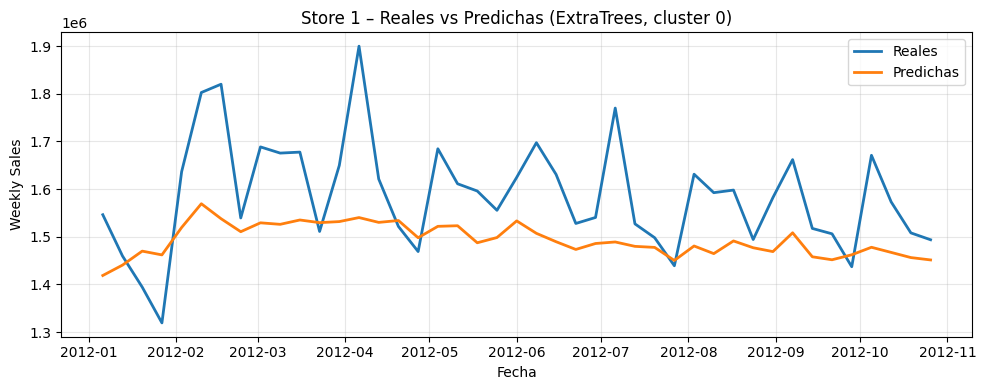

In [ ]:
# 1) Recuperar los mejores hiperparámetros por cluster
best_params_by_cluster = tuning_df['BestParams'].to_dict()

# 2) Definir las mismas features usadas
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price',
    'IsHoliday','HasPromotion','PromoStrength_log',
    'HolidaySeason','IsEndOfYear','week','month',
    'WeekSin','Trend'
]

# 3) Obtener el mapping tienda → cluster
store2cluster = (
    df_co[['Store','DB_Cluster']]
    .drop_duplicates()
    .set_index('Store')['DB_Cluster']
    .to_dict()
)

# 4) Contenedores para resultados y para guardar DataFrames de predicción
metrics_per_store = []
predictions_per_store = {}

# 5) Loop sobre cada tienda
for store in sorted(df_co['Store'].unique()):
    cluster = store2cluster[store]
    params  = best_params_by_cluster.get(cluster)
    if params is None:
        print(f"Store {store}: cluster {cluster} no afinado, salto.")
        continue
    
    # a) Filtrar datos de la tienda
    df_s = df_co[df_co['Store']==store].sort_values('Date')
    X = df_s[features_2 + ['Type']].copy()
    y = df_s['Weekly_Sales']
    
    # b) One‑Hot Encoding de Type y bool a int
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    bool_cols = X.select_dtypes(include='bool').columns
    X[bool_cols] = X[bool_cols].astype(int)
    
    # c) Train/test split 70/30 sin shuffle
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )
    
    # d) Instanciar modelo con los hiperparámetros del cluster
    model = ExtraTreesRegressor(random_state=42, **params)
    
    # e) Ajustar y predecir
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # f) Métricas
    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)
    
    metrics_per_store.append({
        'Store': store,
        'Cluster': cluster,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2
    })
    
    # g) Guardar DataFrame de predicción para esta tienda
    df_pred = pd.DataFrame({
        'Date':      df_s.loc[y_test.index, 'Date'],
        'Actual':    y_test.values,
        'Predicted': y_pred
    }).groupby('Date').sum().reset_index()
    predictions_per_store[store] = df_pred

# 6) DataFrame resumen de métricas
metrics_df_dbscan = pd.DataFrame(metrics_per_store).set_index('Store')
print("Métricas por tienda usando el modelo de su cluster:")
display(metrics_df_dbscan)

# 7) Ejemplo de plot para tienda 1
store_to_plot = 1
df_plot = predictions_per_store[store_to_plot]
plt.figure(figsize=(10,4))
plt.plot(df_plot['Date'], df_plot['Actual'],    label='Reales',    linewidth=2)
plt.plot(df_plot['Date'], df_plot['Predicted'], label='Predichas', linewidth=2)
plt.title(f"Store {store_to_plot} – Reales vs Predichas (ExtraTrees, cluster {store2cluster[store_to_plot]})")
plt.xlabel('Fecha'); plt.ylabel('Weekly Sales')
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout()
plt.show()


joblib por tienda

In [ ]:
# 1) Carpetas de salida
os.makedirs("models", exist_ok=True)

# 2) Dicts base: mejores hiperparámetros por cluster y asignación tienda→cluster
best_params_by_cluster = tuning_df['BestParams'].to_dict()
store2cluster = (
    df_co[['Store','DB_Cluster']]
    .drop_duplicates()
    .set_index('Store')['DB_Cluster']
    .to_dict()
)

# 3) Inicializar contenedores
models_by_store = {}
predictions_by_store = {}

# 4) Features que usamos para cada tienda
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price',
    'IsHoliday','HasPromotion','PromoStrength_log',
    'HolidaySeason','IsEndOfYear','week','month',
    'WeekSin','Trend'
]

# 5) Bucle de entrenamiento
for store in sorted(df_co['Store'].unique()):
    cluster = store2cluster.get(store)
    params  = best_params_by_cluster.get(cluster)
    if params is None:
        print(f"▶ Store {store}: cluster {cluster} sin parámetros, salto.")
        continue

    # a) Preparamos X e y
    df_s = df_co[df_co['Store']==store].sort_values('Date')
    X    = df_s[features_2 + ['Type']].copy()
    y    = df_s['Weekly_Sales']

    # b) Codificación y limpieza
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    bools = X.select_dtypes(include='bool').columns
    X[bools] = X[bools].astype(int)

    # c) Train/Test split (70/30)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # d) Instanciar y entrenar ExtraTrees con sus params
    model = ExtraTreesRegressor(random_state=42, **params)
    model.fit(X_train, y_train)

    # e) Métricas
    y_pred = model.predict(X_test)
    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)
    print(f"✔ Store {store}  →  MAE={mae:.0f}, RMSE={rmse:.0f}, R²={r2:.3f}")

    # f) Guardar modelo + R² en el dict
    models_by_store[store] = {"model": model, "R2": r2}

    # g) DataFrame de predicción y añadir a dict
    df_pred = pd.DataFrame({
        'Date':      df_s.loc[y_test.index, 'Date'],
        'Actual':    y_test.values,
        'Predicted': y_pred
    }).groupby('Date').sum().reset_index()
    predictions_by_store[store] = df_pred

reliability_by_store = { store: info["R2"]
                         for store, info in models_by_store.items() }
joblib.dump(reliability_by_store, "models/reliability_by_store.pkl")

# 6) Serializar ambos dicts
joblib.dump(predictions_by_store,  "models/predictions_by_store.pkl")

print("✅ Guardados:")
print("   • models/models_by_store.pkl")
print("   • models/predictions_by_store.pkl")

✔ Store 1  →  MAE=7021, RMSE=11203, R²=0.847
✔ Store 2  →  MAE=9177, RMSE=13880, R²=0.822
✔ Store 3  →  MAE=3572, RMSE=8119, R²=0.566
✔ Store 4  →  MAE=11823, RMSE=17984, R²=0.740
✔ Store 5  →  MAE=2399, RMSE=4603, R²=0.710
✔ Store 6  →  MAE=6913, RMSE=10766, R²=0.781
✔ Store 7  →  MAE=3606, RMSE=5964, R²=0.679
✔ Store 8  →  MAE=15697, RMSE=19319, R²=-0.607
✔ Store 9  →  MAE=3747, RMSE=6496, R²=0.725
✔ Store 10  →  MAE=9280, RMSE=14060, R²=0.757
✔ Store 11  →  MAE=6504, RMSE=9571, R²=0.768
✔ Store 12  →  MAE=6627, RMSE=10511, R²=0.629
✔ Store 13  →  MAE=8130, RMSE=12937, R²=0.860
✔ Store 14  →  MAE=9388, RMSE=15061, R²=0.785
✔ Store 15  →  MAE=4035, RMSE=6218, R²=0.587
✔ Store 16  →  MAE=3103, RMSE=5348, R²=0.717
✔ Store 17  →  MAE=5930, RMSE=9257, R²=0.715
✔ Store 18  →  MAE=5627, RMSE=8892, R²=0.719
✔ Store 19  →  MAE=7566, RMSE=12358, R²=0.707
✔ Store 20  →  MAE=10513, RMSE=17360, R²=0.762
✔ Store 21  →  MAE=4465, RMSE=7122, R²=0.615
✔ Store 22  →  MAE=6661, RMSE=10738, R²=0.613
✔ S

Probaremos con Kmeans

In [ ]:
# 1) Definir features
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price',
    'IsHoliday','HasPromotion','PromoStrength_log',
    'HolidaySeason','IsEndOfYear','week','month',
    'WeekSin','Trend'
]

# 2) Listar clusters únicos de KMeans
clusters = sorted(df_co['Cluster'].unique())

results = []

for cluster in clusters:
    # a) Filtrar datos por cluster KMeans
    df_cl = df_co[df_co['Cluster'] == cluster].sort_values('Date')
    if df_cl.shape[0] < 20:  # saltar clusters muy pequeños
        continue

    # b) Preparar X, y
    X = df_cl[features_2 + ['Type']].copy()
    y = df_cl['Weekly_Sales']

    # c) Codificar Type y booleanos
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    bool_cols = X.select_dtypes(include='bool').columns
    X[bool_cols] = X[bool_cols].astype(int)

    # d) Split train/test (70/30), temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # e) Modelos con hiperparámetros por defecto
    models = {
        'XGBoost':    XGBRegressor(objective='reg:squarederror', random_state=42),
        'ExtraTrees': ExtraTreesRegressor(random_state=42)
    }

    # f) Entrenar, predecir y medir
    for name, model in models.items():
        model.fit(X_train, y_train)
        pred = model.predict(X_test)
        mae  = mean_absolute_error(y_test, pred)
        rmse = np.sqrt(mean_squared_error(y_test, pred))
        r2   = r2_score(y_test, pred)

        results.append({
            'Cluster': cluster,
            'Model':   name,
            'N_obs':   df_cl.shape[0],
            'MAE':     mae,
            'RMSE':    rmse,
            'R2':      r2
        })

# 3) Consolidar resultados en DataFrame
results_df = pd.DataFrame(results)

# 4) Mostrar resultados ordenados
results_df = results_df.sort_values(['Cluster','Model']).reset_index(drop=True)
print("Resultados por cluster (KMeans) y modelo con hyperparams por defecto:")
display(results_df)


Resultados por cluster (KMeans) y modelo con hyperparams por defecto:


,Cluster,Model,N_obs,MAE,RMSE,R2
0,0,ExtraTrees,180711,6316.056073,10610.705430,0.774538
1,0,XGBoost,180711,11310.976610,16881.824843,0.429280
2,1,ExtraTrees,63680,3190.493561,5913.223856,0.806246
3,1,XGBoost,63680,4423.928661,7696.571724,0.671756
4,2,ExtraTrees,149999,8555.193286,13340.975019,0.703562
5,2,XGBoost,149999,11666.832904,17988.733716,0.461035
6,3,ExtraTrees,27180,4905.439838,8237.040950,0.809816
7,3,XGBoost,27180,4070.038297,7334.936145,0.849192


In [ ]:
df_co['Cluster'].value_counts()

Cluster
0    180711
2    149999
1     63680
3     27180
Name: count, dtype: int64

In [ ]:
# 1) Definir features
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price',
    'IsHoliday','HasPromotion','PromoStrength_log',
    'HolidaySeason','IsEndOfYear','week','month',
    'WeekSin','Trend'
]

# 2) Espacios de búsqueda
et_param_dist = {
    'n_estimators':      [100, 300, 500, 800],
    'max_depth':         [None, 10, 20, 30, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf':  [1, 2, 4],
    'max_features':      ['sqrt', 'log2', 0.5, 0.8]
}
xgb_param_dist = {
    'n_estimators':     [100, 300, 500],
    'max_depth':        [3, 5, 7, 9],
    'learning_rate':    [0.01, 0.05, 0.1],
    'subsample':        [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma':            [0, 0.1, 0.3, 0.5]
}

# 3) Configurar CV temporal
tscv = TimeSeriesSplit(n_splits=5)

# 4) Función de tuning que elige modelo según cluster
def tune_model_for_cluster(cluster_label, n_iter=30):
    df_cl = df_co[df_co['Cluster'] == cluster_label].sort_values('Date')
    if df_cl.shape[0] < 20:
        print(f"Cluster {cluster_label} muy pequeño ({df_cl.shape[0]} obs), omitiendo.")
        return None
    
    # Preparar X,y
    X = df_cl[features_2 + ['Type']].copy()
    y = df_cl['Weekly_Sales']
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    for c in X.select_dtypes(include='bool').columns:
        X[c] = X[c].astype(int)
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )
    
    # Seleccionar modelo y param_dist
    if cluster_label in [0, 1, 2]:
        model = ExtraTreesRegressor(random_state=42)
        param_dist = et_param_dist
        model_name = 'ExtraTrees'
    else:
        model = XGBRegressor(objective='reg:squarederror', random_state=42)
        param_dist = xgb_param_dist
        model_name = 'XGBoost'
    
    search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_dist,
        n_iter=n_iter,
        scoring='neg_root_mean_squared_error',
        cv=tscv,
        random_state=42,
        n_jobs=-1,
        verbose=0
    )
    print(f"Afinando {model_name} para Cluster {cluster_label} (n_train={len(X_train)})…")
    search.fit(X_train, y_train)
    
    best_params = search.best_params_
    cv_rmse = -search.best_score_
    
    return {
        'Cluster':    cluster_label,
        'Model':      model_name,
        'BestParams': best_params,
        'CV_RMSE':    cv_rmse
    }

# 5) Ejecutar tuning para clusters 0-4
results = []
for cl in [0, 1, 2, 3, 4]:
    res = tune_model_for_cluster(cl, n_iter=15)
    if res:
        results.append(res)

# 6) Consolidar en DataFrame
tuning_clusters_df = pd.DataFrame(results).set_index('Cluster')
print("Resumen de hiperparámetros y CV por cluster:")
display(tuning_clusters_df)


Afinando ExtraTrees para Cluster 0 (n_train=126497)…
Afinando ExtraTrees para Cluster 1 (n_train=44576)…
Afinando ExtraTrees para Cluster 2 (n_train=104999)…
Afinando XGBoost para Cluster 3 (n_train=19026)…
Cluster 4 muy pequeño (0 obs), omitiendo.
Resumen de hiperparámetros y CV por cluster:


,Model,BestParams,CV_RMSE
Cluster,,,
0,ExtraTrees,"{'n_estimators': 500, 'min_samples_split': 10,...",13665.891751
1,ExtraTrees,"{'n_estimators': 500, 'min_samples_split': 10,...",5990.857235
2,ExtraTrees,"{'n_estimators': 500, 'min_samples_split': 10,...",14055.947049
3,XGBoost,"{'subsample': 0.8, 'n_estimators': 500, 'max_d...",9877.829012


In [ ]:
# Agrupar las tiendas por cluster KMeans y mostrar la lista de tiendas en cada uno
cluster_tiendas = (
    df_co[['Store','Cluster']]
    .drop_duplicates()                    # cada tienda solo una vez
    .groupby('Cluster')['Store']
    .apply(list)
    .sort_index()
)

print("Tiendas por cluster KMeans:")
for cluster, stores in cluster_tiendas.items():
    print(f"Cluster {cluster}: {stores}")


Tiendas por cluster KMeans:
Cluster 0: [4, 10, 13, 15, 17, 18, 19, 22, 23, 24, 26, 27, 29, 33, 34, 35, 40, 42, 44]
Cluster 1: [3, 5, 9, 16, 30, 36, 37, 43]
Cluster 2: [1, 2, 6, 7, 8, 11, 14, 20, 21, 25, 31, 32, 39, 41, 45]
Cluster 3: [12, 28, 38]


In [ ]:
# 1) Features usadas
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price',
    'IsHoliday','HasPromotion','PromoStrength_log',
    'HolidaySeason','IsEndOfYear','week','month',
    'WeekSin','Trend'
]

# 2) Mapeo de clusters a los mejores parámetros y modelo
cluster_models = {
    idx: (row['Model'], row['BestParams'])
    for idx, row in tuning_clusters_df.iterrows()
}

# 3) Mapping tienda -> cluster
store2cluster = df_co[['Store','Cluster']].drop_duplicates().set_index('Store')['Cluster'].to_dict()

# 4) Iterar por tienda para entrenar/predicción
metrics_per_store = []

for store in sorted(df_co['Store'].unique()):
    cluster = store2cluster[store]
    model_name, params = cluster_models.get(cluster, (None, None))
    if model_name is None:
        continue  # no hay modelo afinado para este cluster

    # Filtrar datos de la tienda
    df_s = df_co[df_co['Store'] == store].sort_values('Date')
    X = df_s[features_2 + ['Type']].copy()
    y = df_s['Weekly_Sales']

    # Codificar Type y booleanos
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    for c in X.select_dtypes(include='bool').columns:
        X[c] = X[c].astype(int)

    # Split train/test 70/30 temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # Instanciar modelo con parámetros afinados
    if model_name == 'ExtraTrees':
        model = ExtraTreesRegressor(random_state=42, **params)
    else:
        model = XGBRegressor(objective='reg:squarederror', random_state=42, **params)

    # Ajustar y predecir
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calcular métricas
    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)

    metrics_per_store.append({
        'Store': store,
        'Cluster': cluster,
        'Model': model_name,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2
    })

# 5) DataFrame de métricas
metrics_df_kmeans = pd.DataFrame(metrics_per_store).set_index('Store').sort_index()
metrics_df_kmeans


,Cluster,Model,MAE,RMSE,R2
Store,,,,,
1,2,ExtraTrees,7365.420156,11520.758656,0.837784
2,2,ExtraTrees,9534.005479,14398.096795,0.808051
3,1,ExtraTrees,3799.499978,8361.670829,0.539773
4,0,ExtraTrees,12042.211682,17069.016968,0.766116
5,1,ExtraTrees,2559.377669,4932.552751,0.666733
6,2,ExtraTrees,7533.690348,11523.095251,0.749114
7,2,ExtraTrees,5484.100112,7225.653155,0.528118
8,2,ExtraTrees,9273.117623,10689.448831,0.508128
9,1,ExtraTrees,4412.139744,7305.401344,0.651627


Ahora compararemos las predicciones con ambos clusters

Comparativa métricas por tienda:


,Store,Cluster_DBSCAN,MAE_DBSCAN,RMSE_DBSCAN,R2_DBSCAN,Cluster_KMEANS,Model,MAE_KMEANS,RMSE_KMEANS,R2_KMEANS
0,1,0,7020.686190,11202.615224,0.846620,2,ExtraTrees,7365.420156,11520.758656,0.837784
1,2,0,9176.547311,13879.632825,0.821626,2,ExtraTrees,9534.005479,14398.096795,0.808051
2,3,1,3572.282778,8118.783963,0.566121,1,ExtraTrees,3799.499978,8361.670829,0.539773
3,4,-1,11822.999684,17984.205096,0.740363,0,ExtraTrees,12042.211682,17069.016968,0.766116
4,5,1,2398.500754,4603.282253,0.709742,1,ExtraTrees,2559.377669,4932.552751,0.666733
5,6,0,6913.104523,10765.924550,0.781002,2,ExtraTrees,7533.690348,11523.095251,0.749114
6,7,-1,3605.589508,5964.005837,0.678519,2,ExtraTrees,5484.100112,7225.653155,0.528118
7,8,0,15696.945309,19319.006358,-0.606611,2,ExtraTrees,9273.117623,10689.448831,0.508128
8,9,0,3747.416432,6495.609337,0.724579,1,ExtraTrees,4412.139744,7305.401344,0.651627
9,10,-1,9279.532811,14059.694116,0.757333,0,ExtraTrees,10479.756354,15282.074908,0.713302


Promedios globales:


MAE_DBSCAN     5825.018
MAE_KMEANS     6105.685
RMSE_DBSCAN    9246.524
RMSE_KMEANS    9382.435
R2_DBSCAN         0.728
R2_KMEANS         0.731
dtype: float64

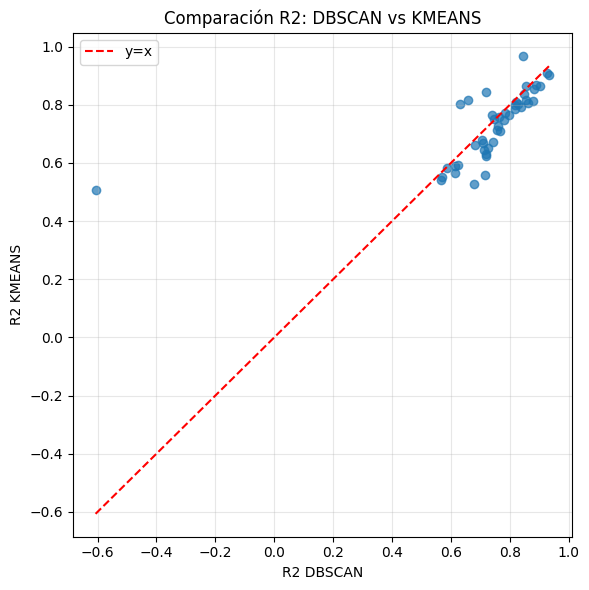

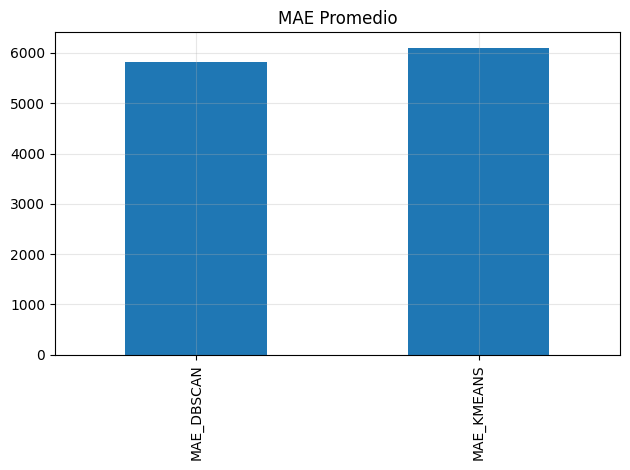

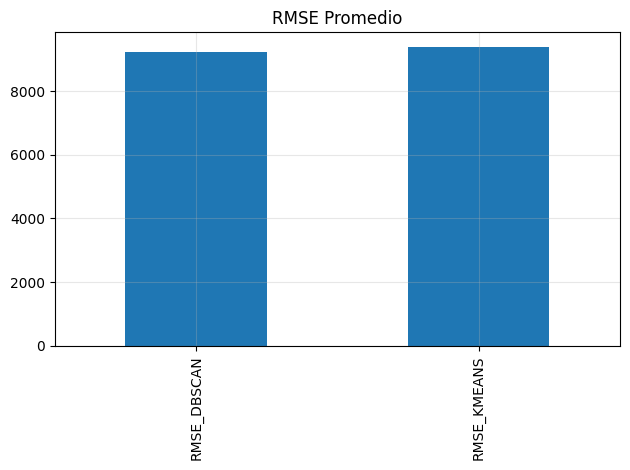

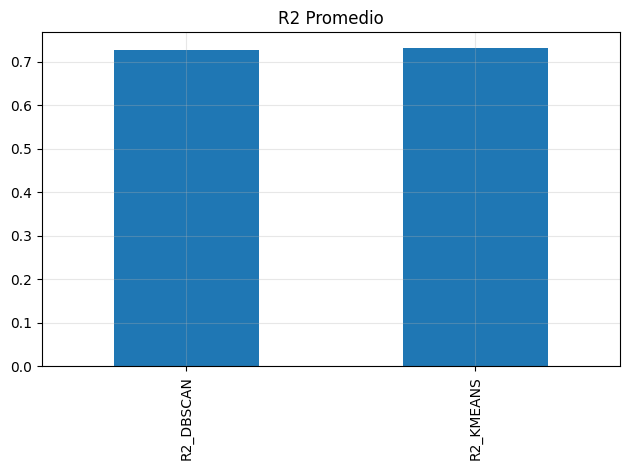

In [ ]:
db = metrics_df_dbscan.reset_index().rename(columns={
    'Cluster': 'Cluster_DBSCAN',
    'MAE': 'MAE_DBSCAN',
    'RMSE': 'RMSE_DBSCAN',
    'R2': 'R2_DBSCAN'
})
km = metrics_df_kmeans.reset_index().rename(columns={
    'Cluster': 'Cluster_KMEANS',
    'MAE': 'MAE_KMEANS',
    'RMSE': 'RMSE_KMEANS',
    'R2': 'R2_KMEANS'
})

compare_df = pd.merge(db, km, on='Store', how='inner')
print("Comparativa métricas por tienda:")
display(compare_df)


# 4) Cálculo de promedios globales
avg_metrics = compare_df[[
    'MAE_DBSCAN', 'MAE_KMEANS', 
    'RMSE_DBSCAN', 'RMSE_KMEANS', 
    'R2_DBSCAN', 'R2_KMEANS'
]].mean().round(3)
print("Promedios globales:")
display(avg_metrics)

# 5) Gráficos de comparación

# 5a) Scatter R2
plt.figure(figsize=(6,6))
plt.scatter(compare_df['R2_DBSCAN'], compare_df['R2_KMEANS'], alpha=0.7)
plt.plot([compare_df['R2_DBSCAN'].min(), compare_df['R2_DBSCAN'].max()],
         [compare_df['R2_DBSCAN'].min(), compare_df['R2_DBSCAN'].max()],
         'r--', label='y=x')
plt.xlabel('R2 DBSCAN')
plt.ylabel('R2 KMEANS')
plt.title('Comparación R2: DBSCAN vs KMEANS')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 5b) Bar chart de promedios
avg_metrics[['MAE_DBSCAN','MAE_KMEANS']].plot(kind='bar', title='MAE Promedio')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

avg_metrics[['RMSE_DBSCAN','RMSE_KMEANS']].plot(kind='bar', title='RMSE Promedio')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

avg_metrics[['R2_DBSCAN','R2_KMEANS']].plot(kind='bar', title='R2 Promedio')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Aunque el R2 de Kmeans sea relativamente mas alto, tambien el MAE y RMSE fueron mas altos en comparacion con DBSCAN

### 4.1.3 Prediccion de Ventas por Departamento

Preparamos dataset por dpto

In [ ]:
agg_funcs = {
    'Weekly_Sales': ['mean', 'std'],
    'PromoStrength_log': ['mean', 'std'],
    'CPI': ['mean', 'std'],
    'Unemployment': ['mean', 'std'],
    'Fuel_Price': ['mean', 'std'],
    'Temperature': ['mean', 'std'],
    'Size': ['mean', 'std']
}

dept_feats = df_co.groupby('Dept').agg(agg_funcs)
dept_feats.columns = ['_'.join(col) for col in dept_feats.columns]
dept_feats.reset_index(inplace=True)

dept_feats


,Dept,Weekly_Sales_mean,Weekly_Sales_std,PromoStrength_mean,PromoStrength_std,CPI_mean,CPI_std,Unemployment_mean,Unemployment_std,Fuel_Price_mean,Fuel_Price_std,Temperature_mean,Temperature_std,Size_mean,Size_std
0,1,19213.485088,15102.373853,6267.753417,14269.377364,171.578394,39.356712,7.999151,1.875885,3.358607,0.459020,60.663782,18.444933,130287.600000,63117.022465
1,2,43607.020113,25176.756920,6267.753417,14269.377364,171.578394,39.356712,7.999151,1.875885,3.358607,0.459020,60.663782,18.444933,130287.600000,63117.022465
2,3,11793.698516,12790.994371,6267.753417,14269.377364,171.578394,39.356712,7.999151,1.875885,3.358607,0.459020,60.663782,18.444933,130287.600000,63117.022465
3,4,25974.630238,13261.140706,6267.753417,14269.377364,171.578394,39.356712,7.999151,1.875885,3.358607,0.459020,60.663782,18.444933,130287.600000,63117.022465
4,5,21365.583515,19988.452259,6354.654678,14348.740273,171.109374,39.412025,7.978057,1.877556,3.365397,0.456204,60.559367,18.475918,131530.357964,62658.132333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,95,69824.423080,38200.536452,6267.753417,14269.377364,171.578394,39.356712,7.999151,1.875885,3.358607,0.459020,60.663782,18.444933,130287.600000,63117.022465
77,96,15210.942761,11255.543496,6240.873578,14172.673288,171.562686,40.215576,7.849295,1.874680,3.359920,0.460280,61.539285,18.688820,129282.010507,69859.622127
78,97,14255.576919,10856.679936,6346.408817,14401.035236,170.445933,39.118958,8.043564,1.874928,3.362418,0.459172,60.490781,18.493282,130676.377190,63682.312165
79,98,6824.694889,5636.056533,6673.407884,14773.443488,169.196443,38.986510,8.111493,1.906592,3.372656,0.454987,60.115942,18.530535,135266.091501,62848.065467


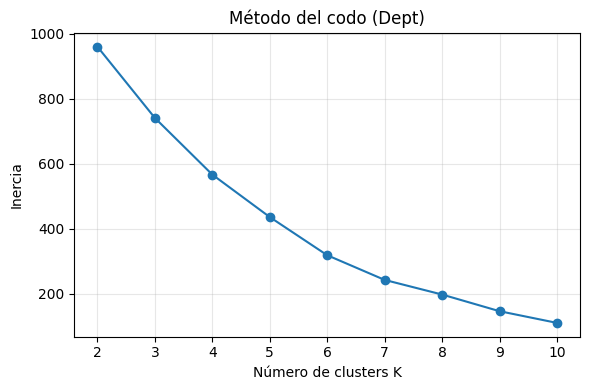

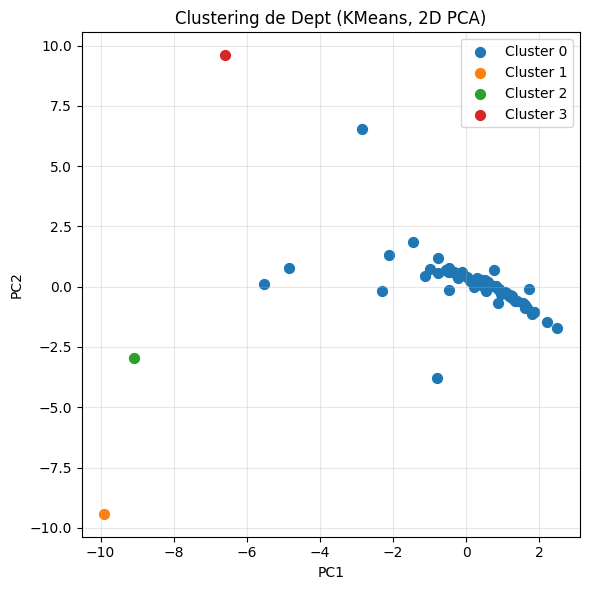

In [ ]:
# 1️⃣ Preparar dataset agregado por Dept
agg_funcs_dept = {
    'Weekly_Sales': ['mean','std'],
    'PromoStrength': ['mean','std'],
    'CPI': ['mean','std'],
    'Unemployment': ['mean','std'],
    'Fuel_Price': ['mean','std'],
    'Temperature': ['mean','std'],
    'Size': ['mean','std']
}
dept_agg = df_co.groupby('Dept').agg(agg_funcs_dept)
dept_agg.columns = ['_'.join(col) for col in dept_agg.columns]
dept_agg.reset_index(inplace=True)

# Variables para clustering
features_dept = [
    'Weekly_Sales_mean','Weekly_Sales_std',
    'PromoStrength_mean','PromoStrength_std',
    'CPI_mean','CPI_std',
    'Unemployment_mean','Unemployment_std',
    'Fuel_Price_mean','Fuel_Price_std',
    'Temperature_mean','Temperature_std',
    'Size_mean','Size_std'
]

# 2️⃣ Estandarizar los datos
scaler_dept = StandardScaler()
dept_scaled = scaler_dept.fit_transform(dept_agg[features_dept])

# 3️⃣ Método del codo para KMeans
inertias_dept = []
K_range = range(2, 11)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(dept_scaled)
    inertias_dept.append(km.inertia_)

plt.figure(figsize=(6,4))
plt.plot(K_range, inertias_dept, marker='o')
plt.title('Método del codo (Dept)')
plt.xlabel('Número de clusters K')
plt.ylabel('Inercia')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 4️⃣ Ajustar KMeans con K elegido (ejemplo k=4)
k_opt_dept = 4
kmeans_dept = KMeans(n_clusters=k_opt_dept, random_state=42)
dept_agg['Dept_KMeans_Cluster'] = kmeans_dept.fit_predict(dept_scaled)

# 5️⃣ Visualizar resultados con PCA
pca_dept = PCA(n_components=2, random_state=42)
coords_dept = pca_dept.fit_transform(dept_scaled)
dept_agg['Dept_PC1'] = coords_dept[:,0]
dept_agg['Dept_PC2'] = coords_dept[:,1]

plt.figure(figsize=(6,6))
for cluster in sorted(dept_agg['Dept_KMeans_Cluster'].unique()):
    subset = dept_agg[dept_agg['Dept_KMeans_Cluster'] == cluster]
    plt.scatter(subset['Dept_PC1'], subset['Dept_PC2'], label=f'Cluster {cluster}', s=50)
plt.title('Clustering de Dept (KMeans, 2D PCA)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



DBSCAN

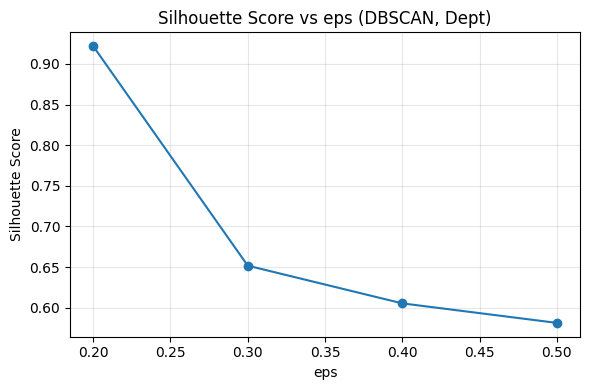

eps óptimo según silhouette: 0.20


In [ ]:
# 1) Reagregar departamentos y recalcular variables
agg_funcs_dept = {
    'Weekly_Sales': ['mean','std'],
    'PromoStrength': ['mean','std'],
    'CPI': ['mean','std'],
    'Unemployment': ['mean','std'],
    'Fuel_Price': ['mean','std'],
    'Temperature': ['mean','std'],
    'Size': ['mean','std']
}
dept_agg_db = df_co.groupby('Dept').agg(agg_funcs_dept)
dept_agg_db.columns = ['_'.join(col) for col in dept_agg_db.columns]
dept_agg_db.reset_index(inplace=True)

features_db = [
    'Weekly_Sales_mean','Weekly_Sales_std',
    'PromoStrength_mean','PromoStrength_std',
    'CPI_mean','CPI_std',
    'Unemployment_mean','Unemployment_std',
    'Fuel_Price_mean','Fuel_Price_std',
    'Temperature_mean','Temperature_std',
    'Size_mean','Size_std'
]

# 2) Escalar para DBSCAN
scaler_db = StandardScaler()
dept_scaled_db = scaler_db.fit_transform(dept_agg_db[features_db])

# 3) Evaluar silhouette para distintos valores de eps
eps_values = np.linspace(0.1, 2.0, 20)
sil_scores = []

for eps in eps_values:
    db = DBSCAN(eps=eps, min_samples=5)
    labels = db.fit_predict(dept_scaled_db)
    mask = labels != -1
    # solo si hay al menos dos clusters útiles
    if len(np.unique(labels[mask])) > 1:
        sil = silhouette_score(dept_scaled_db[mask], labels[mask])
    else:
        sil = np.nan
    sil_scores.append(sil)

# 4) Graficar Silhouette Score vs eps
plt.figure(figsize=(6,4))
plt.plot(eps_values, sil_scores, marker='o')
plt.title('Silhouette Score vs eps (DBSCAN, Dept)')
plt.xlabel('eps')
plt.ylabel('Silhouette Score')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 5) Elegir eps óptimo
eps_opt = eps_values[np.nanargmax(sil_scores)]
print(f"eps óptimo según silhouette: {eps_opt:.2f}")


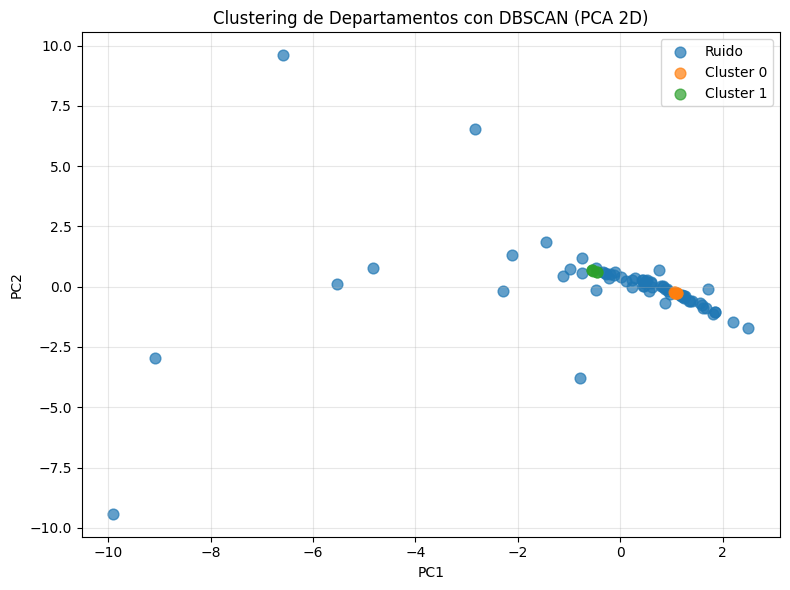

In [ ]:
# 1) Agregar estadísticas por Dept
agg_funcs_dept = {
    'Weekly_Sales': ['mean','std'],
    'PromoStrength': ['mean','std'],
    'CPI': ['mean','std'],
    'Unemployment': ['mean','std'],
    'Fuel_Price': ['mean','std'],
    'Temperature': ['mean','std'],
    'Size': ['mean','std']
}
dept_agg_db = df_co.groupby('Dept').agg(agg_funcs_dept)
dept_agg_db.columns = ['_'.join(col) for col in dept_agg_db.columns]
dept_agg_db.reset_index(inplace=True)

# 2) Selección de features y escalado
features_db = [
    'Weekly_Sales_mean','Weekly_Sales_std',
    'PromoStrength_mean','PromoStrength_std',
    'CPI_mean','CPI_std',
    'Unemployment_mean','Unemployment_std',
    'Fuel_Price_mean','Fuel_Price_std',
    'Temperature_mean','Temperature_std',
    'Size_mean','Size_std'
]
scaler_db = StandardScaler()
dept_scaled_db = scaler_db.fit_transform(dept_agg_db[features_db])

# 3) Aplicar DBSCAN con eps elegido 
eps_opt = 0.2  
db = DBSCAN(eps=eps_opt, min_samples=5)
dept_agg_db['Dept_DBSCAN_Cluster'] = db.fit_predict(dept_scaled_db)

# 4) Reducir dimensiones con PCA para visualización
pca_db = PCA(n_components=2, random_state=42)
coords_db = pca_db.fit_transform(dept_scaled_db)
dept_agg_db['Dept_PC1'] = coords_db[:,0]
dept_agg_db['Dept_PC2'] = coords_db[:,1]

# 5) Plot clusters en espacio PCA
plt.figure(figsize=(8,6))
unique_clusters = sorted(dept_agg_db['Dept_DBSCAN_Cluster'].unique())
for cluster in unique_clusters:
    subset = dept_agg_db[dept_agg_db['Dept_DBSCAN_Cluster']==cluster]
    label = f'Cluster {cluster}' if cluster != -1 else 'Ruido'
    plt.scatter(subset['Dept_PC1'], subset['Dept_PC2'], label=label, s=60, alpha=0.7)

plt.title('Clustering de Departamentos con DBSCAN (PCA 2D)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



Probaremos con otras variables

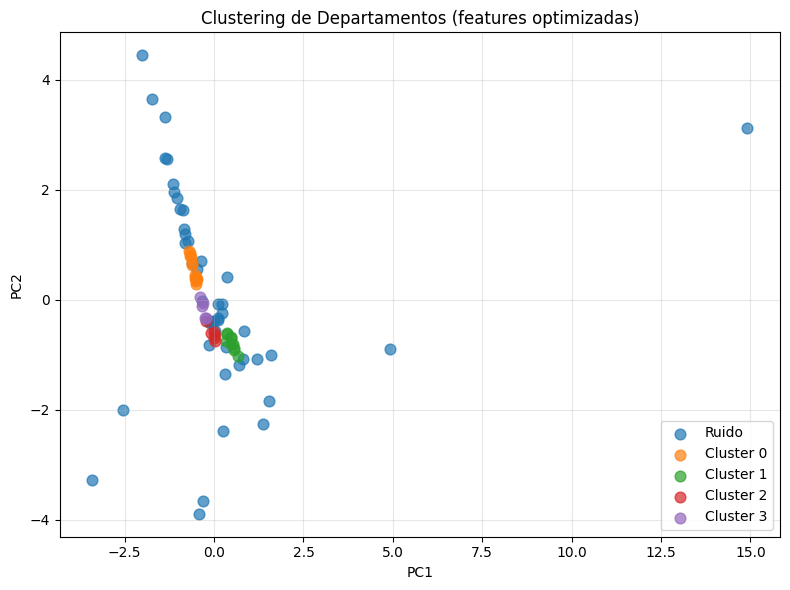

In [ ]:
# 1) Calcular proporciones de estacionalidad por Dept
dept_grouped = df_co.groupby('Dept')

# Proporción de semanas con HolidaySeason e IsEndOfYear por departamento
holiday_ratio = dept_grouped['HolidaySeason'].mean().rename('HolidaySeason_ratio')
endyear_ratio = dept_grouped['IsEndOfYear'].mean().rename('IsEndOfYear_ratio')

# 2) Calcular medias y desviaciones estándar de las variables clave
agg_funcs = {
    'Weekly_Sales': ['mean', 'std'],
    'PromoStrength': ['mean', 'std'],
    'CPI': ['mean'],
    'Unemployment': ['mean'],
    'Size': ['mean']
}

dept_features = dept_grouped.agg(agg_funcs)
dept_features.columns = ['_'.join(col) for col in dept_features.columns]
dept_features = dept_features.reset_index()

# 3) Unir con las proporciones de estacionalidad
dept_features = dept_features.merge(holiday_ratio, on='Dept')
dept_features = dept_features.merge(endyear_ratio, on='Dept')

# 4) Selección de features para clustering
features_selected = [
    'Weekly_Sales_mean', 'Weekly_Sales_std',
    'PromoStrength_mean', 'PromoStrength_std',
    'CPI_mean', 'Unemployment_mean',
    'HolidaySeason_ratio', 'IsEndOfYear_ratio',
    'Size_mean'
]

# 5) Escalar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(dept_features[features_selected])

# 6) Aplicar DBSCAN
dbscan = DBSCAN(eps=0.3, min_samples=5)
dept_features['Dept_DBSCAN_Cluster_v2'] = dbscan.fit_predict(X_scaled)

# 7) PCA para visualización
pca = PCA(n_components=2, random_state=42)
coords = pca.fit_transform(X_scaled)
dept_features['PC1'] = coords[:, 0]
dept_features['PC2'] = coords[:, 1]

# 8) Visualización
plt.figure(figsize=(8, 6))
palette = sns.color_palette("tab10", n_colors=len(dept_features['Dept_DBSCAN_Cluster_v2'].unique()))
for cluster in sorted(dept_features['Dept_DBSCAN_Cluster_v2'].unique()):
    subset = dept_features[dept_features['Dept_DBSCAN_Cluster_v2'] == cluster]
    label = f'Cluster {cluster}' if cluster != -1 else 'Ruido'
    plt.scatter(subset['PC1'], subset['PC2'], label=label, s=60, alpha=0.7)

plt.title('Clustering de Departamentos (features optimizadas)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


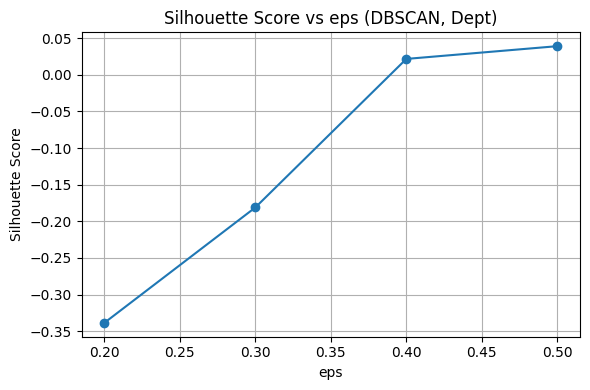

In [ ]:
eps_values = [0.2, 0.3, 0.4, 0.5]
silhouette_scores = []

for eps in eps_values:
    dbscan = DBSCAN(eps=eps, min_samples=5)
    labels = dbscan.fit_predict(dept_scaled)

    # Excluir casos con solo un cluster o todos ruido (-1)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    if n_clusters <= 1:
        silhouette_scores.append(np.nan)
    else:
        score = silhouette_score(dept_scaled, labels)
        silhouette_scores.append(score)

# Visualización
plt.figure(figsize=(6, 4))
plt.plot(eps_values, silhouette_scores, marker='o')
plt.title("Silhouette Score vs eps (DBSCAN, Dept)")
plt.xlabel("eps")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.tight_layout()
plt.show()


Seguimos sin tener clusters definidos, buscaremos ahora con el cluster Jerarquico

In [ ]:
agg_dept = df_co.groupby('Dept').agg({
    'Weekly_Sales':  ['mean', 'std'],
    'PromoStrength': ['mean', 'std'],
    'CPI':           ['mean'],
    'Unemployment':  ['mean']
})
agg_dept.columns = ['_'.join(col) for col in agg_dept.columns]
agg_dept.reset_index(inplace=True)

agg_dept

,Dept,Weekly_Sales_mean,Weekly_Sales_std,PromoStrength_mean,PromoStrength_std,CPI_mean,Unemployment_mean
0,1,19213.485088,15102.373853,6267.753417,14269.377364,171.578394,7.999151
1,2,43607.020113,25176.756920,6267.753417,14269.377364,171.578394,7.999151
2,3,11793.698516,12790.994371,6267.753417,14269.377364,171.578394,7.999151
3,4,25974.630238,13261.140706,6267.753417,14269.377364,171.578394,7.999151
4,5,21365.583515,19988.452259,6354.654678,14348.740273,171.109374,7.978057
...,...,...,...,...,...,...,...
76,95,69824.423080,38200.536452,6267.753417,14269.377364,171.578394,7.999151
77,96,15210.942761,11255.543496,6240.873578,14172.673288,171.562686,7.849295
78,97,14255.576919,10856.679936,6346.408817,14401.035236,170.445933,8.043564
79,98,6824.694889,5636.056533,6673.407884,14773.443488,169.196443,8.111493


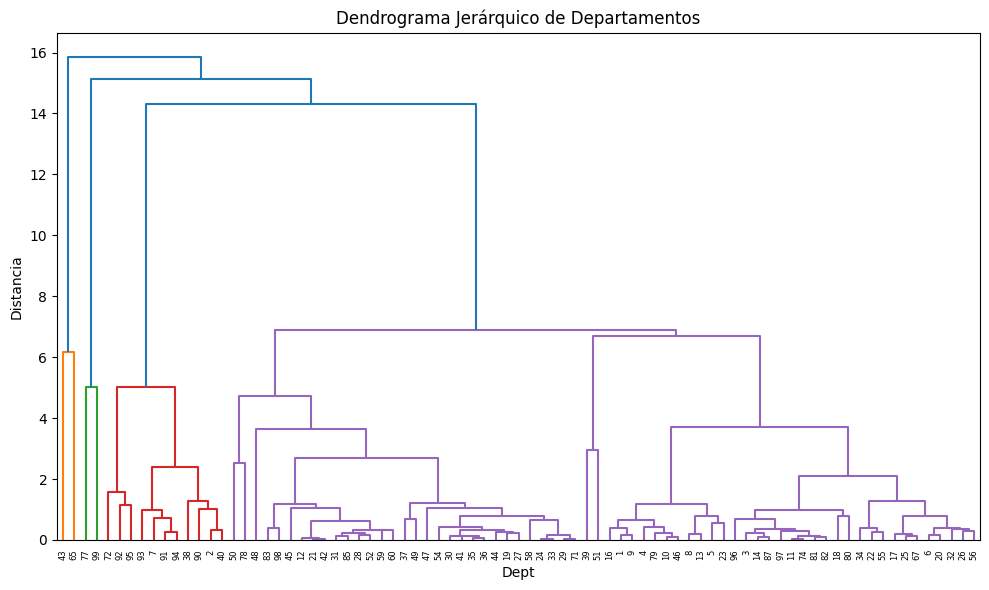

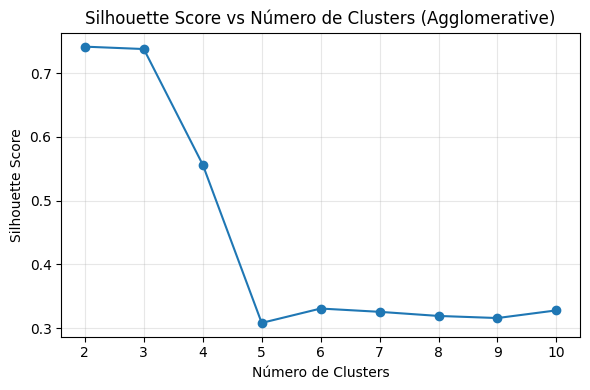

In [ ]:
#    Extraer características numéricas
X = agg_dept.drop(columns='Dept').values

# 2) Escalar
scaler = StandardScaler()
X_scaled_aggl = scaler.fit_transform(X)

# 3) Dendrograma jerárquico (usando Ward)
Z = linkage(X_scaled_aggl, method='ward')
plt.figure(figsize=(10, 6))
dendrogram(Z, labels=agg_dept['Dept'].astype(str).tolist(), leaf_rotation=90)
plt.title("Dendrograma Jerárquico de Departamentos")
plt.xlabel("Dept")
plt.ylabel("Distancia")
plt.tight_layout()
plt.show()

# 4) Silhouette para diferentes números de clusters
range_n_clusters = range(2, 11)
sil_scores = []
for n in range_n_clusters:
    agg = AgglomerativeClustering(n_clusters=n, linkage='ward')
    labels = agg.fit_predict(X_scaled_aggl)
    sil = silhouette_score(X_scaled_aggl, labels)
    sil_scores.append(sil)

# 5) Graficar Silhouette Score vs número de clusters
plt.figure(figsize=(6, 4))
plt.plot(range_n_clusters, sil_scores, marker='o')
plt.title("Silhouette Score vs Número de Clusters (Agglomerative)")
plt.xlabel("Número de Clusters")
plt.ylabel("Silhouette Score")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()




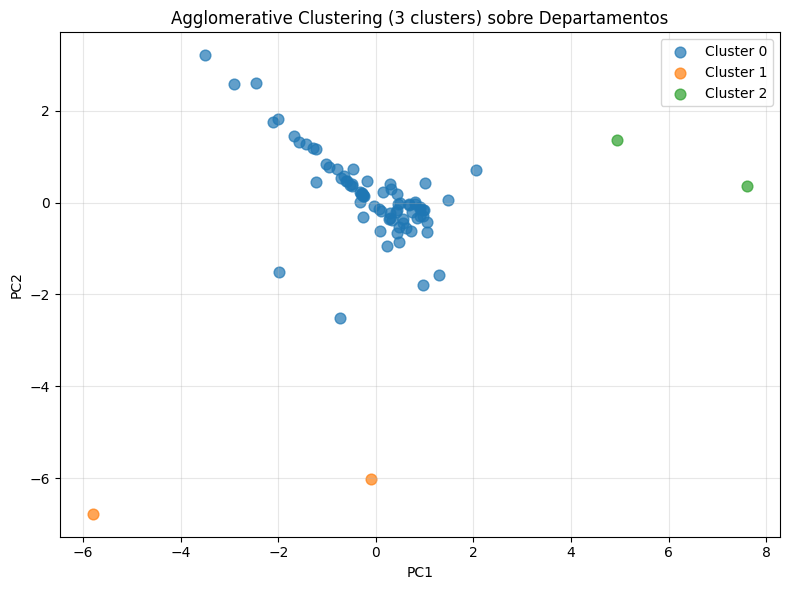

In [ ]:
# 2) Preparar matriz de características
X = agg_dept.drop(columns='Dept').values

# 3) Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4) Aplicar Agglomerative Clustering con 3 clusters
agglo = AgglomerativeClustering(n_clusters=3, linkage='ward')
labels = agglo.fit_predict(X_scaled)
agg_dept['Agglo_3_Cluster'] = labels

# 5) Reducir a 2 componentes con PCA para visualización
pca = PCA(n_components=2, random_state=42)
coords = pca.fit_transform(X_scaled)
agg_dept['PC1'] = coords[:, 0]
agg_dept['PC2'] = coords[:, 1]

# 6) Graficar clusters en espacio PCA
plt.figure(figsize=(8, 6))
for cluster in sorted(agg_dept['Agglo_3_Cluster'].unique()):
    subset = agg_dept[agg_dept['Agglo_3_Cluster'] == cluster]
    plt.scatter(subset['PC1'], subset['PC2'], label=f'Cluster {cluster}', s=60, alpha=0.7)

plt.title('Agglomerative Clustering (3 clusters) sobre Departamentos')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Aunque la mayoria de los datos se concentran en un cluster, puede ayudarnos para definir los clusters y evaluar los otros dos de forma individual para entender su comportamiento

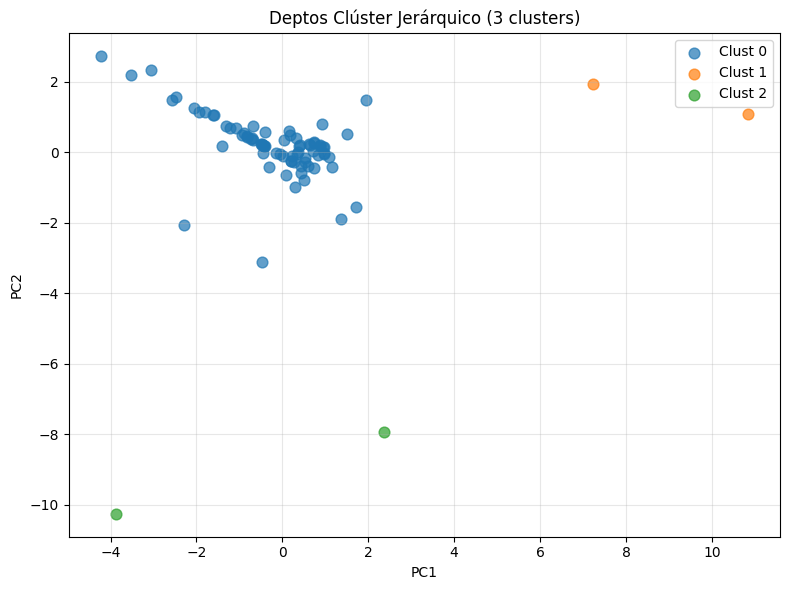

,Dept_Cluster,Model,N_obs,MAE,RMSE,R2
0,0,ExtraTrees,420403,6432.762048,10683.393420,0.766640
1,0,XGBoost,420403,11872.008160,18469.544902,0.302539
2,1,ExtraTrees,1012,257.334859,419.945668,-4.438041
3,1,XGBoost,1012,260.769458,385.961006,-3.593493
4,2,ExtraTrees,155,11540.399281,13638.021575,0.201216
5,2,XGBoost,155,9628.125469,11338.404078,0.447884


In [ ]:
# --- 1) Clustering jerárquico sobre Departamentos  ---

# 2) Preparar matriz de características (sin Dept)
X = agg_dept.drop(columns='Dept').values

# 3) Escalar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 4) Agglomerative Clustering con 3 clusters
agglo = AgglomerativeClustering(n_clusters=3, linkage='ward')
agg_dept['Agglo_3_Cluster'] = agglo.fit_predict(X_scaled)

# 5) (Opcional) PCA para validar visualmente
pca = PCA(n_components=2, random_state=42)
coords = pca.fit_transform(X_scaled)
agg_dept['PC1'] = coords[:,0]
agg_dept['PC2'] = coords[:,1]

plt.figure(figsize=(8,6))
for c in sorted(agg_dept['Agglo_3_Cluster'].unique()):
    sub = agg_dept[agg_dept['Agglo_3_Cluster']==c]
    plt.scatter(sub['PC1'], sub['PC2'], label=f'Clust {c}', s=60, alpha=0.7)
plt.title('Deptos Clúster Jerárquico (3 clusters)')
plt.xlabel('PC1'); plt.ylabel('PC2')
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout()
plt.show()

# --- 6) Mapear Dept → Dept_Cluster en df_co ---
dept2cluster = agg_dept.set_index('Dept')['Agglo_3_Cluster'].to_dict()
df_co['Dept_Cluster'] = df_co['Dept'].map(dept2cluster)

# --- 7) Modelado por Dept_Cluster ---
features = [
    'Size','CPI','Unemployment','Fuel_Price','Temperature',
    'PromoStrength_log','IsHoliday','HasPromotion','HolidaySeason',
    'IsEndOfYear','week','month','WeekSin','Trend'
]

metrics = []
for cluster in sorted(df_co['Dept_Cluster'].dropna().unique()):
    df_cl = df_co[df_co['Dept_Cluster']==cluster].sort_values('Date')
    if len(df_cl) < 20:
        continue

    # Preparar X, y
    Xf = df_cl[features+['Type']].copy()
    y  = df_cl['Weekly_Sales']

    # Codificación
    Xf = pd.get_dummies(Xf, columns=['Type'], drop_first=True)
    bool_cols = Xf.select_dtypes(include='bool').columns
    Xf[bool_cols] = Xf[bool_cols].astype(int)

    # Split temporal
    X_train, X_test, y_train, y_test = train_test_split(
        Xf, y, test_size=0.3, shuffle=False, random_state=42
    )

    # Modelos
    models = {
        'XGBoost':    XGBRegressor(objective='reg:squarederror', random_state=42),
        'ExtraTrees': ExtraTreesRegressor(random_state=42)
    }

    # Entrenar y evaluar
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        metrics.append({
            'Dept_Cluster': cluster,
            'Model':        name,
            'N_obs':        len(df_cl),
            'MAE':          mean_absolute_error(y_test, y_pred),
            'RMSE':         np.sqrt(mean_squared_error(y_test, y_pred)),
            'R2':           r2_score(y_test, y_pred)
        })

# 8) Resultados
results_df = pd.DataFrame(metrics).sort_values(['Dept_Cluster','Model']).reset_index(drop=True)
display(results_df)


In [ ]:
# 1) Filtrar departamentos del cluster 1
depts_cluster1 = sorted(df_co.loc[df_co['Dept_Cluster'] == 1, 'Dept'].unique())

# 2) Variables predictoras
features = [
    'Size','CPI','Unemployment','Fuel_Price','Temperature',
    'PromoStrength_log','IsHoliday','HasPromotion','HolidaySeason',
    'IsEndOfYear','week','month','WeekSin','Trend'
]

# 3) Contenedor para métricas
metrics_per_dept = []

# 4) Loop por cada departamento
for dept in depts_cluster1:
    df_d = df_co[df_co['Dept'] == dept].sort_values('Date')
    if len(df_d) < 20:  # saltar dptos con pocos datos
        continue

    X = df_d[features + ['Type']].copy()
    y = df_d['Weekly_Sales']

    # Codificar Type y booleanos
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    bool_cols = X.select_dtypes(include='bool').columns
    X[bool_cols] = X[bool_cols].astype(int)

    # Split train/test 70/30 temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # Modelos estándar
    models = {
        'XGBoost':    XGBRegressor(objective='reg:squarederror', random_state=42),
        'ExtraTrees': ExtraTreesRegressor(random_state=42)
    }

    # Entrenar y medir
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        metrics_per_dept.append({
            'Dept':     dept,
            'Model':    name,
            'N_obs':    len(df_d),
            'MAE':      mean_absolute_error(y_test, y_pred),
            'RMSE':     np.sqrt(mean_squared_error(y_test, y_pred)),
            'R2':       r2_score(y_test, y_pred)
        })

# 5) DataFrame de resultados
metrics_dept_df = pd.DataFrame(metrics_per_dept).set_index(['Dept','Model'])
metrics_dept_df


N_obs         MAE        RMSE        R2
Dept Model                                              
77   XGBoost       150  156.307651  201.169421 -1.176966
     ExtraTrees    150  165.104933  203.708646 -1.232270
99   XGBoost       862  164.704304  245.757672 -0.626398
     ExtraTrees    862  240.441051  421.921088 -3.793748

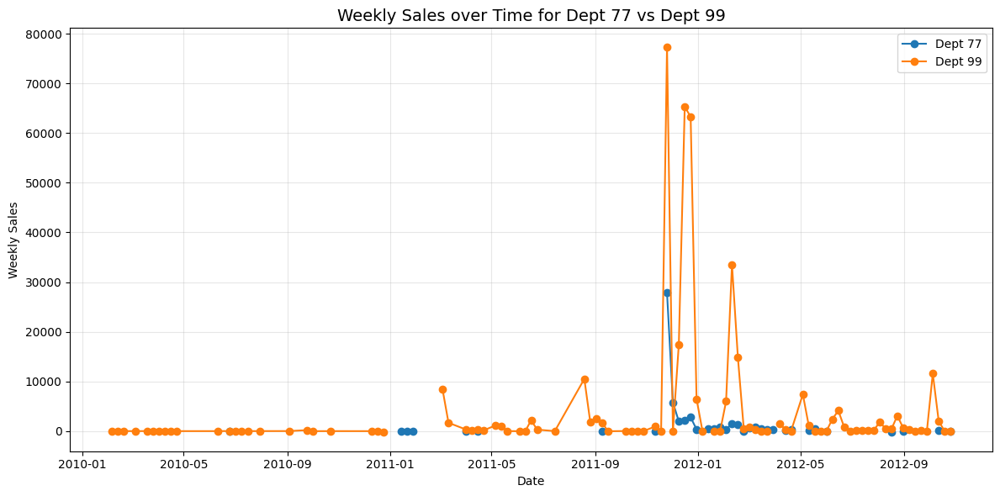

Resumen estadístico de Weekly_Sales por Dept:


,count,mean,std,min,max
Dept,,,,,
77,150.0,328.961800,343.471023,-175.0,1590.0
99,862.0,415.487065,1099.725277,-147.0,12550.0


In [ ]:
# 1) Especificar los dos Dept 
dept_a, dept_b = 77, 99  

# 2) Filtrar df_co para esos dos departamentos
df_compare = df_co[df_co['Dept'].isin([dept_a, dept_b])].copy()

# 3) Asegurarse de que Date es datetime y ordenar
df_compare['Date'] = pd.to_datetime(df_compare['Date'])
df_compare.sort_values('Date', inplace=True)

# 4) Pivot para tener una columna de ventas por cada Dept
ts = df_compare.pivot_table(
    index='Date',
    columns='Dept',
    values='Weekly_Sales',
    aggfunc='sum'
)

# 5) Graficar series de tiempo
plt.figure(figsize=(12, 6))
for dept in ts.columns:
    plt.plot(ts.index, ts[dept], marker='o', linestyle='-', label=f'Dept {dept}')

plt.title(f'Weekly Sales over Time for Dept {dept_a} vs Dept {dept_b}', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# 6) (Opcional) Estadísticas resumen por departamento
summary = df_compare.groupby('Dept')['Weekly_Sales'].describe()[['count','mean','std','min','max']]
print("Resumen estadístico de Weekly_Sales por Dept:")
display(summary)


Evaluamos los modelos

In [ ]:
# 1) Definir features
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price','Temperature',
    'PromoStrength_log','IsHoliday','HasPromotion','HolidaySeason',
    'IsEndOfYear','week','month','WeekSin','Trend'
]

# 2) Espacio de búsqueda de hiperparámetros para ExtraTrees
et_param_dist = {
    'n_estimators':      [100, 300, 500, 800],
    'max_depth':         [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf':  [1, 2, 4],
    'max_features':      ['sqrt', 'log2', 0.5]
}

# 3) Configurar CV temporal
tscv = TimeSeriesSplit(n_splits=5)

# 4) Función de tuning para un dept cluster jerárquico
def tune_et_for_dept_cluster(cluster_label, n_iter=20):
    df_cl = df_co[df_co['Dept_Cluster'] == cluster_label].sort_values('Date')
    if df_cl.shape[0] < 20:
        print(f"Cluster {cluster_label} (<20 obs), omitiendo.")
        return None

    # Preparar X, y
    X = df_cl[features_2 + ['Type']].copy()
    y = df_cl['Weekly_Sales']
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    bool_cols = X.select_dtypes(include='bool').columns
    X[bool_cols] = X[bool_cols].astype(int)

    # Split temporal 70/30
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # Configurar RandomizedSearchCV
    et = ExtraTreesRegressor(random_state=42)
    search = RandomizedSearchCV(
        estimator=et,
        param_distributions=et_param_dist,
        n_iter=n_iter,
        scoring='neg_root_mean_squared_error',
        cv=tscv,
        random_state=42,
        n_jobs=1,
        verbose=0
    )
    print(f"Afinando ExtraTrees para Dept_Cluster {cluster_label} (train n={len(X_train)})…")
    search.fit(X_train, y_train)

    best_params = search.best_params_
    cv_rmse = -search.best_score_

    # Evaluar en test
    y_pred = search.best_estimator_.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    test_mae  = mean_absolute_error(y_test, y_pred)

    return {
        'Dept_Cluster': cluster_label,
        'CV_RMSE':      cv_rmse,
        'Test_RMSE':    test_rmse,
        'Test_MAE':     test_mae,
        'BestParams':   best_params
    }

# 5) Ejecutar tuning para cada cluster jerárquico (0,1,2)
results = []
for cl in sorted(df_co['Dept_Cluster'].unique()):
    res = tune_et_for_dept_cluster(cl, n_iter=20)
    if res is not None:
        results.append(res)

# 6) Consolidar en DataFrame
tuning_dept_df = pd.DataFrame(results).set_index('Dept_Cluster')
print("Hiperparámetros y CV por Dept_Cluster (ExtraTrees):")
display(tuning_dept_df)


Afinando ExtraTrees para Dept_Cluster 0 (train n=294282)…
Afinando ExtraTrees para Dept_Cluster 1 (train n=708)…
Afinando ExtraTrees para Dept_Cluster 2 (train n=108)…
Hiperparámetros y CV por Dept_Cluster (ExtraTrees):


,CV_RMSE,Test_RMSE,Test_MAE,BestParams
Dept_Cluster,,,,
0,11325.177325,12201.477779,7481.570403,"{'n_estimators': 800, 'min_samples_split': 2, ..."
1,1051.780949,254.677448,214.411146,"{'n_estimators': 500, 'min_samples_split': 10,..."
2,7645.715989,13474.662091,11499.298822,"{'n_estimators': 800, 'min_samples_split': 2, ..."


Clusters 2 y 3 con XG Boost

In [ ]:
# 1) Definir features
features_2 = [
    'Size','CPI','Unemployment','Fuel_Price','Temperature',
    'PromoStrength_log','IsHoliday','HasPromotion','HolidaySeason',
    'IsEndOfYear','week','month','WeekSin','Trend'
]

# 2) Espacio de búsqueda de hiperparámetros para XGBoost
xgb_param_dist = {
    'n_estimators':     [100, 300, 500, 800],
    'max_depth':        [3, 5, 7, 9],
    'learning_rate':    [0.01, 0.05, 0.1],
    'subsample':        [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma':            [0, 0.1, 0.3, 0.5]
}

# 3) Configurar CV temporal
tscv = TimeSeriesSplit(n_splits=5)

# 4) Función de tuning para XGBoost en un Dept_Cluster dado
def tune_xgb_for_dept_cluster(cluster_label, n_iter=20):
    df_cl = df_co[df_co['Dept_Cluster'] == cluster_label].sort_values('Date')
    if df_cl.shape[0] < 20:
        print(f"Dept_Cluster {cluster_label} (<20 obs), omitiendo.")
        return None

    # Preparar X,y
    X = df_cl[features_2 + ['Type']].copy()
    y = df_cl['Weekly_Sales']
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    for c in X.select_dtypes(include='bool'):
        X[c] = X[c].astype(int)

    # Split temporal 70/30
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # Configurar RandomizedSearchCV
    xgb = XGBRegressor(objective='reg:squarederror', random_state=42)
    search = RandomizedSearchCV(
        estimator=xgb,
        param_distributions=xgb_param_dist,
        n_iter=n_iter,
        scoring='neg_root_mean_squared_error',
        cv=tscv,
        random_state=42,
        n_jobs=1,
        verbose=1
    )
    print(f"Afinando XGBoost para Dept_Cluster {cluster_label} (train n={len(X_train)})…")
    search.fit(X_train, y_train)

    best_params = search.best_params_
    cv_rmse = -search.best_score_

    # Evaluación en test
    y_pred = search.best_estimator_.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    test_mae  = mean_absolute_error(y_test, y_pred)

    return {
        'Dept_Cluster': cluster_label,
        'CV_RMSE':      cv_rmse,
        'Test_RMSE':    test_rmse,
        'Test_MAE':     test_mae,
        'BestParams':   best_params
    }

# 5) Ejecutar tuning para Dept_Cluster 2 y 3
results_xgb = []
for cl in [1, 2]:
    res = tune_xgb_for_dept_cluster(cl, n_iter=20)
    if res is not None:
        results_xgb.append(res)

# 6) Consolidar resultados en DataFrame
tuning_dept_xgb_df = pd.DataFrame(results_xgb).set_index('Dept_Cluster')
print("Hiperparámetros y CV de XGBoost para Dept_Clusters 2 y 3:")
display(tuning_dept_xgb_df)


Afinando XGBoost para Dept_Cluster 1 (train n=708)…
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Afinando XGBoost para Dept_Cluster 2 (train n=108)…
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Hiperparámetros y CV de XGBoost para Dept_Clusters 2 y 3:


,CV_RMSE,Test_RMSE,Test_MAE,BestParams
Dept_Cluster,,,,
1,1101.156478,391.187934,349.723777,"{'subsample': 1.0, 'n_estimators': 100, 'max_d..."
2,7364.290896,15578.302177,13363.737748,"{'subsample': 0.8, 'n_estimators': 800, 'max_d..."


Predicciones por departamento

Cluster 0 best params: {'n_estimators': 800, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': None}
Cluster 1 best params: {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': None}
Cluster 2 best params: {'n_estimators': 800, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': None}
Métricas por Dept_Cluster:


,Model,MAE,RMSE,R2
Dept_Cluster,,,,
0,ExtraTrees,7481.570403,12201.477779,0.695608
1,XGBoost,261.672820,387.105967,-3.620787
2,XGBoost,9628.682769,11339.050647,0.447821


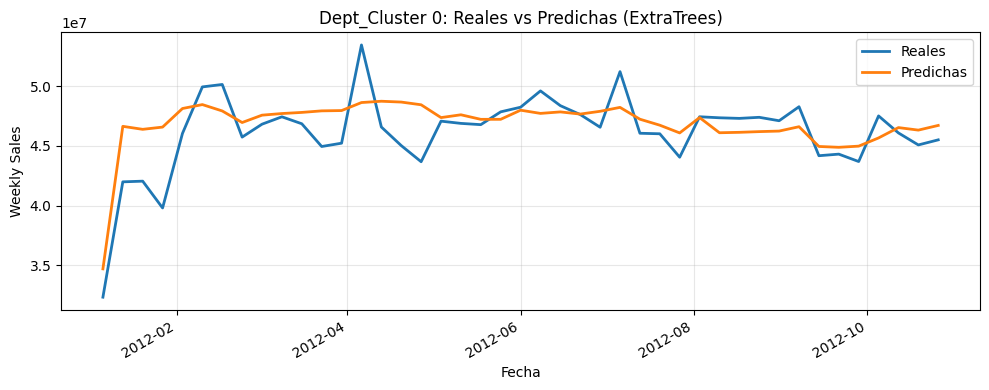

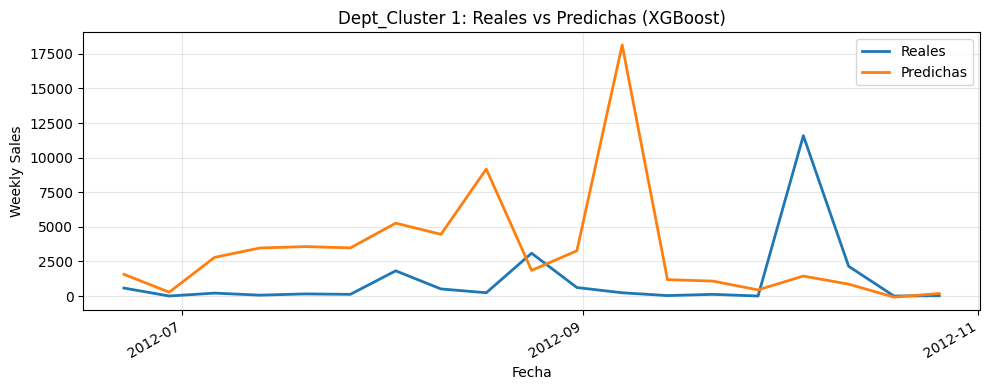

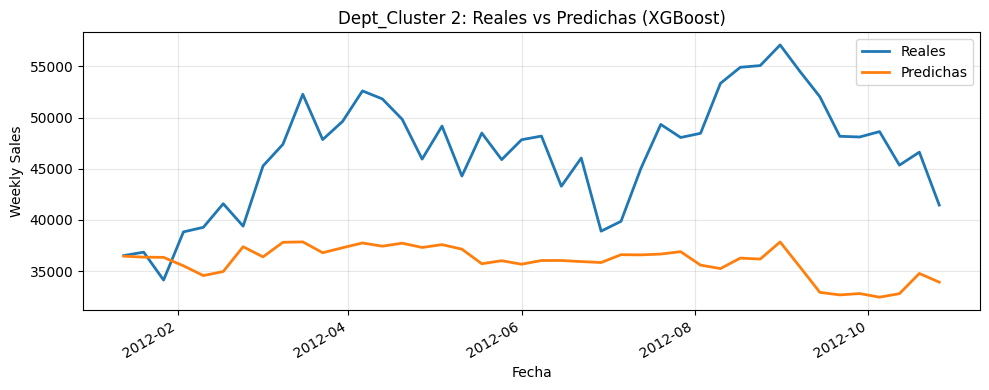

In [ ]:
# 1) Parámetros del cluster 0:
params_et_0 = tuning_dept_df.loc[0, 'BestParams']
print("Cluster 0 best params:", params_et_0)

# 2) Parámetros del cluster 1:
params_xgb_1 = tuning_dept_df.loc[1, 'BestParams']
print("Cluster 1 best params:", params_xgb_1)

# 3) Parámetros del cluster 2:
params_xgb_2 = tuning_dept_df.loc[2, 'BestParams']
print("Cluster 2 best params:", params_xgb_2)

# 1) Mapeo Dept_Cluster → (modelo, parámetros)
cluster_models = {
    0: ('ExtraTrees', params_et_0),
    1: ('XGBoost',   params_xgb_1),
    2: ('XGBoost',   params_xgb_2)
}

# 2) Definir features
features = [
    'Size','CPI','Unemployment','Fuel_Price','Temperature',
    'PromoStrength_log','IsHoliday','HasPromotion','HolidaySeason',
    'IsEndOfYear','week','month','WeekSin','Trend'
]

# 3) Contenedores
predictions_by_cluster = {}
metrics_list = []

# 4) Loop sobre clusters especificados
for cluster, (model_name, params) in cluster_models.items():
    df_cl = df_co[df_co['Dept_Cluster'] == cluster].sort_values('Date')
    if df_cl.shape[0] < 20:
        print(f"Dept_Cluster {cluster}: <20 obs, se omite.")
        continue

    # Preparar X,y
    X = df_cl[features + ['Type']].copy()
    y = df_cl['Weekly_Sales']
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    for col in X.select_dtypes(include='bool').columns:
        X[col] = X[col].astype(int)

    # Train/test split temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # Instanciar modelo
    if model_name == 'ExtraTrees':
        model = ExtraTreesRegressor(random_state=42, **params)
    else:
        model = XGBRegressor(objective='reg:squarederror', random_state=42, **params)

    # Entrenar y predecir
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # DataFrame de predicciones
    df_pred = pd.DataFrame({
        'Date':      df_cl.loc[y_test.index, 'Date'],
        'Actual':    y_test.values,
        'Predicted': y_pred
    }).groupby('Date').sum().reset_index()

    predictions_by_cluster[cluster] = df_pred

    # Métricas
    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)

    metrics_list.append({
        'Dept_Cluster': cluster,
        'Model':        model_name,
        'MAE':          mae,
        'RMSE':         rmse,
        'R2':           r2
    })

# 5) Mostrar métricas
metrics_df = pd.DataFrame(metrics_list).set_index('Dept_Cluster')
print("Métricas por Dept_Cluster:")
display(metrics_df)

# 6) Graficar resultados
for cluster, df_pred in predictions_by_cluster.items():
    fig, ax = plt.subplots(figsize=(10,4))
    ax.plot(df_pred['Date'], df_pred['Actual'],    label='Reales',    linewidth=2)
    ax.plot(df_pred['Date'], df_pred['Predicted'], label='Predichas', linewidth=2)
    ax.set_title(f"Dept_Cluster {cluster}: Reales vs Predichas ({cluster_models[cluster][0]})")
    ax.set_xlabel('Fecha'); ax.set_ylabel('Weekly Sales')
    ax.legend(); ax.grid(alpha=0.3)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    fig.autofmt_xdate()
    plt.tight_layout()
    plt.show()


El cluster 0 fue relativamente bueno aunque los otros dos se comportan de una manera muy negativa, trataremos de analisar la razon de esto

Cluster 0 best params: {'n_estimators': 800, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': None}
Cluster 1 best params: {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': None}
Cluster 2 best params: {'n_estimators': 800, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.5, 'max_depth': None}


,Dept_Cluster,Model,MAE,RMSE,R2
Dept,,,,,
1,0,ExtraTrees,3717.268341,8888.886457,0.579541
2,0,ExtraTrees,3334.652011,4683.288487,0.964883
3,0,ExtraTrees,1822.689043,4487.116358,0.894288
4,0,ExtraTrees,1932.509001,2795.789697,0.956052
5,0,ExtraTrees,3482.791126,5044.162111,0.844623
...,...,...,...,...,...
95,0,ExtraTrees,5797.818717,8664.398518,0.948377
96,0,ExtraTrees,2031.180822,3245.439219,0.928052
97,0,ExtraTrees,1344.954416,2149.445525,0.961316


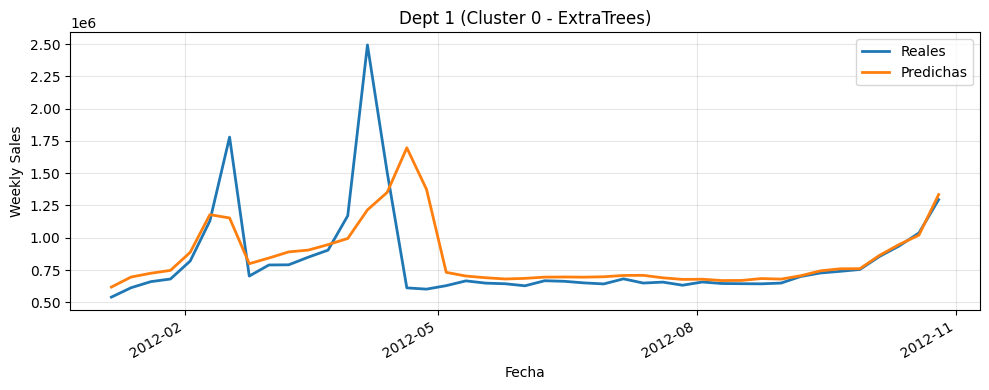

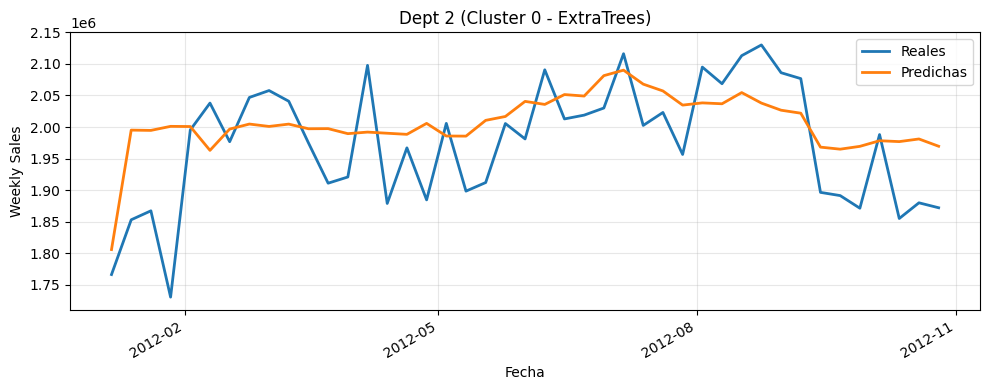

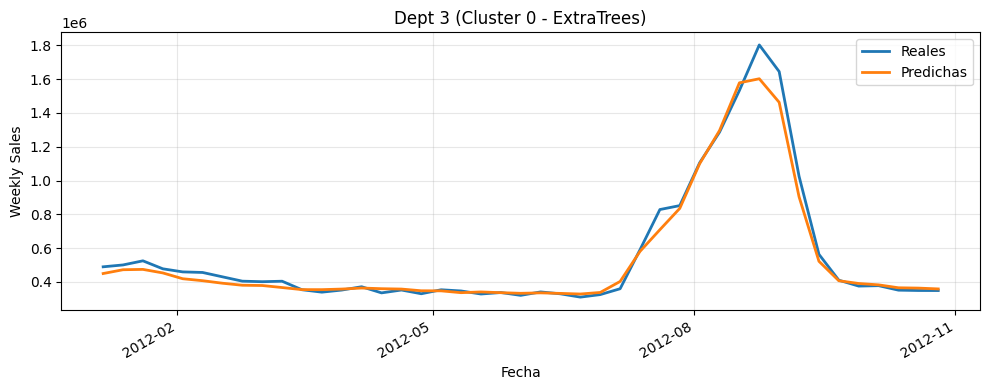

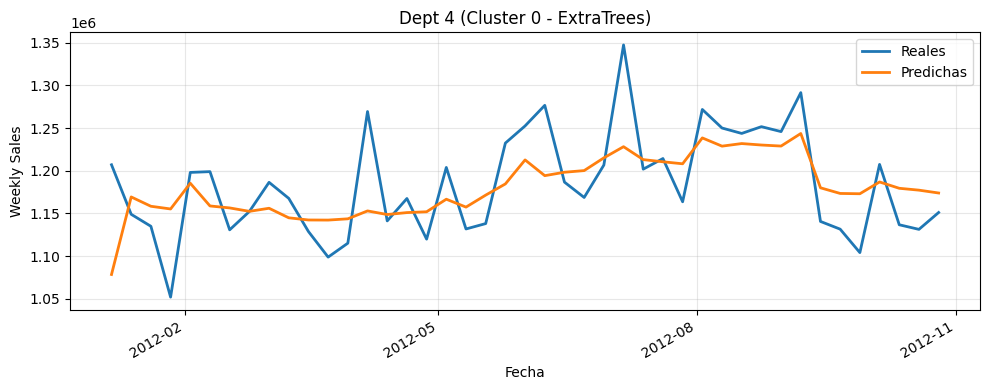

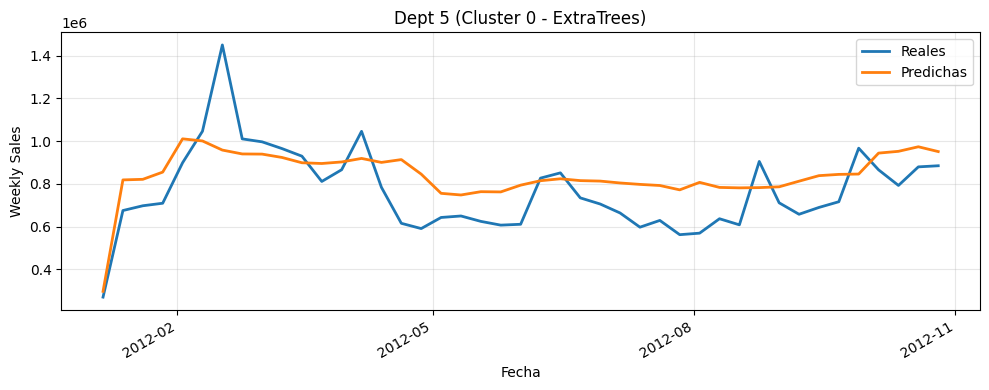

...

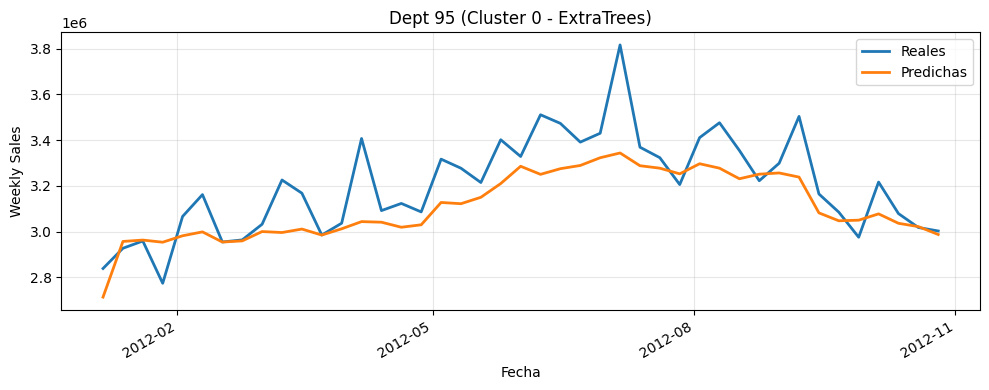

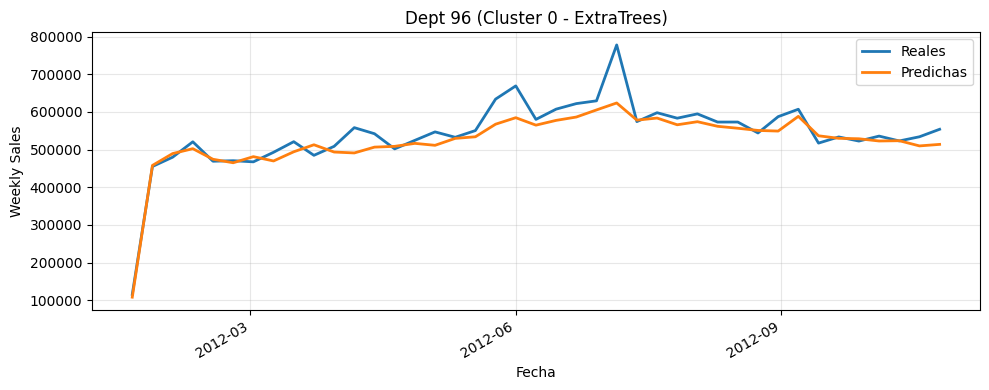

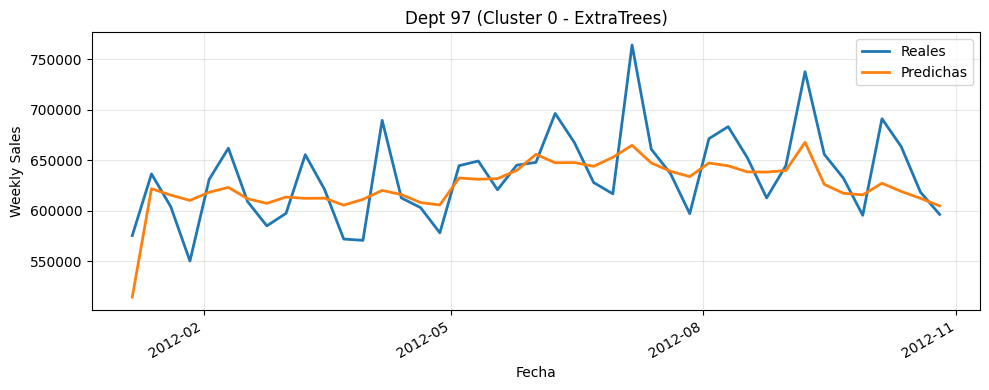

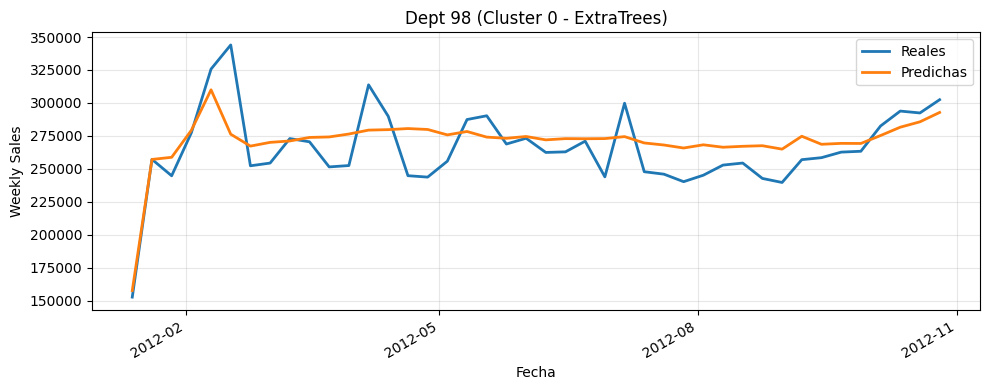

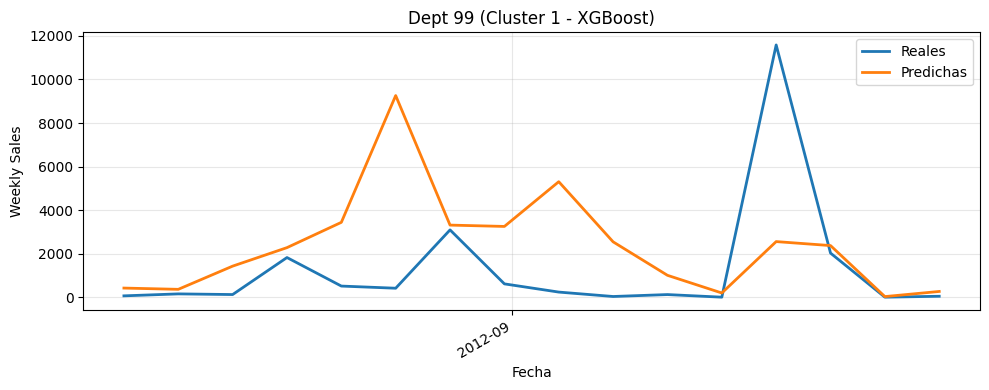

In [ ]:
# 1) Parámetros del cluster 0:
params_et_0 = tuning_dept_df.loc[0, 'BestParams']
print("Cluster 0 best params:", params_et_0)

# 2) Parámetros del cluster 1:
params_xgb_1 = tuning_dept_df.loc[1, 'BestParams']
print("Cluster 1 best params:", params_xgb_1)

# 3) Parámetros del cluster 2:
params_xgb_2 = tuning_dept_df.loc[2, 'BestParams']
print("Cluster 2 best params:", params_xgb_2)

# 1) Map Dept_Cluster → (modelo, parámetros)
cluster_models = {
    0: ('ExtraTrees', params_et_0),
    1: ('XGBoost',   params_xgb_1),
    2: ('XGBoost',   params_xgb_2)
}

# 2) Definir features
features = [
    'Size','CPI','Unemployment','Fuel_Price','Temperature',
    'PromoStrength_log','IsHoliday','HasPromotion','HolidaySeason',
    'IsEndOfYear','week','month','WeekSin','Trend'
]

# 3) Obtener mapping Dept → Dept_Cluster
dept2cluster = df_co[['Dept','Dept_Cluster']].drop_duplicates().set_index('Dept')['Dept_Cluster'].to_dict()

# 4) Contenedores
metrics_per_dept = []
predictions_per_dept = {}

# 5) Loop por cada departamento
for dept, cluster in sorted(dept2cluster.items()):
    if cluster not in cluster_models:
        continue  # salta clusters no mapeados

    df_d = df_co[df_co['Dept']==dept].sort_values('Date')
    if df_d.shape[0] < 20:
        continue  # departamentos con pocos datos

    # a) Preparar X, y
    X = df_d[features + ['Type']].copy()
    y = df_d['Weekly_Sales']

    # b) Codificar Type y bool→int
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)
    for c in X.select_dtypes(include='bool').columns:
        X[c] = X[c].astype(int)

    # c) Split temporal 70/30
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # d) Instanciar modelo
    model_name, params = cluster_models[cluster]
    if model_name=='ExtraTrees':
        model = ExtraTreesRegressor(random_state=42, **params)
    else:
        model = XGBRegressor(objective='reg:squarederror', random_state=42, **params)

    # e) Entrenar y predecir
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # f) Guardar predicciones agregadas por fecha
    df_pred = pd.DataFrame({
        'Date':      df_d.loc[y_test.index,'Date'],
        'Actual':    y_test.values,
        'Predicted': y_pred
    }).groupby('Date').sum().reset_index()
    predictions_per_dept[dept] = df_pred

    # g) Calcular métricas
    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)
    metrics_per_dept.append({
        'Dept':         dept,
        'Dept_Cluster': cluster,
        'Model':        model_name,
        'MAE':          mae,
        'RMSE':         rmse,
        'R2':           r2
    })

# 6) Mostrar métrica por depto
metrics_df = pd.DataFrame(metrics_per_dept).set_index('Dept').sort_index()
display(metrics_df)

# 7) Graficar reales vs predichas por depto
for dept, df_plot in predictions_per_dept.items():
    fig, ax = plt.subplots(figsize=(10,4))
    ax.plot(df_plot['Date'], df_plot['Actual'],    label='Reales',    linewidth=2)
    ax.plot(df_plot['Date'], df_plot['Predicted'], label='Predichas', linewidth=2)
    cluster = dept2cluster[dept]
    ax.set_title(f"Dept {dept} (Cluster {cluster} - {metrics_df.loc[dept,'Model']})")
    ax.set_xlabel('Fecha'); ax.set_ylabel('Weekly Sales')
    ax.legend(); ax.grid(alpha=0.3)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    fig.autofmt_xdate()
    plt.tight_layout()
    plt.show()


Joblib por departamento

In [ ]:
# 1) Carpeta de salida
os.makedirs("models", exist_ok=True)

# 2) Parámetros “Cluster 0” con profundidad limitada
params_et_0 = {
    'n_estimators':      800,
    'max_depth':         10,
    'min_samples_split': 2,
    'min_samples_leaf':  1,
    'max_features':      0.5,
    'n_jobs':            1
}

# 3) Mapeo Dept → Dept_Cluster
dept2cluster = (
    df_co[['Dept','Dept_Cluster']]
      .drop_duplicates()
      .set_index('Dept')['Dept_Cluster']
      .to_dict()
)

# 4) Features
features = [
    'Size','CPI','Unemployment','Fuel_Price','Temperature',
    'PromoStrength','IsHoliday','HasPromotion','HolidaySeason',
    'IsEndOfYear','week','month','WeekSin','Trend'
]

# 5) Diccionarios de salida
models_by_dept      = {}
predictions_by_dept = {}
metrics_by_dept     = {}

# 6) Solo cluster 0
for dept, cluster in dept2cluster.items():
    if cluster != 0:
        continue

    df_d = df_co[df_co['Dept']==dept].sort_values('Date')
    X   = df_d[features + ['Type']].copy()
    y   = df_d['Weekly_Sales']

    # codificar 'Type'
    X = pd.get_dummies(X, columns=['Type'], drop_first=True)

    # split temporal
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, shuffle=False, random_state=42
    )

    # entrenar ExtraTrees con parámetros ajustados
    model = ExtraTreesRegressor(random_state=42, **params_et_0)
    model.fit(X_train, y_train)

    # predecir y calcular métricas
    y_pred = model.predict(X_test)
    mae    = mean_absolute_error(y_test, y_pred)
    rmse   = np.sqrt(mean_squared_error(y_test, y_pred))
    r2     = r2_score(y_test, y_pred)

    # guardar resultados
    models_by_dept[dept]      = {"model": model, "R2": r2}
    metrics_by_dept[dept]     = {"MAE": mae, "RMSE": rmse, "R2": r2}
    df_pred = (
        pd.DataFrame({
            'Date':      df_d.loc[y_test.index, 'Date'],
            'Actual':    y_test.values,
            'Predicted': y_pred
        })
        .groupby('Date').sum().reset_index()
    )
    predictions_by_dept[dept] = df_pred

    print(f"✔ Dept {dept}: MAE={mae:.0f}, RMSE={rmse:.0f}, R²={r2:.3f}")

# 7) Serializar
joblib.dump(models_by_dept,      "models/models_by_dept.pkl")
joblib.dump(predictions_by_dept, "models/predictions_by_dept.pkl")
joblib.dump(metrics_by_dept,     "models/metrics_by_dept.pkl")
joblib.dump(dept2cluster,        "models/dept2cluster.pkl")

✔ Dept 1: MAE=4343, RMSE=8996, R²=0.569
✔ Dept 2: MAE=3805, RMSE=5452, R²=0.952
✔ Dept 3: MAE=2621, RMSE=6228, R²=0.796
✔ Dept 4: MAE=2289, RMSE=3284, R²=0.939
✔ Dept 5: MAE=3653, RMSE=5337, R²=0.826
✔ Dept 6: MAE=1333, RMSE=1672, R²=0.397
✔ Dept 7: MAE=4416, RMSE=6153, R²=0.827
✔ Dept 8: MAE=2430, RMSE=3661, R²=0.959
✔ Dept 9: MAE=4060, RMSE=6598, R²=0.852
✔ Dept 10: MAE=2202, RMSE=3184, R²=0.942
✔ Dept 11: MAE=2587, RMSE=4343, R²=0.804
✔ Dept 12: MAE=562, RMSE=797, R²=0.924
✔ Dept 13: MAE=2722, RMSE=3960, R²=0.941
✔ Dept 14: MAE=2339, RMSE=3186, R²=0.883
✔ Dept 16: MAE=4006, RMSE=6475, R²=0.837
✔ Dept 17: MAE=1507, RMSE=2064, R²=0.905
✔ Dept 18: MAE=2740, RMSE=4068, R²=0.574
✔ Dept 19: MAE=388, RMSE=657, R²=0.714
✔ Dept 20: MAE=896, RMSE=1344, R²=0.878
✔ Dept 21: MAE=676, RMSE=911, R²=0.895
✔ Dept 22: MAE=1634, RMSE=2379, R²=0.862
✔ Dept 23: MAE=3442, RMSE=5124, R²=0.877
✔ Dept 24: MAE=1278, RMSE=2107, R²=0.719
✔ Dept 25: MAE=1317, RMSE=1857, R²=0.902
✔ Dept 26: MAE=1192, RMSE=1730, 

['models/dept2cluster.pkl']

In [ ]:
# 6) Mostrar métrica por depto
metrics_df = pd.DataFrame(metrics_per_dept).set_index('Dept').sort_index()
display(metrics_df)


,Dept_Cluster,Model,MAE,RMSE,R2
Dept,,,,,
1,0,ExtraTrees,3717.268341,8888.886457,0.579541
2,0,ExtraTrees,3334.652011,4683.288487,0.964883
3,0,ExtraTrees,1822.689043,4487.116358,0.894288
4,0,ExtraTrees,1932.509001,2795.789697,0.956052
5,0,ExtraTrees,3482.791126,5044.162111,0.844623
6,0,ExtraTrees,1268.994819,1617.325314,0.435986
7,0,ExtraTrees,3797.610167,5244.381125,0.874048
8,0,ExtraTrees,2128.626979,3211.714187,0.968689
9,0,ExtraTrees,3215.170549,5245.591629,0.906306


Analizar dptos en cluster 1 y 2

In [ ]:
# 1) Extraer los departamentos únicos por cluster
dept_clusters = df_co[['Dept', 'Dept_Cluster']].drop_duplicates()

depts_cluster_1 = dept_clusters[dept_clusters['Dept_Cluster'] == 1]['Dept'].tolist()
depts_cluster_2 = dept_clusters[dept_clusters['Dept_Cluster'] == 2]['Dept'].tolist()

# 2) Mostrar resultados
print("Departamentos en Cluster 1:", depts_cluster_1)
print("Departamentos en Cluster 2:", depts_cluster_2)

Departamentos en Cluster 1: [77, 99]
Departamentos en Cluster 2: [43, 65]


Estadísticas semanales de ventas por Departamento (Clusters 1 y 2):


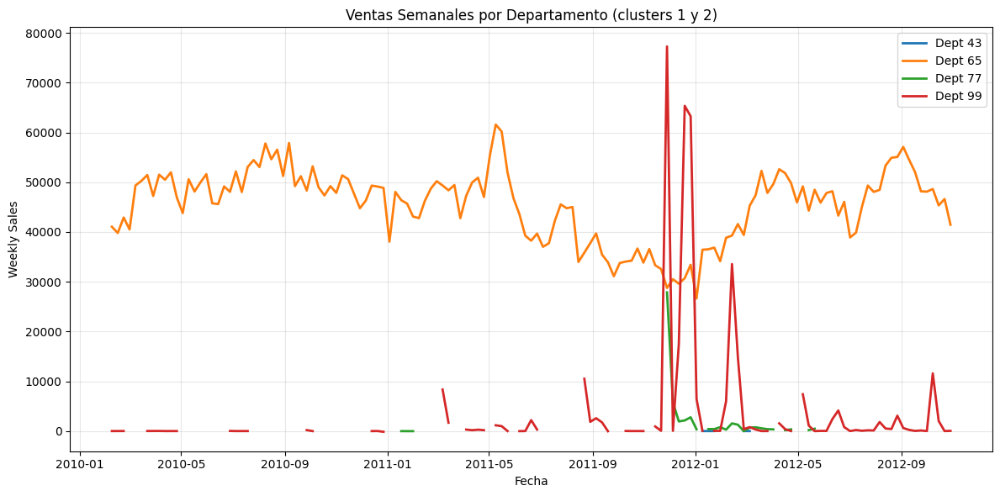

In [ ]:
# 1) Filtrar filas de df_co para Dept_Cluster 1 y 2
df_filtered = df_co[df_co['Dept_Cluster'].isin([1, 2])].copy()
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

# 2) Agregar ventas semanales por departamento
weekly_dept_sales = (
    df_filtered
      .groupby(['Dept', pd.Grouper(key='Date', freq='W-MON')])['Weekly_Sales']
      .sum()
      .reset_index()
)

# 3) Pivot para tener columnas por departamento
pivot_weekly_dept = weekly_dept_sales.pivot(index='Date', columns='Dept', values='Weekly_Sales')


# 5) Estadísticas descriptivas por departamento
desc_stats = weekly_dept_sales.groupby('Dept')['Weekly_Sales'].describe().round(2)
print("Estadísticas semanales de ventas por Departamento (Clusters 1 y 2):")

# 6) Gráfico de ejemplos para 4 departamentos
sample_depts = pivot_weekly_dept.columns[:4]  
plt.figure(figsize=(12, 6))
for dept in sample_depts:
    plt.plot(pivot_weekly_dept.index, pivot_weekly_dept[dept], label=f'Dept {dept}', linewidth=2)
plt.title('Ventas Semanales por Departamento (clusters 1 y 2)')
plt.xlabel('Fecha')
plt.ylabel('Weekly Sales')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Se elaboró un gráfico de Ventas Semanales con los 4 departamentos para evaluar su comportamiento. Con dicho gráfico, pudimos darnos cuenta de que los departamentos 77 (cluster 1) y 43 (cluster 2) contaban con muchos datos faltantes, lo que hacia su predicción casi imposible. Por otra parte, el departamento 99 (cluster 1) aunque contaba con más datos, seguía teniendo faltantes y picos muy extremos en momentos específicos del año. El único departamento con serie completa es el 65 (cluster 2) donde podemos ver que es el único con los datos completos pero con mucha inestabilidad en las ventas.

,MAE,RMSE,R2
Model,,,
LinearRegression,10054.720422,11192.312760,-3.019825
ExtraTrees,12006.554977,13291.531123,-4.669145
RandomForest,12434.454526,13454.182218,-4.808742
GradientBoosting,12731.189836,13727.649245,-5.047277
XGBoost,15818.725558,16775.403994,-8.030535


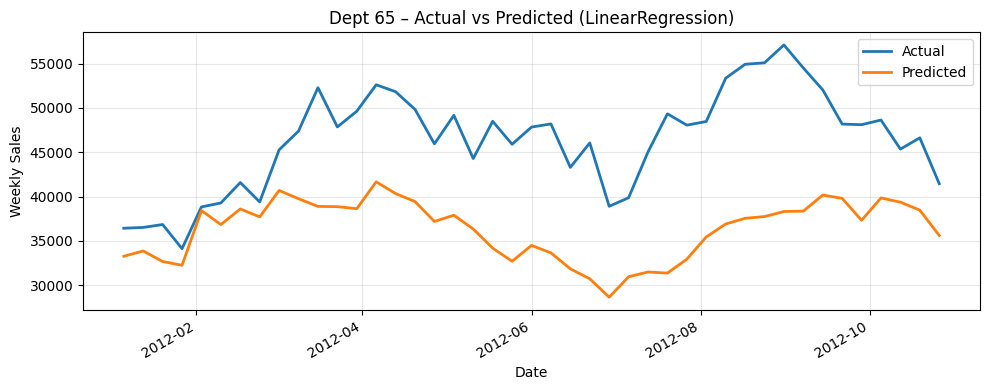

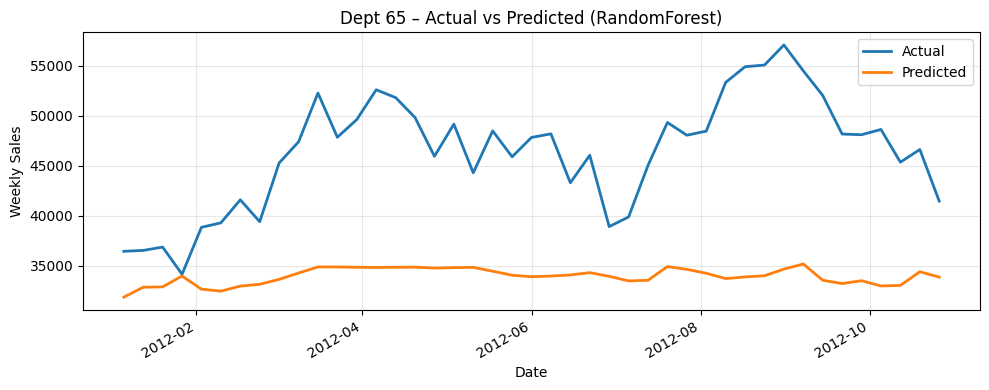

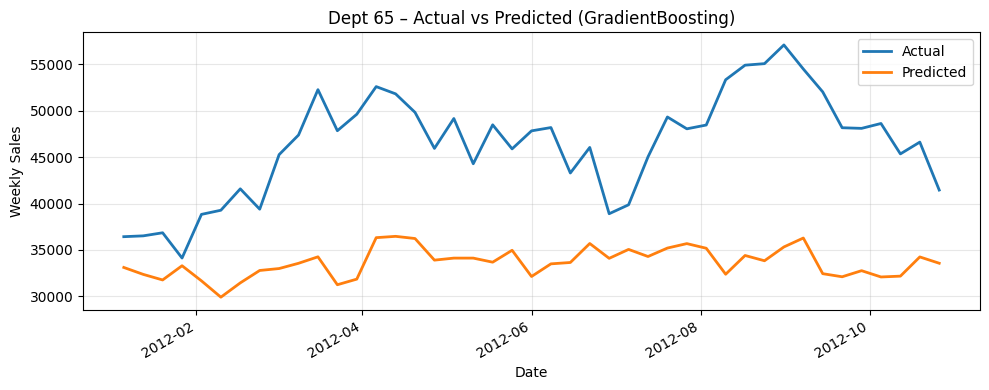

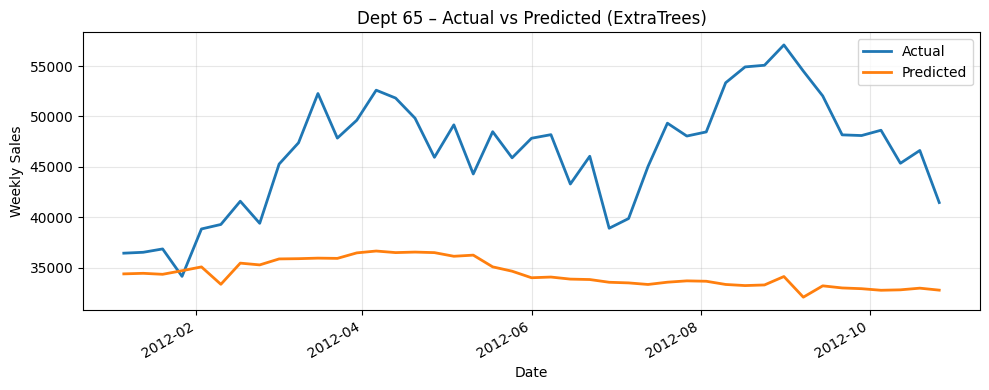

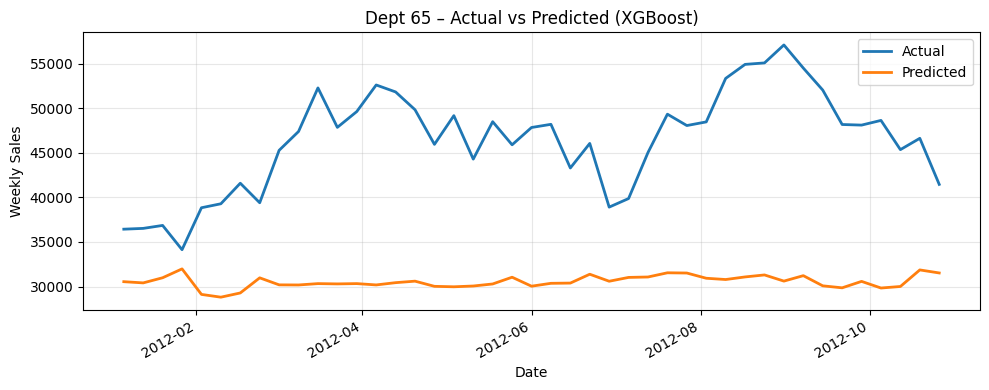

In [ ]:
# 1) Filtrar datos para el departamento 65
df_d65 = df_co[df_co['Dept'] == 65].sort_values('Date').copy()
df_d65['Date'] = pd.to_datetime(df_d65['Date'])

# 2) Definir features y target
features = [
    'Size','CPI','Unemployment','Fuel_Price','Temperature',
    'PromoStrength','IsHoliday','HasPromotion','HolidaySeason',
    'IsEndOfYear','week','month','WeekSin','Trend'
]
X = df_d65[features + ['Type']].copy()
y = df_d65['Weekly_Sales']

# 3) One-Hot Encoding de 'Type' y conversión de booleanos a int
X = pd.get_dummies(X, columns=['Type'], drop_first=True)
bool_cols = X.select_dtypes(include='bool').columns
X[bool_cols] = X[bool_cols].astype(int)

# 4) División train/test (70% train, 30% test), sin shuffle
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, shuffle=False, random_state=42
)

# 5) Definir los 5 modelos a probar
models = {
    'LinearRegression': LinearRegression(),
    'RandomForest':     RandomForestRegressor(n_estimators=100, random_state=42),
    'GradientBoosting': GradientBoostingRegressor(random_state=42),
    'ExtraTrees':       ExtraTreesRegressor(n_estimators=100, random_state=42),
    'XGBoost':          XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
}

# 6) Entrenar, predecir y calcular métricas
results = []
predictions = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)
    
    results.append({
        'Model': name,
        'MAE':   mae,
        'RMSE':  rmse,
        'R2':    r2
    })
    
    # Guardar predicciones para gráfico
    df_pred = pd.DataFrame({
        'Date':      df_d65.loc[y_test.index, 'Date'],
        'Actual':    y_test.values,
        'Predicted': y_pred
    }).groupby('Date').sum().reset_index()
    predictions[name] = df_pred

# 7) Mostrar métricas comparativas
metrics_df = pd.DataFrame(results).set_index('Model').sort_values('RMSE')
display(metrics_df)

# 8) Graficar real vs predicho para cada modelo
for name, df_pred in predictions.items():
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(df_pred['Date'], df_pred['Actual'],    label='Actual',    linewidth=2)
    ax.plot(df_pred['Date'], df_pred['Predicted'], label='Predicted', linewidth=2)
    ax.set_title(f"Dept 65 – Actual vs Predicted ({name})")
    ax.set_xlabel('Date'); ax.set_ylabel('Weekly Sales')
    ax.legend(); ax.grid(alpha=0.3)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    fig.autofmt_xdate()
    plt.tight_layout()
    plt.show()


Buscando mejorar la predicción del departamento 65 usamos 5 modelos distintos para evaluar con cual se encontraba una mejor predicción, sin embargo, los resultados no fueron óptimos en ninguno de los casos dando resultados negativos en todos ellos.

In [1]:
# 3.4 Correlación entre variables numéricas
num_vars = ['Size', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'Weekly_Sales']

plt.figure(figsize=(10, 6))
corr_matrix = df_co[num_vars].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Matriz de correlación entre variables numéricas")
plt.tight_layout()
plt.show()

NameError: name 'plt' is not defined